In [1]:
# import important libraries/modules
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
# suppress warnings
import warnings
warnings.filterwarnings('ignore')

In [2]:
# read data from file and have a feel for it
df = pd.read_csv('loan.csv')
print(df.shape)
print(df.head(5))
print(df.info())

(39717, 111)
        id  member_id  loan_amnt  funded_amnt  funded_amnt_inv        term  \
0  1077501    1296599       5000         5000           4975.0   36 months   
1  1077430    1314167       2500         2500           2500.0   60 months   
2  1077175    1313524       2400         2400           2400.0   36 months   
3  1076863    1277178      10000        10000          10000.0   36 months   
4  1075358    1311748       3000         3000           3000.0   60 months   

  int_rate  installment grade sub_grade  ... num_tl_90g_dpd_24m  \
0   10.65%       162.87     B        B2  ...                NaN   
1   15.27%        59.83     C        C4  ...                NaN   
2   15.96%        84.33     C        C5  ...                NaN   
3   13.49%       339.31     C        C1  ...                NaN   
4   12.69%        67.79     B        B5  ...                NaN   

  num_tl_op_past_12m pct_tl_nvr_dlq  percent_bc_gt_75 pub_rec_bankruptcies  \
0                NaN            NaN  

In [3]:
# remove columns having null values > 35%
# 54 of 110 columns have more than 99% missing values. We will drop these columns.
missing_cols = df.isnull().mean()*100
for col in missing_cols.index:
    if missing_cols[col] > 35:
        print(col, missing_cols[col])
        df = df.drop(col, axis=1)

mths_since_last_delinq 64.66248709620565
mths_since_last_record 92.98537150338646
next_pymnt_d 97.12969257496789
mths_since_last_major_derog 100.0
annual_inc_joint 100.0
dti_joint 100.0
verification_status_joint 100.0
tot_coll_amt 100.0
tot_cur_bal 100.0
open_acc_6m 100.0
open_il_6m 100.0
open_il_12m 100.0
open_il_24m 100.0
mths_since_rcnt_il 100.0
total_bal_il 100.0
il_util 100.0
open_rv_12m 100.0
open_rv_24m 100.0
max_bal_bc 100.0
all_util 100.0
total_rev_hi_lim 100.0
inq_fi 100.0
total_cu_tl 100.0
inq_last_12m 100.0
acc_open_past_24mths 100.0
avg_cur_bal 100.0
bc_open_to_buy 100.0
bc_util 100.0
mo_sin_old_il_acct 100.0
mo_sin_old_rev_tl_op 100.0
mo_sin_rcnt_rev_tl_op 100.0
mo_sin_rcnt_tl 100.0
mort_acc 100.0
mths_since_recent_bc 100.0
mths_since_recent_bc_dlq 100.0
mths_since_recent_inq 100.0
mths_since_recent_revol_delinq 100.0
num_accts_ever_120_pd 100.0
num_actv_bc_tl 100.0
num_actv_rev_tl 100.0
num_bc_sats 100.0
num_bc_tl 100.0
num_il_tl 100.0
num_op_rev_tl 100.0
num_rev_accts 1

In [4]:
# remove columns with 100% same/duplicate values
for col in df.columns:
    if df[col].nunique() == 1:
        print(col)
        df = df.drop(col, axis=1)
print(df.nunique())
print(df.shape)

pymnt_plan
initial_list_status
collections_12_mths_ex_med
policy_code
application_type
acc_now_delinq
chargeoff_within_12_mths
delinq_amnt
tax_liens
id                         39717
member_id                  39717
loan_amnt                    885
funded_amnt                 1041
funded_amnt_inv             8205
term                           2
int_rate                     371
installment                15383
grade                          7
sub_grade                     35
emp_title                  28820
emp_length                    11
home_ownership                 5
annual_inc                  5318
verification_status            3
issue_d                       55
loan_status                    3
url                        39717
desc                       26526
purpose                       14
title                      19615
zip_code                     823
addr_state                    50
dti                         2868
delinq_2yrs                   11
earliest_cr_line          

In [5]:
# massage data to make it ready for analysis
df['emp_length'] = df['emp_length'].fillna('10+ years')
df = df[(df['annual_inc'] > 5000) & (df['annual_inc'] < 200000)]
# correct types
df['revol_util'] = df['revol_util'].str.replace('%', '').astype(float)
df['int_rate'] = df['int_rate'].str.replace('%', '').astype(float)
df['grade'] = df['grade'].astype('category')
df['sub_grade'] = df['sub_grade'].astype('category')
df['emp_length'] = df['emp_length'].str.extract('(\d+)').astype(float)
df = df[(df['loan_status'] == 'Fully Paid') | (df['loan_status'] == 'Charged Off')]
df['loan_status'] = df['loan_status'].apply(lambda x: 1 if x == 'Charged Off' else 0)

In [6]:
# numerical colums
num_cols = ['loan_amnt', 'int_rate', 'installment', 'annual_inc', 'dti', 'open_acc', 'revol_bal', 'revol_util', 
            'total_acc', 'out_prncp', 'total_pymnt', 'total_rec_prncp', 'total_rec_int', 'total_rec_late_fee', 
            'recoveries', 'collection_recovery_fee', 'last_pymnt_amnt']

Median: 9600.00
q1: 5150.00
q3: 15000.00


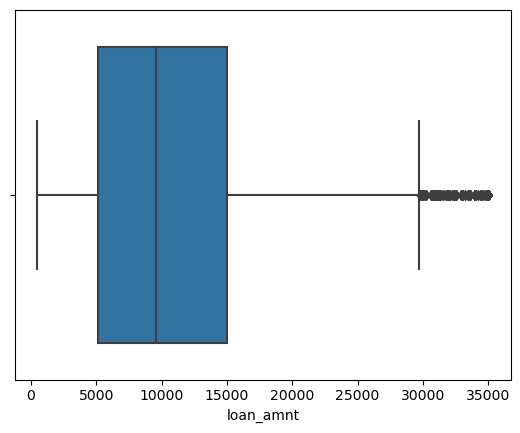

Median: 11.71
q1: 8.94
q3: 14.35


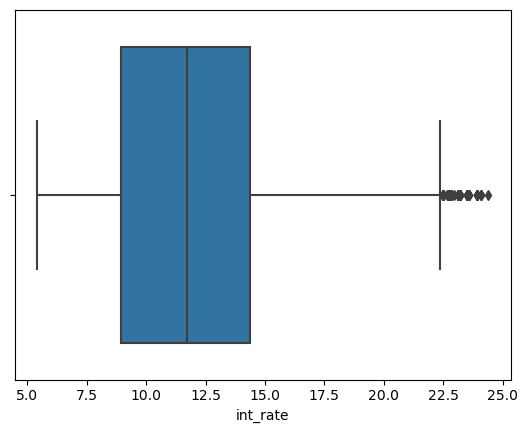

Median: 275.28
q1: 164.86
q3: 418.50


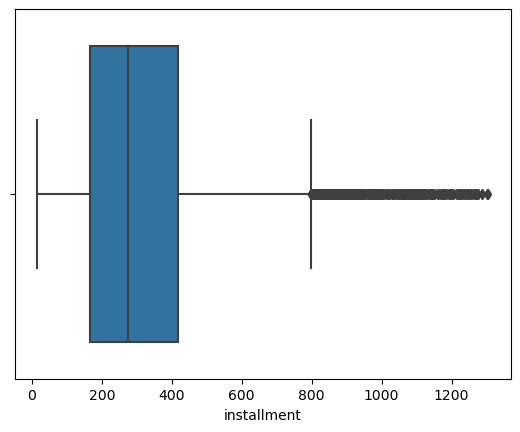

Median: 57906.00
q1: 40000.00
q3: 80000.00


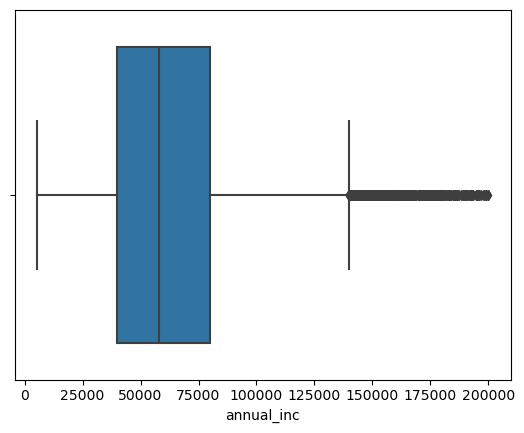

Median: 13.47
q1: 8.25
q3: 18.63


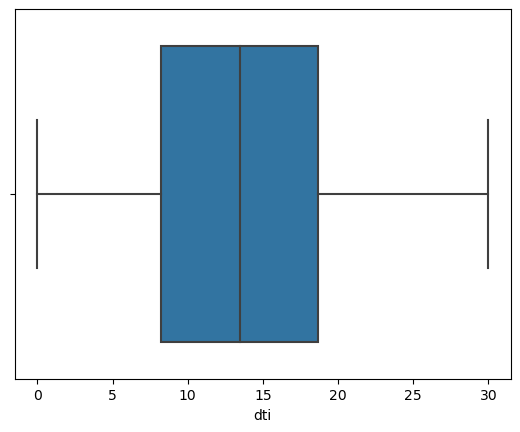

Median: 9.00
q1: 6.00
q3: 12.00


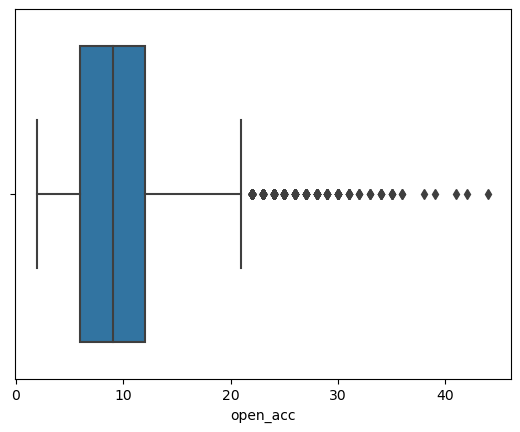

Median: 8664.00
q1: 3625.00
q3: 16616.75


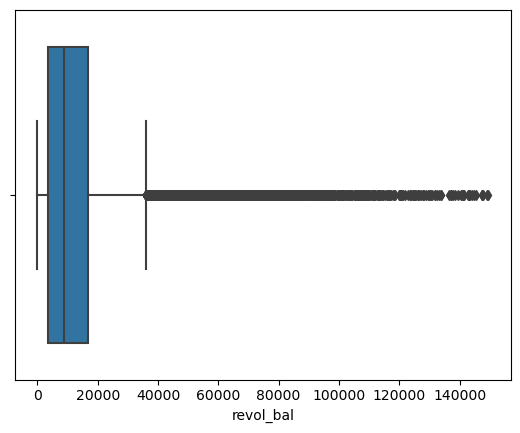

Median: 49.10
q1: 25.20
q3: 72.20


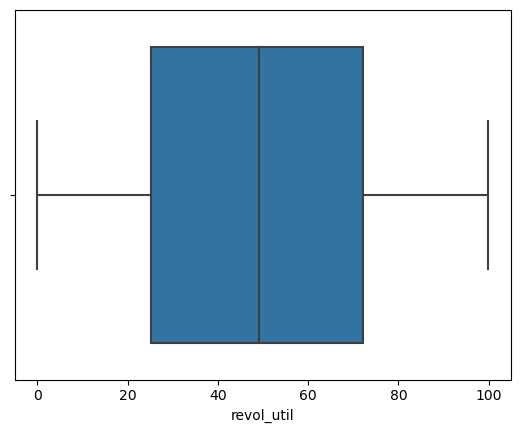

Median: 20.00
q1: 13.00
q3: 29.00


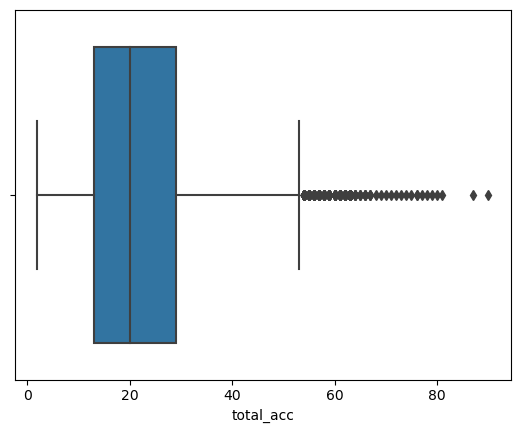

Median: 0.00
q1: 0.00
q3: 0.00


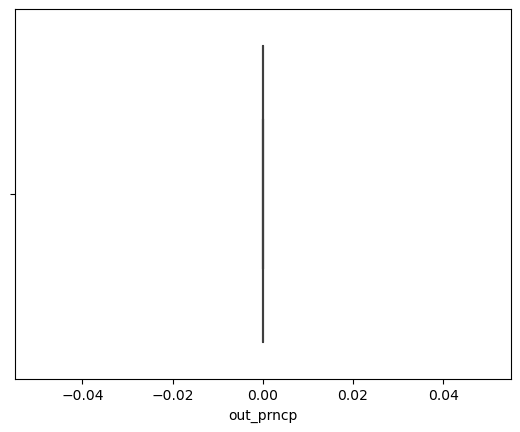

Median: 9548.77
q1: 5478.39
q3: 15827.37


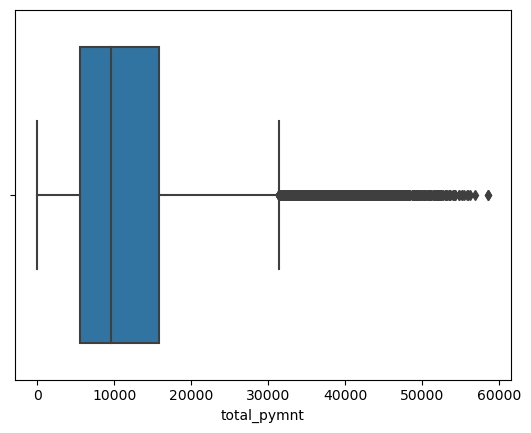

Median: 8000.00
q1: 4500.00
q3: 13000.00


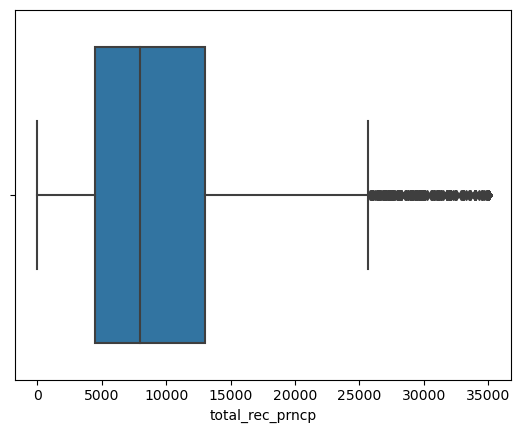

Median: 1284.57
q1: 638.62
q3: 2629.64


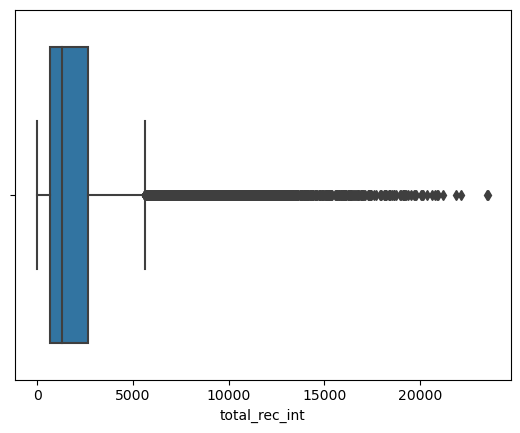

Median: 0.00
q1: 0.00
q3: 0.00


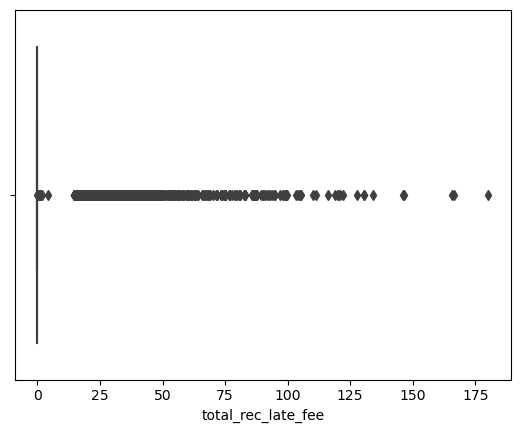

Median: 0.00
q1: 0.00
q3: 0.00


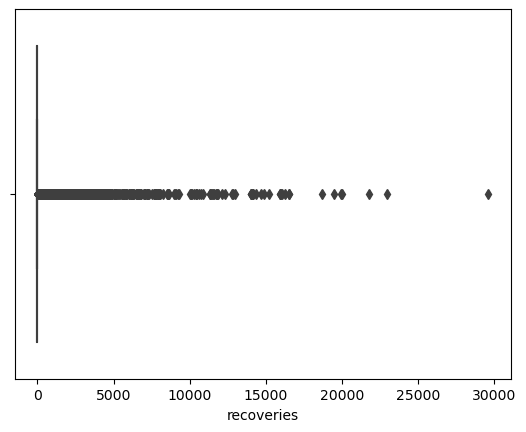

Median: 0.00
q1: 0.00
q3: 0.00


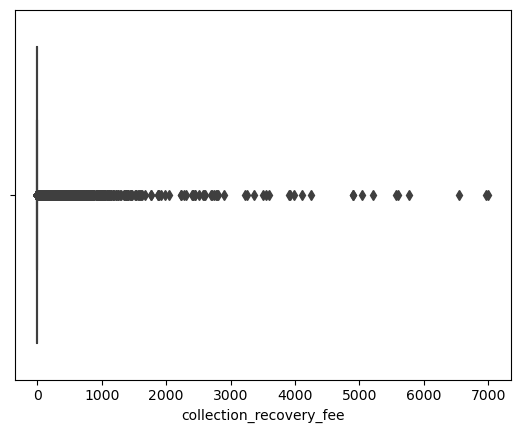

Median: 559.11
q1: 215.63
q3: 3382.50


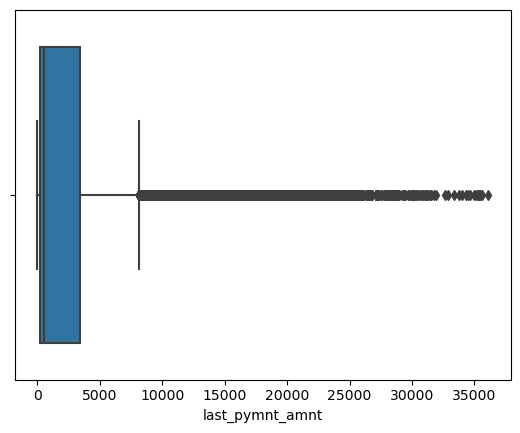

In [7]:
#univariate analysis of numerical columns
for col in num_cols:
    #sns.histplot(x=df[col])
    #plt.show()

    # Create boxplot
    sns.boxplot(data=df, x=col)

    # Calculate median and IQR
    median = df[col].median()
    q1 = df[col].quantile(0.25)
    q3 = df[col].quantile(0.75)
    
    # Annotate plot with median and IQR values
    #plt.text(0, median + 0.5, f'Median: {median:.2f}\nq1: {q1:.2f}\nq3: {q3:.2f}', horizontalalignment='center', size='medium', color='black', weight='semibold')
    print(f'Median: {median:.2f}\nq1: {q1:.2f}\nq3: {q3:.2f}')
    plt.show()

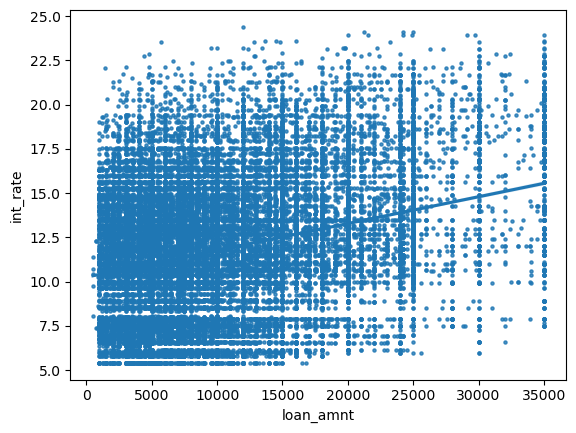

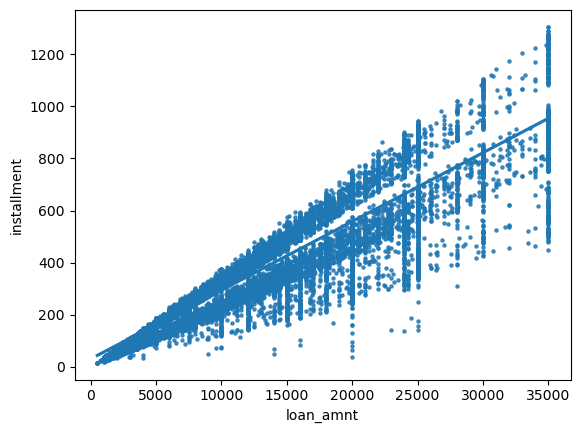

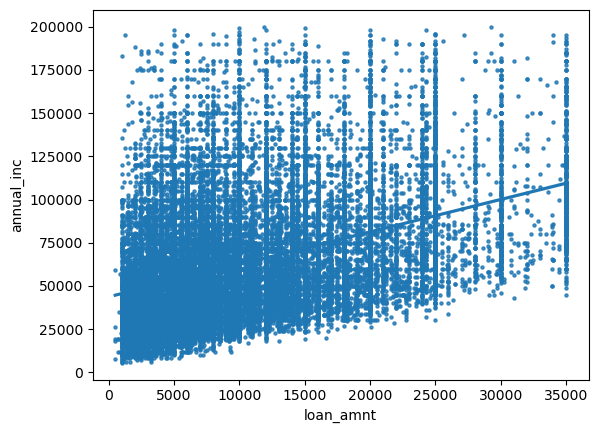

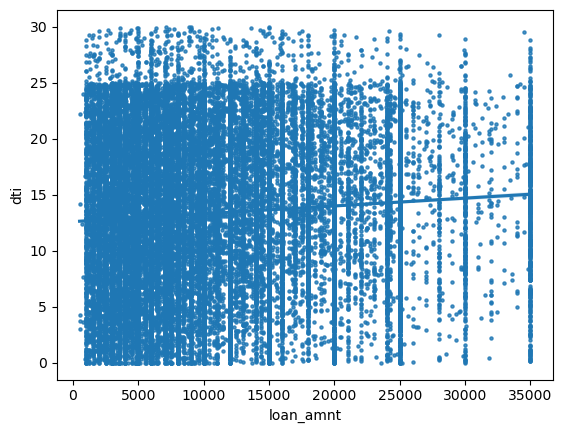

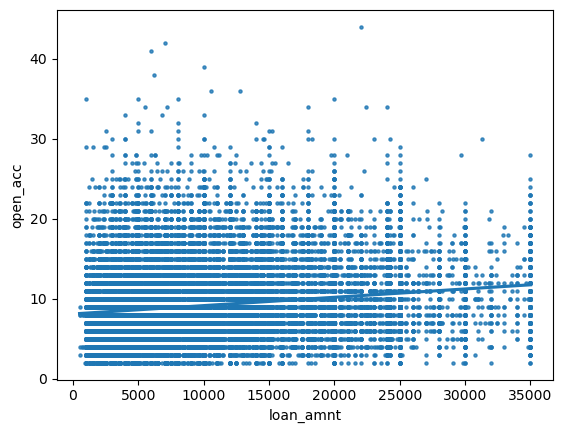

...

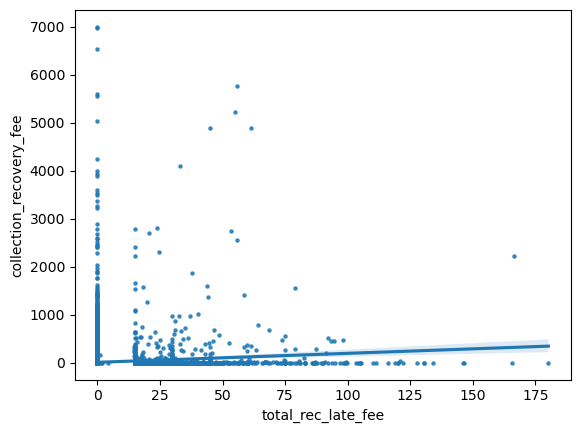

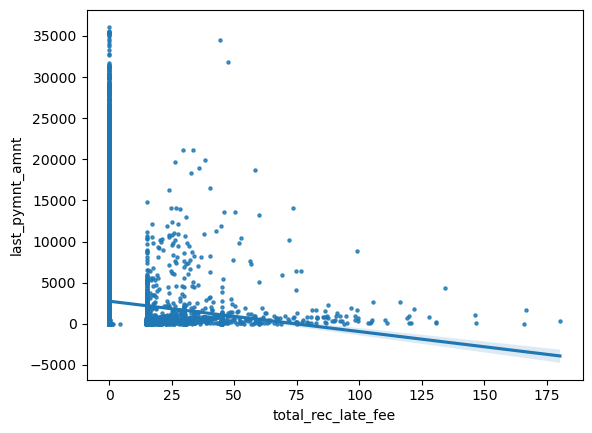

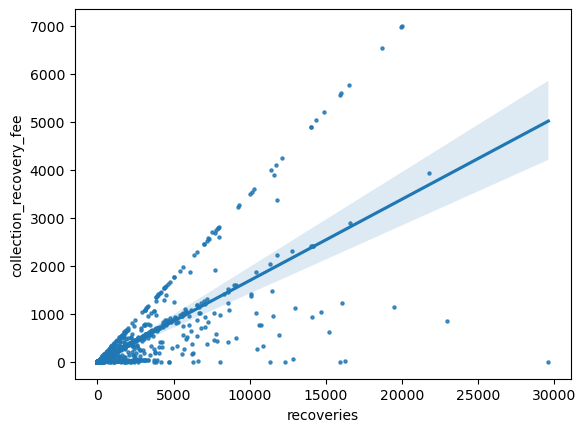

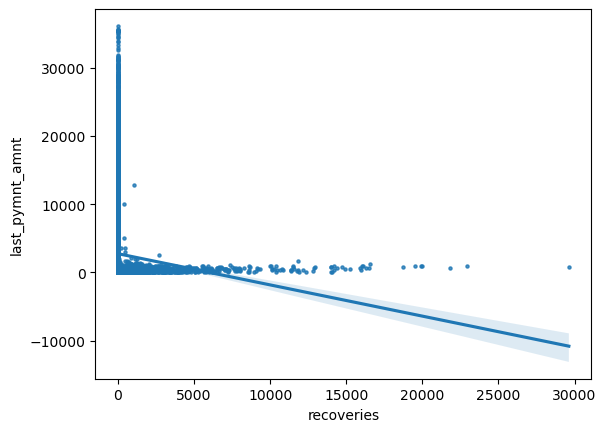

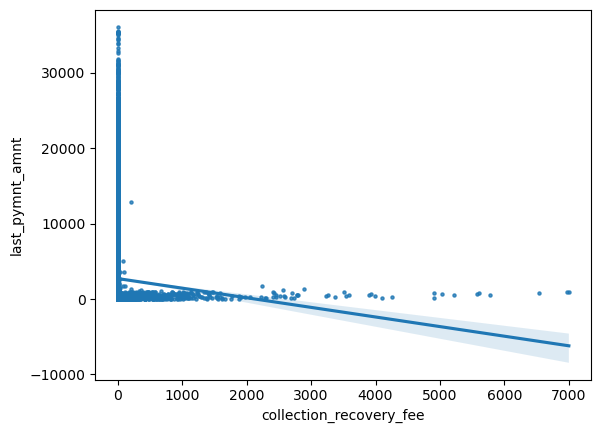

In [8]:
#bivariate analysis of numerical bivariate columns
for i in range(len(num_cols)):
    for j in range(i+1, len(num_cols)):
        #sns.scatterplot(x=df[num_cols[i]], y=df[num_cols[j]])
        sns.regplot(x=df[num_cols[i]], y=df[num_cols[j]], scatter_kws={"s": 5})  # scatter_kws sets the size of the points
        plt.show()

In [9]:
# categorical columns
cat_cols = ['term', 'grade', 'sub_grade', 'emp_length', 'home_ownership', 'verification_status', 'loan_status', 'purpose', 
            'delinq_2yrs', 'inq_last_6mths', 'pub_rec', 'pub_rec_bankruptcies']

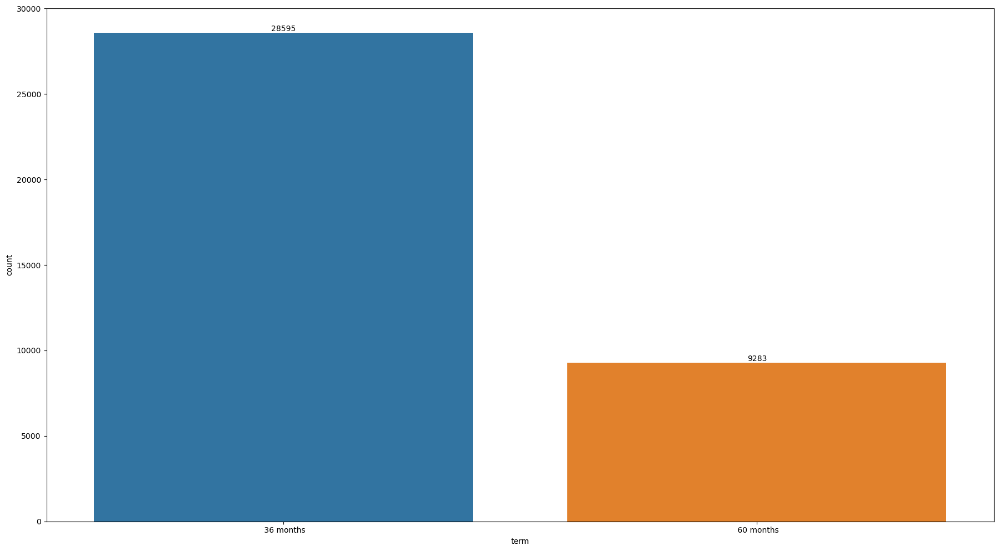

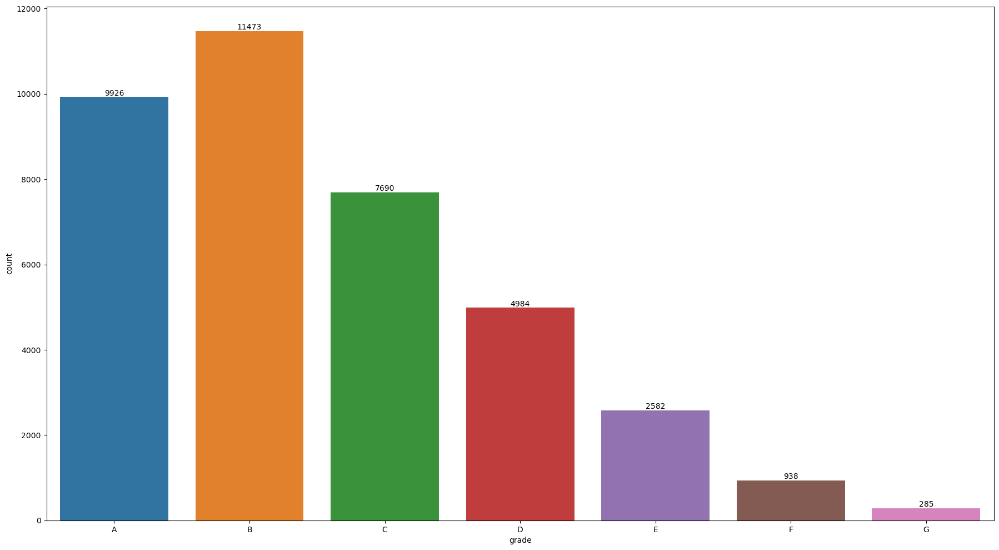

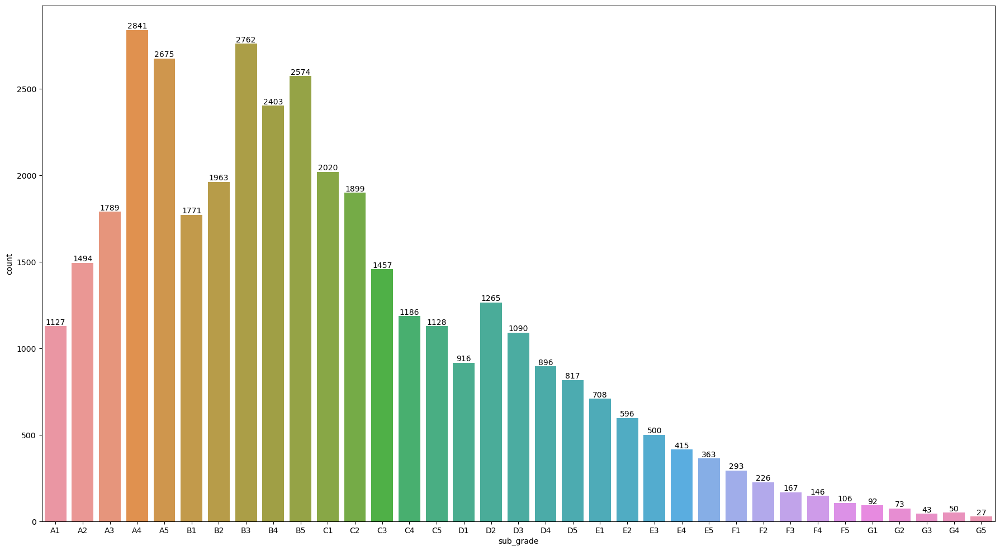

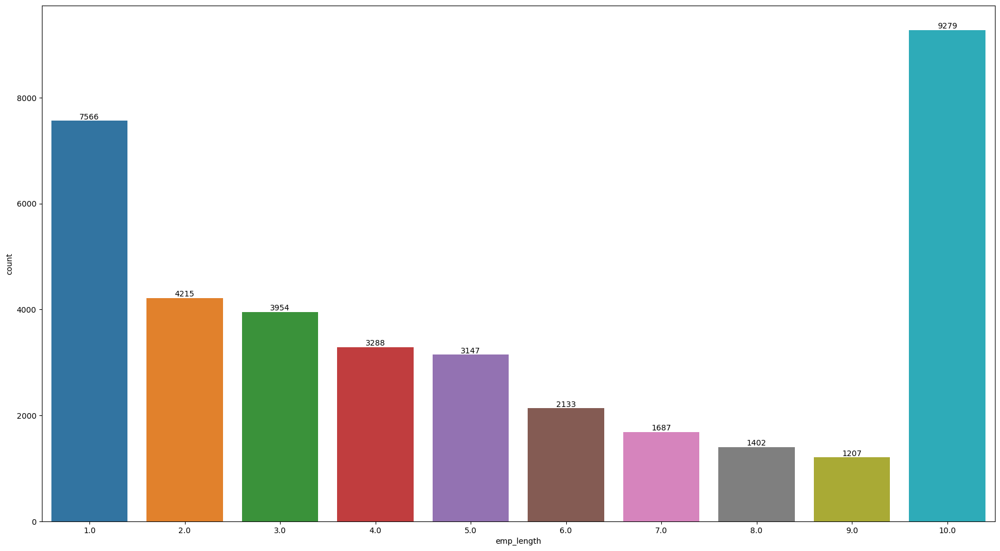

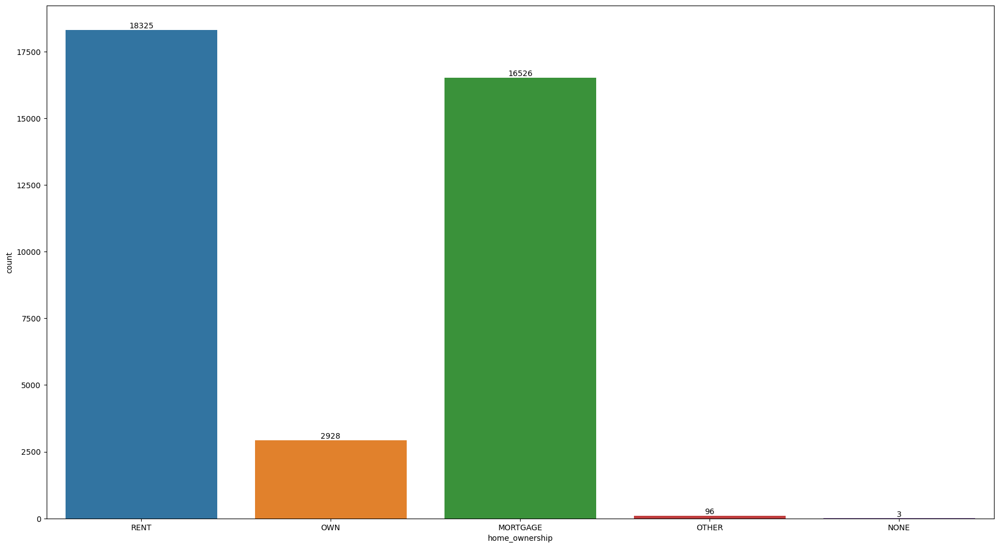

...

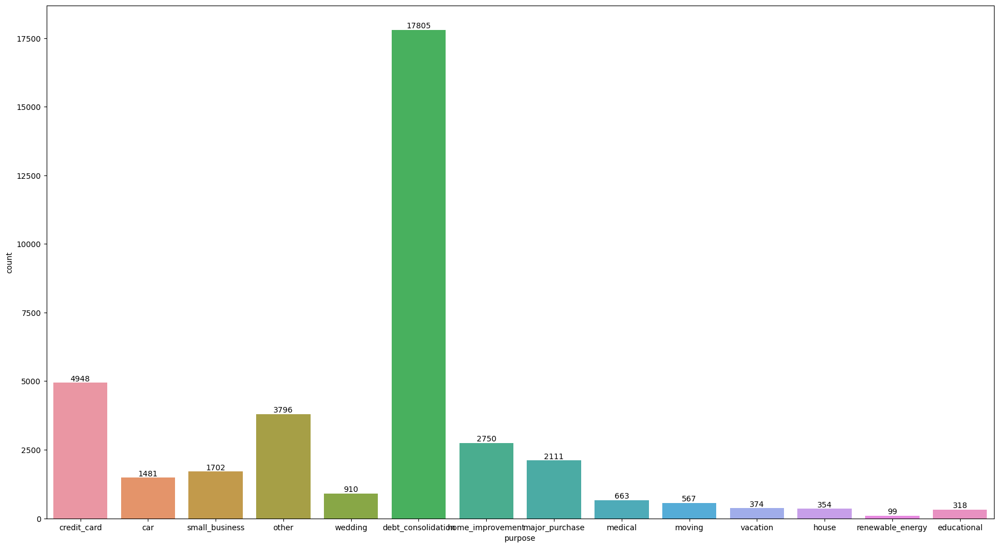

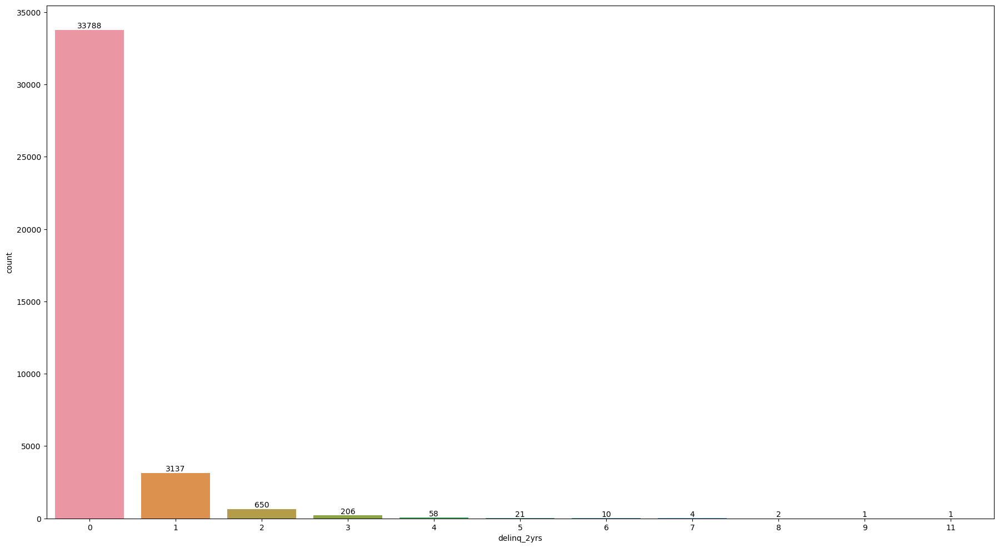

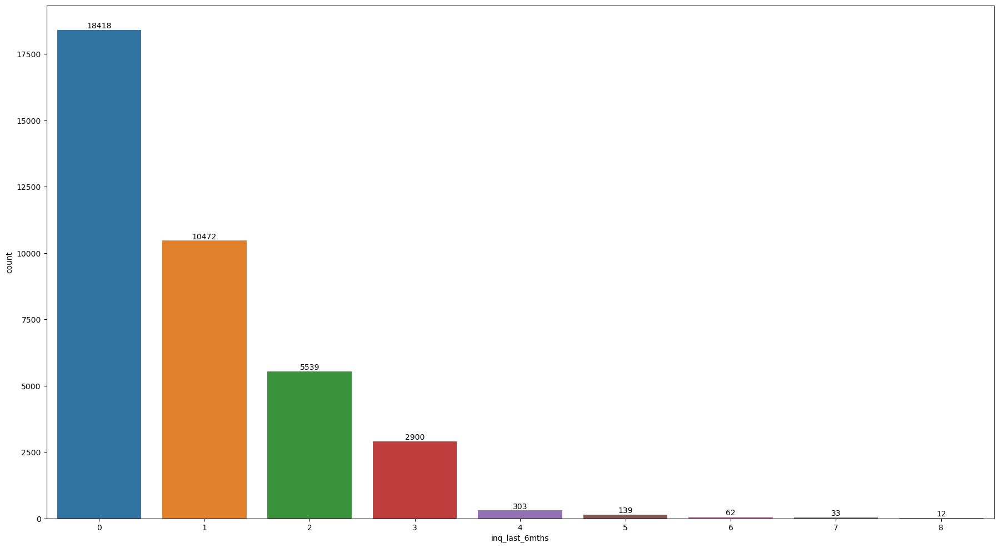

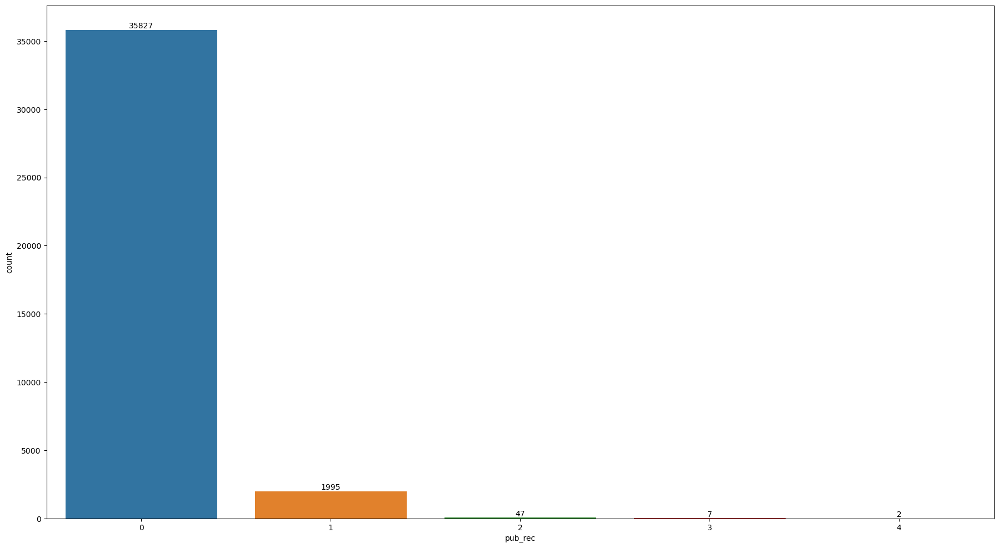

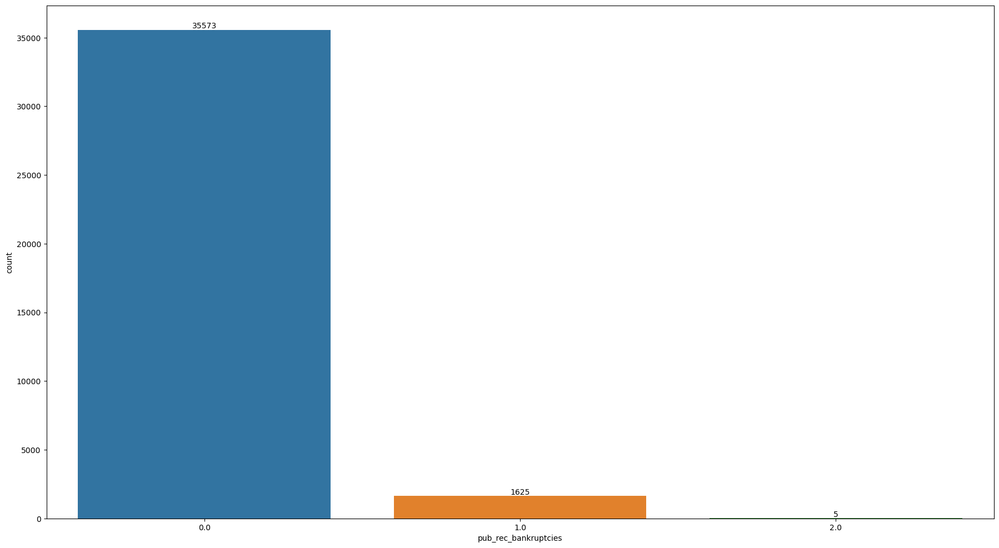

In [10]:
# univariate analysis of categorical columns
for col in cat_cols:
    plt.figure(figsize=(22, 12))
    ax = sns.countplot(x=df[col])
    
    # Add count values on top of each bar
    for p in ax.patches:
        ax.annotate(format(p.get_height(), '.0f'), 
                    (p.get_x() + p.get_width() / 2., p.get_height()), 
                    ha = 'center', va = 'center', xytext = (0, 5), textcoords = 'offset points')

    plt.show()

Median: 8000.00
q1: 5000.00
q3: 12000.00
Median: 14400.00
q1: 9000.00
q3: 20000.00


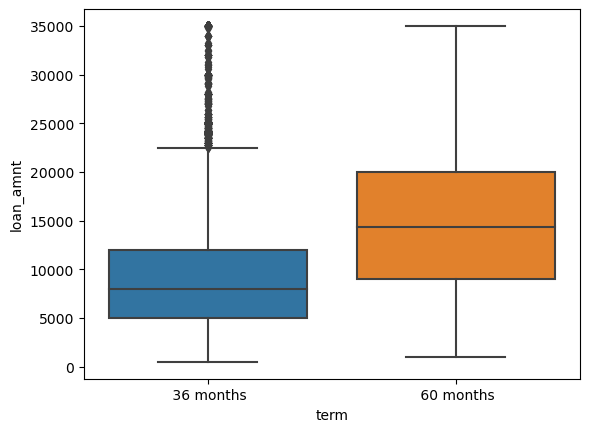

Median: 10.99
q1: 7.90
q3: 13.47
Median: 14.83
q1: 11.86
q3: 17.43


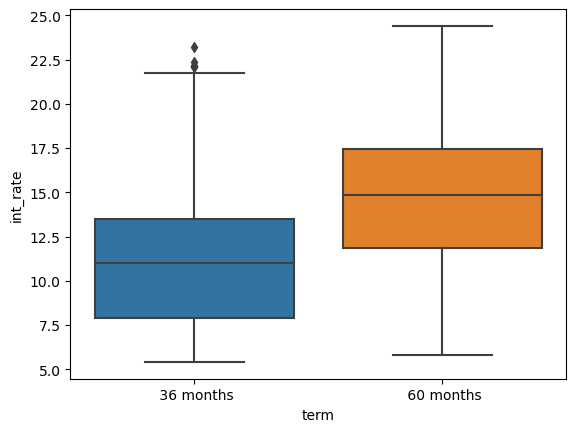

Median: 260.06
q1: 159.41
q3: 400.99
Median: 318.64
q1: 198.14
q3: 468.17


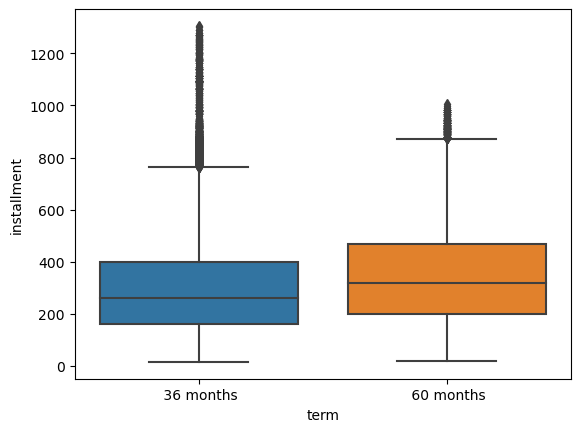

Median: 55596.00
q1: 39996.00
q3: 79631.50
Median: 61000.00
q1: 45000.00
q3: 85000.00


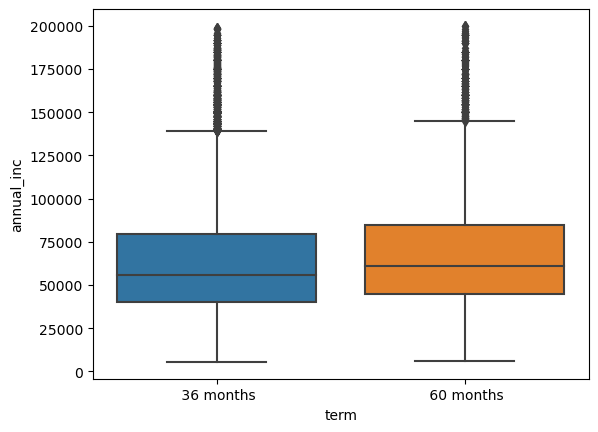

Median: 13.10
q1: 7.89
q3: 18.31
Median: 14.45
q1: 9.46
q3: 19.44


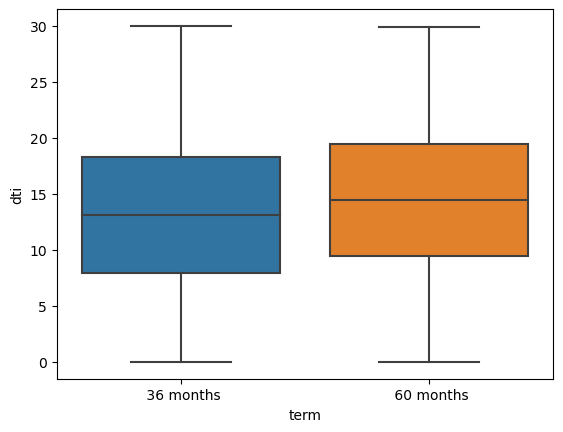

Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00


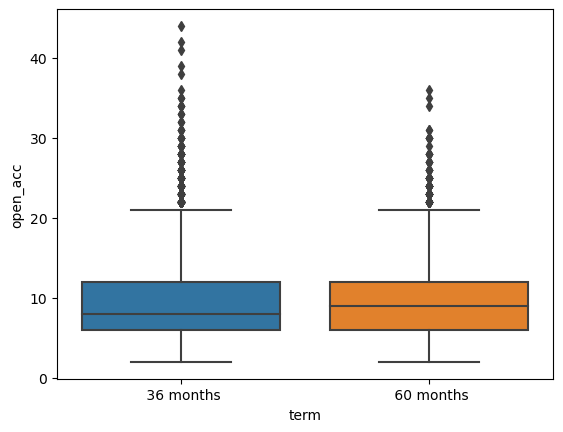

Median: 8129.00
q1: 3372.50
q3: 15669.00
Median: 10541.00
q1: 4602.00
q3: 19354.00


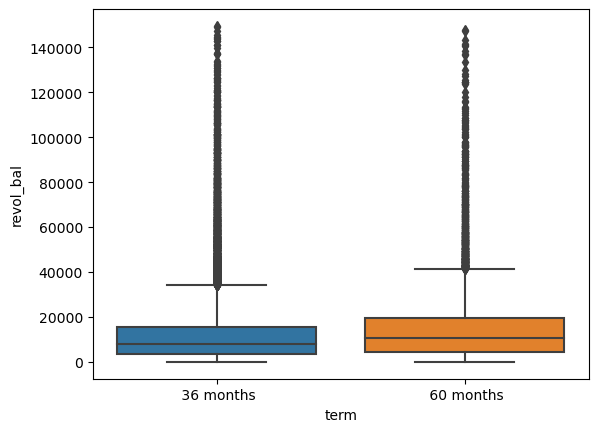

Median: 47.70
q1: 23.90
q3: 71.10
Median: 53.50
q1: 30.10
q3: 75.03


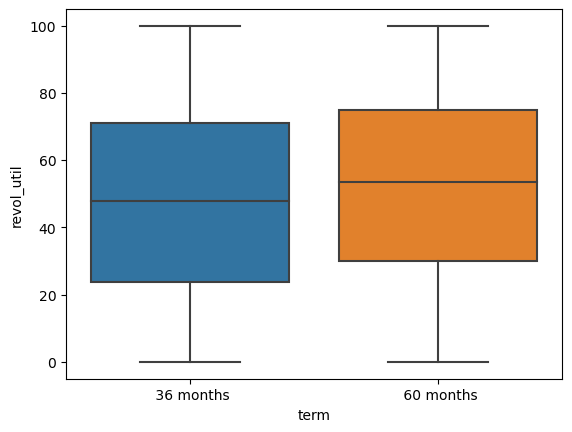

Median: 20.00
q1: 13.00
q3: 28.00
Median: 22.00
q1: 15.00
q3: 31.00


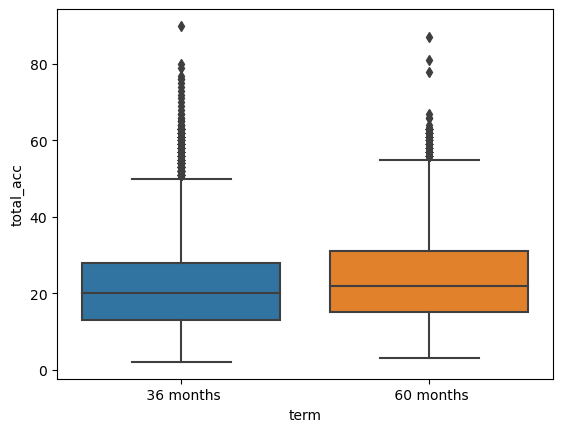

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


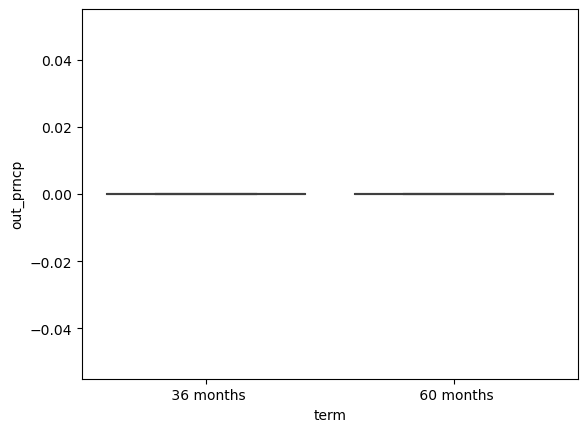

Median: 8491.60
q1: 5041.34
q3: 13514.32
Median: 14679.98
q1: 7702.12
q3: 22506.06


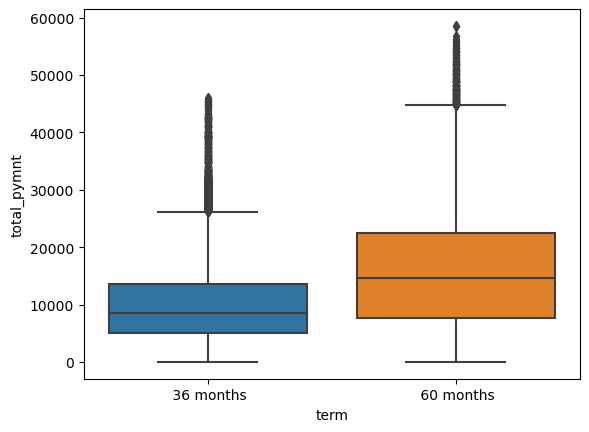

Median: 7200.01
q1: 4200.00
q3: 12000.00
Median: 10771.93
q1: 5000.00
q3: 16750.00


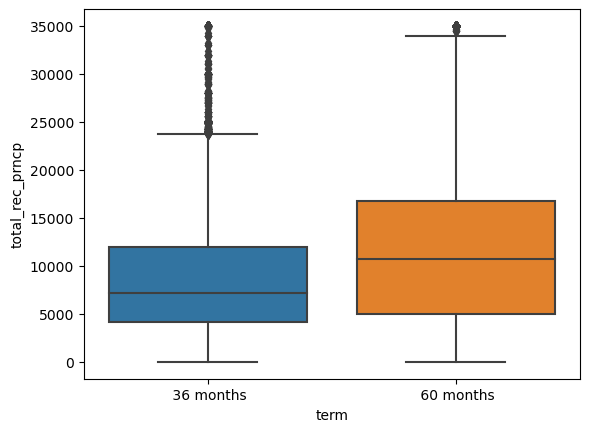

Median: 1027.77
q1: 541.54
q3: 1862.87
Median: 3294.25
q1: 1635.31
q3: 5763.49


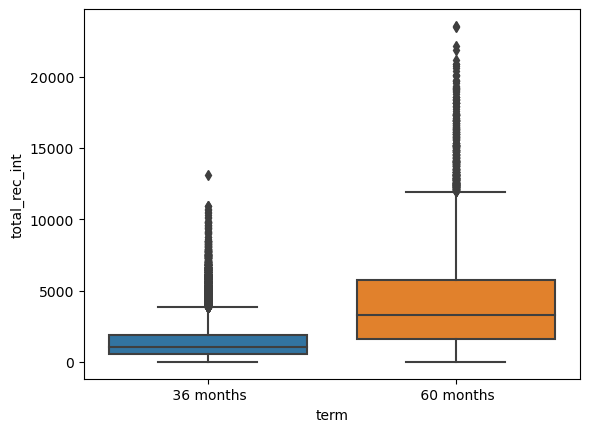

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


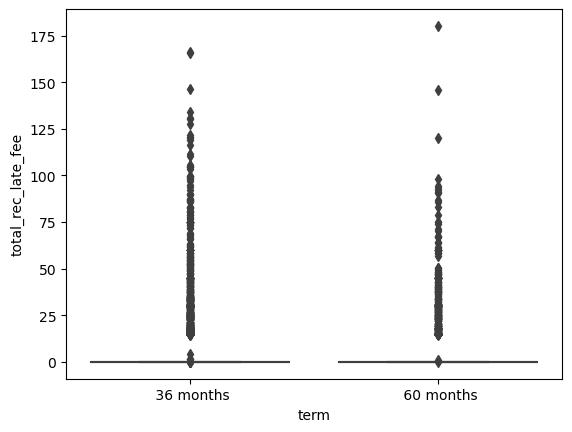

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


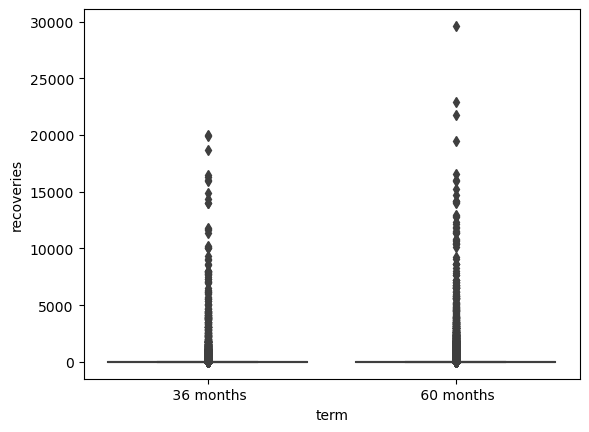

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


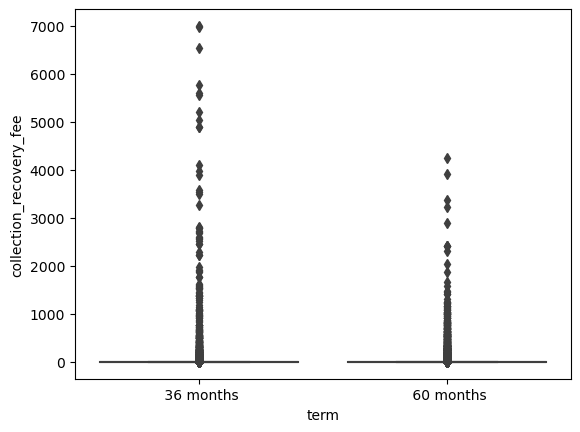

Median: 482.93
q1: 201.88
q3: 2438.12
Median: 1770.49
q1: 285.86
q3: 7600.52


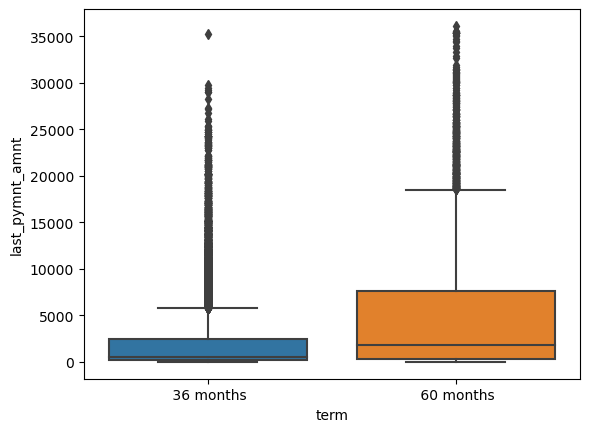

Median: 7500.00
q1: 5000.00
q3: 11000.00
Median: 9600.00
q1: 5000.00
q3: 15000.00
Median: 9250.00
q1: 5000.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 16000.00
Median: 15000.00
q1: 8000.00
q3: 21000.00
Median: 18000.00
q1: 10400.00
q3: 25000.00
Median: 20000.00
q1: 14000.00
q3: 25000.00


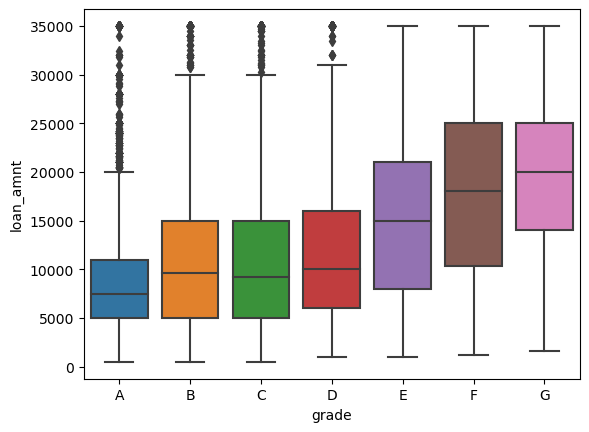

Median: 7.49
q1: 6.62
q3: 7.90
Median: 10.99
q1: 10.37
q3: 11.71
Median: 13.49
q1: 12.99
q3: 13.99
Median: 15.62
q1: 14.91
q3: 16.32
Median: 17.51
q1: 16.64
q3: 18.64
Median: 19.36
q1: 18.43
q3: 20.89
Median: 20.90
q1: 20.16
q3: 22.48


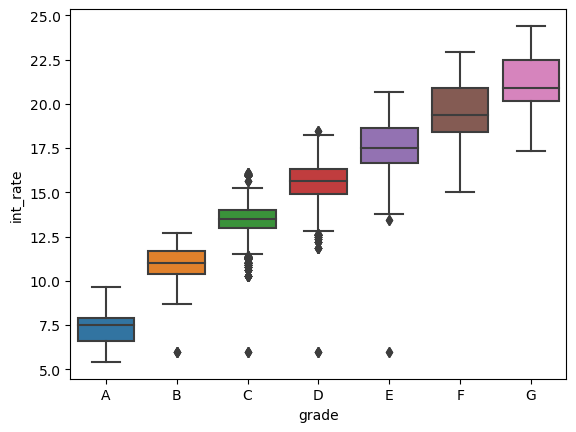

Median: 221.67
q1: 150.80
q3: 319.47
Median: 267.74
q1: 163.67
q3: 420.07
Median: 274.75
q1: 167.67
q3: 418.74
Median: 312.23
q1: 190.47
q3: 482.00
Median: 378.45
q1: 239.36
q3: 568.47
Median: 464.44
q1: 301.03
q3: 658.22
Median: 557.86
q1: 394.58
q3: 743.55


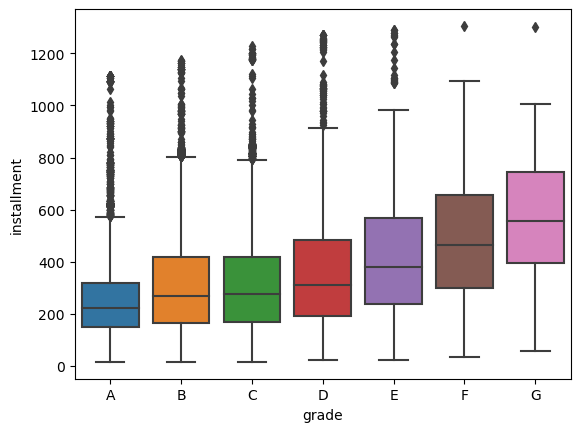

Median: 57000.00
q1: 40000.00
q3: 80000.00
Median: 56900.00
q1: 40000.00
q3: 80000.00
Median: 55000.00
q1: 39960.00
q3: 78495.00
Median: 57996.00
q1: 40000.00
q3: 80000.00
Median: 63000.00
q1: 45000.00
q3: 90000.00
Median: 70000.00
q1: 50004.00
q3: 96000.00
Median: 77004.00
q1: 55000.00
q3: 108000.00


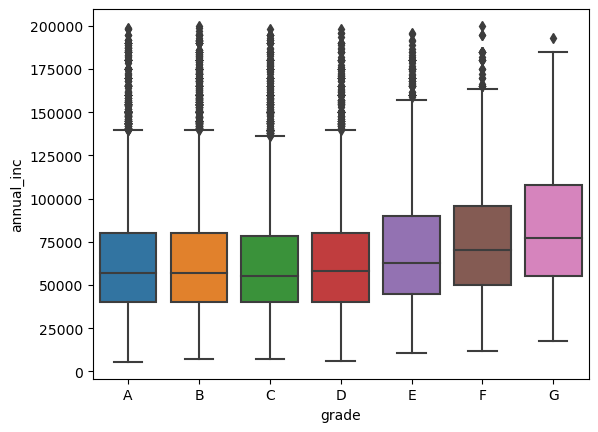

Median: 11.61
q1: 6.56
q3: 17.16
Median: 13.61
q1: 8.45
q3: 18.68
Median: 14.18
q1: 9.12
q3: 19.07
Median: 14.34
q1: 9.30
q3: 19.16
Median: 14.58
q1: 9.50
q3: 19.48
Median: 14.81
q1: 9.83
q3: 19.14
Median: 14.83
q1: 8.43
q3: 19.64


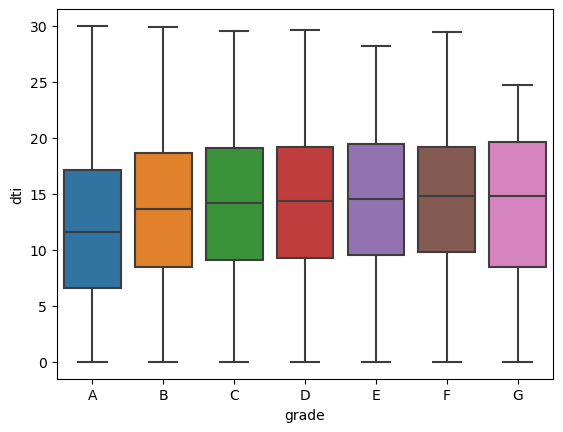

Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 13.00
Median: 9.00
q1: 5.00
q3: 13.00


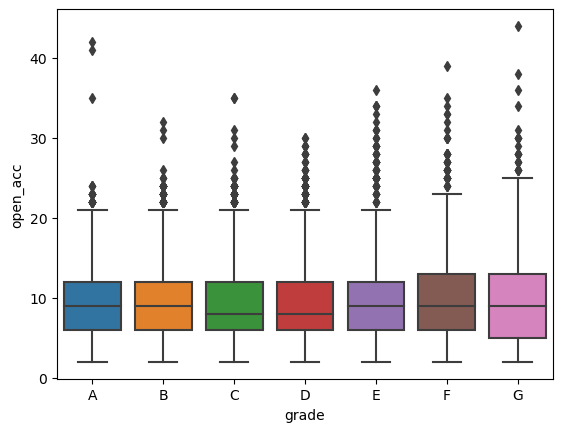

Median: 6735.00
q1: 2701.75
q3: 13725.75
Median: 8923.00
q1: 3788.00
q3: 16649.00
Median: 9091.50
q1: 3934.25
q3: 17147.25
Median: 9228.50
q1: 4298.25
q3: 17645.00
Median: 11415.50
q1: 5414.00
q3: 20890.50
Median: 12012.50
q1: 5636.75
q3: 21113.00
Median: 12958.00
q1: 6708.00
q3: 24109.00


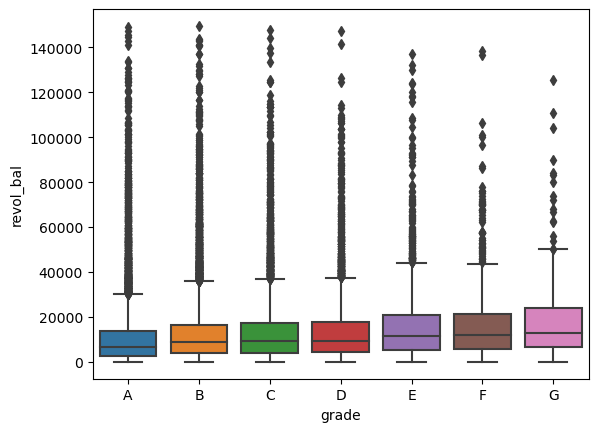

Median: 25.90
q1: 11.20
q3: 45.20
Median: 47.30
q1: 26.60
q3: 67.00
Median: 59.30
q1: 38.30
q3: 78.30
Median: 67.80
q1: 46.00
q3: 84.80
Median: 73.30
q1: 51.98
q3: 89.20
Median: 76.60
q1: 54.58
q3: 92.40
Median: 84.80
q1: 60.25
q3: 95.35


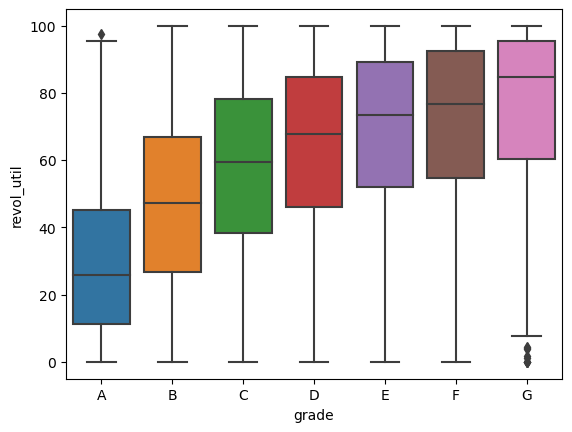

Median: 22.00
q1: 15.00
q3: 30.00
Median: 20.00
q1: 13.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 20.00
q1: 12.00
q3: 29.00
Median: 20.00
q1: 13.00
q3: 31.00
Median: 21.00
q1: 12.00
q3: 31.00


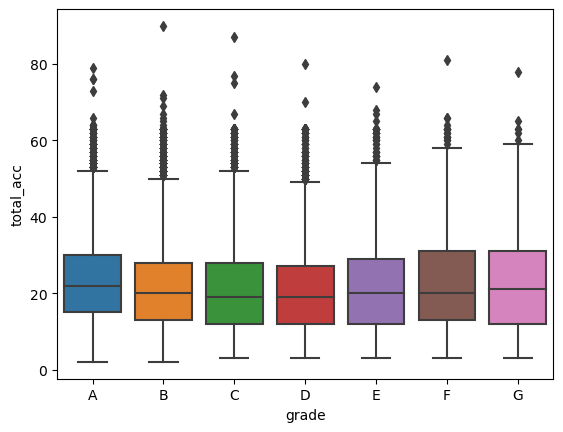

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


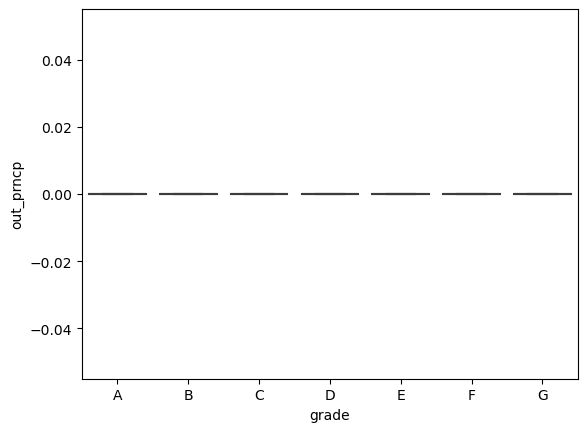

Median: 7838.79
q1: 5128.59
q3: 11379.65
Median: 9862.79
q1: 5623.73
q3: 16046.90
Median: 9573.53
q1: 5100.32
q3: 16383.83
Median: 11046.21
q1: 5928.46
q3: 18352.57
Median: 14831.43
q1: 7320.71
q3: 23709.07
Median: 17423.78
q1: 8508.22
q3: 28000.96
Median: 22521.96
q1: 9476.51
q3: 32863.39


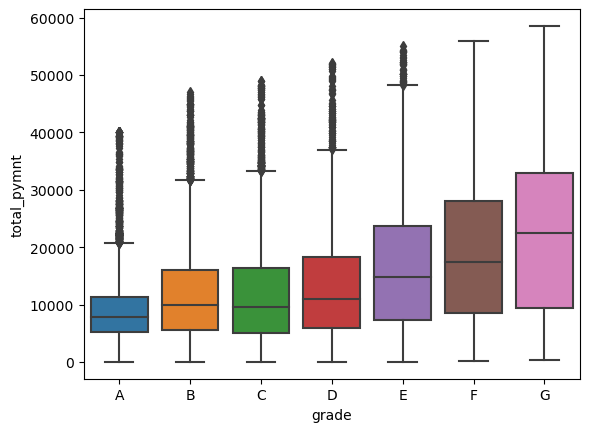

Median: 7000.00
q1: 4606.25
q3: 10000.00
Median: 8000.00
q1: 4800.00
q3: 13800.00
Median: 7750.00
q1: 4000.00
q3: 13000.00
Median: 8299.60
q1: 4143.80
q3: 14626.68
Median: 10000.00
q1: 4714.67
q3: 17913.56
Median: 11974.89
q1: 4449.34
q3: 20000.00
Median: 15000.00
q1: 4317.89
q3: 24000.00


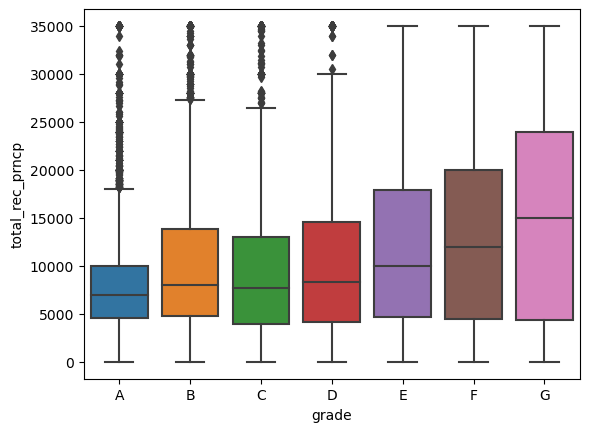

Median: 698.61
q1: 386.87
q3: 1114.09
Median: 1335.09
q1: 695.93
q3: 2374.34
Median: 1599.16
q1: 813.68
q3: 2965.75
Median: 2205.11
q1: 1134.00
q3: 4065.34
Median: 3609.13
q1: 1750.86
q3: 6326.51
Median: 5089.40
q1: 2353.32
q3: 8500.52
Median: 6043.31
q1: 3252.38
q3: 9786.91


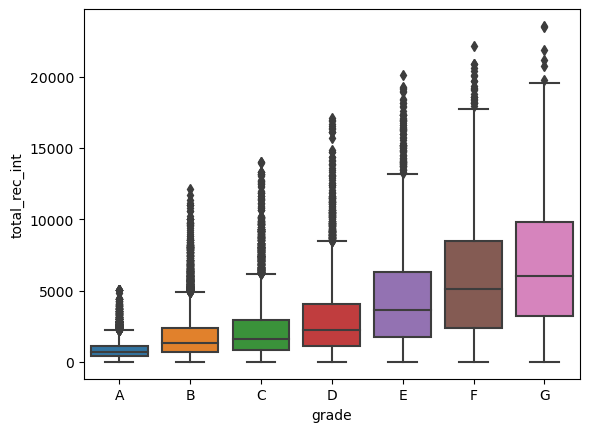

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


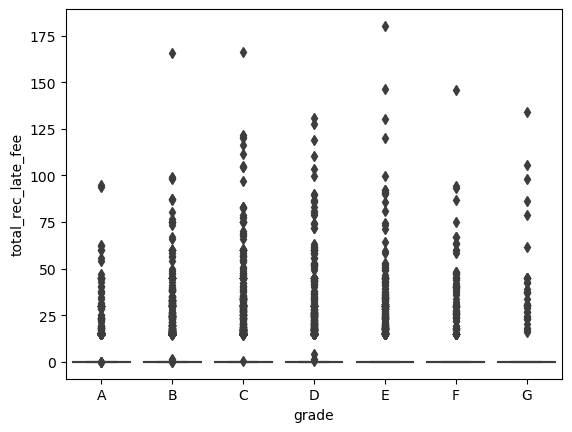

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 18.01
Median: 0.00
q1: 0.00
q3: 19.79


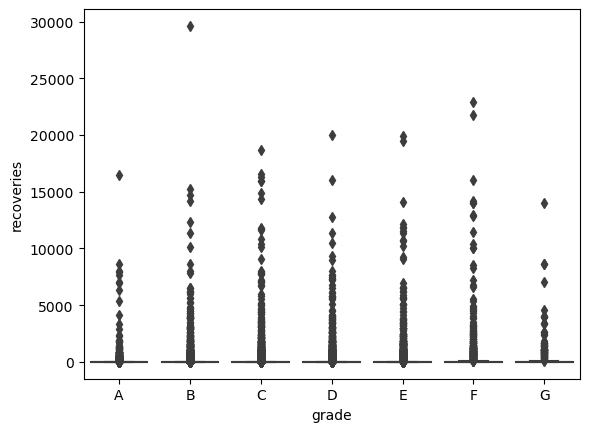

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 1.09
Median: 0.00
q1: 0.00
q3: 0.00


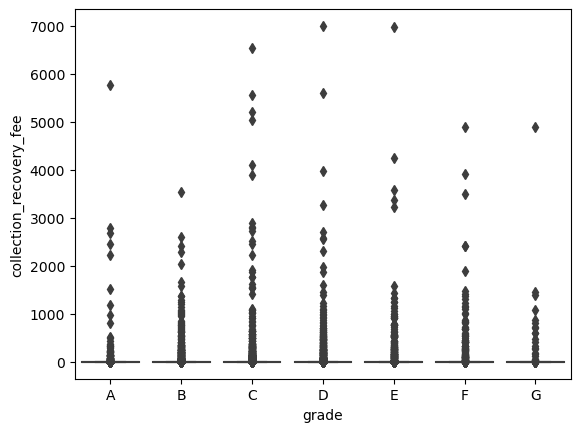

Median: 469.24
q1: 201.20
q3: 2617.99
Median: 576.39
q1: 221.63
q3: 3494.80
Median: 521.27
q1: 200.55
q3: 3258.86
Median: 562.58
q1: 221.57
q3: 3697.97
Median: 845.15
q1: 278.60
q3: 6364.85
Median: 914.20
q1: 351.35
q3: 7610.81
Median: 981.45
q1: 399.68
q3: 10334.90


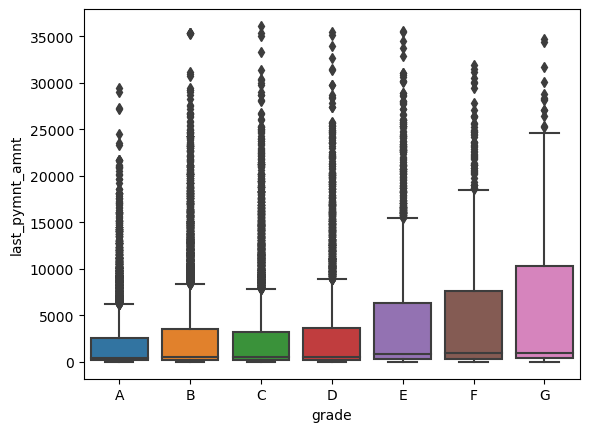

Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 6387.50
q1: 4000.00
q3: 10000.00
Median: 7000.00
q1: 5000.00
q3: 10000.00
Median: 8000.00
q1: 5000.00
q3: 12000.00
Median: 9000.00
q1: 5312.50
q3: 12062.50
Median: 8400.00
q1: 5000.00
q3: 13000.00
Median: 9000.00
q1: 5000.00
q3: 14400.00
Median: 10000.00
q1: 5425.00
q3: 15000.00
Median: 10000.00
q1: 5075.00
q3: 15000.00
Median: 10000.00
q1: 5500.00
q3: 15250.00
Median: 9312.50
q1: 5000.00
q3: 15000.00
Median: 9600.00
q1: 5450.00
q3: 15000.00
Median: 10000.00
q1: 5000.00
q3: 15000.00
Median: 9000.00
q1: 5000.00
q3: 15000.00
Median: 8000.00
q1: 5000.00
q3: 15000.00
Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 9900.00
q1: 6000.00
q3: 15000.00
Median: 11000.00
q1: 7000.00
q3: 16000.00
Median: 12000.00
q1: 7200.00
q3: 18000.00
Median: 13000.00
q1: 7400.00
q3: 19200.00
Median: 13500.00
q1: 7000.00
q3: 20000.00
Median: 14000.00
q1: 7743.75
q3: 20000.00
Median: 14500.00
q1: 8181.25
q3: 20000.00
Median: 15000.00
q1: 9600.00
q3: 24000.00
Media

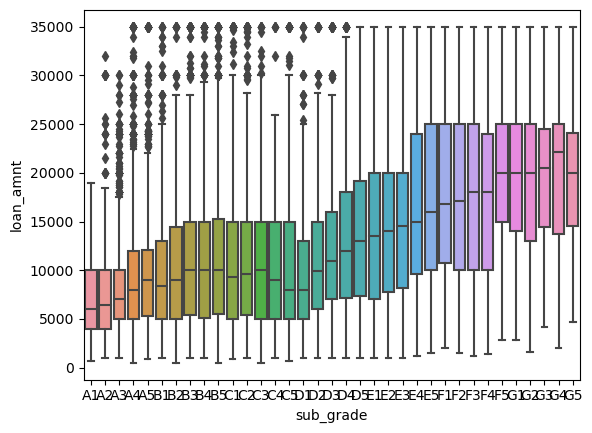

Median: 5.42
q1: 5.42
q3: 6.03
Median: 5.99
q1: 5.79
q3: 6.62
Median: 7.14
q1: 6.92
q3: 7.51
Median: 7.51
q1: 7.49
q3: 7.90
Median: 8.49
q1: 7.88
q3: 8.90
Median: 9.91
q1: 9.88
q3: 10.38
Median: 10.59
q1: 10.25
q3: 10.75
Median: 10.99
q1: 10.37
q3: 11.71
Median: 11.49
q1: 10.74
q3: 12.12
Median: 11.86
q1: 11.11
q3: 12.21
Median: 12.99
q1: 12.68
q3: 13.23
Median: 13.49
q1: 13.06
q3: 13.61
Median: 13.57
q1: 13.43
q3: 13.99
Median: 13.92
q1: 13.47
q3: 14.79
Median: 14.26
q1: 13.79
q3: 15.23
Median: 14.61
q1: 14.54
q3: 15.62
Median: 15.21
q1: 14.91
q3: 15.99
Median: 15.58
q1: 15.28
q3: 16.49
Median: 15.95
q1: 15.65
q3: 16.89
Median: 16.32
q1: 16.02
q3: 17.49
Median: 16.45
q1: 16.40
q3: 17.99
Median: 16.82
q1: 16.77
q3: 18.39
Median: 17.19
q1: 17.14
q3: 18.79
Median: 17.56
q1: 17.51
q3: 19.29
Median: 17.93
q1: 17.88
q3: 19.69
Median: 18.30
q1: 18.25
q3: 20.25
Median: 18.67
q1: 18.62
q3: 20.62
Median: 19.04
q1: 18.99
q3: 20.99
Median: 19.41
q1: 19.36
q3: 21.36
Median: 19.79
q1: 19.74
q3: 21.

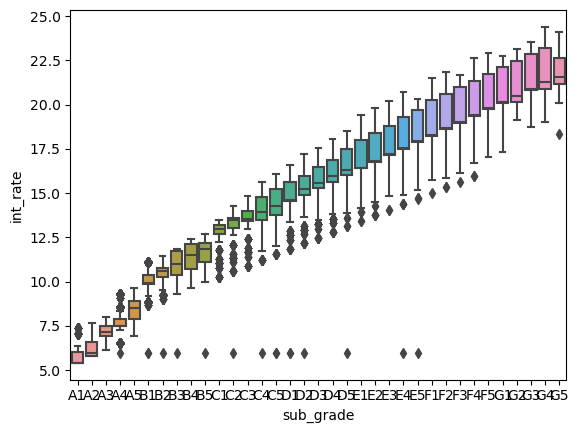

Median: 182.62
q1: 120.64
q3: 304.36
Median: 187.15
q1: 123.07
q3: 297.42
Median: 211.94
q1: 152.50
q3: 308.41
Median: 248.08
q1: 155.55
q3: 342.21
Median: 250.25
q1: 158.77
q3: 375.38
Median: 257.22
q1: 161.22
q3: 389.36
Median: 260.06
q1: 162.26
q3: 421.01
Median: 278.28
q1: 163.67
q3: 436.61
Median: 267.33
q1: 164.86
q3: 408.50
Median: 283.37
q1: 167.34
q3: 420.93
Median: 271.45
q1: 167.84
q3: 407.17
Median: 276.06
q1: 169.01
q3: 440.31
Median: 283.28
q1: 168.86
q3: 413.94
Median: 273.10
q1: 162.60
q3: 443.12
Median: 267.53
q1: 166.80
q3: 414.35
Median: 276.70
q1: 171.15
q3: 443.29
Median: 284.92
q1: 187.75
q3: 426.47
Median: 315.39
q1: 198.33
q3: 464.92
Median: 349.86
q1: 208.24
q3: 508.56
Median: 351.67
q1: 202.36
q3: 510.60
Median: 367.97
q1: 212.28
q3: 542.22
Median: 363.49
q1: 213.24
q3: 544.06
Median: 370.30
q1: 246.87
q3: 566.45
Median: 396.66
q1: 248.85
q3: 610.01
Median: 424.71
q1: 294.58
q3: 639.87
Median: 426.14
q1: 302.31
q3: 638.25
Median: 451.90
q1: 277.83
q3: 643.30
M

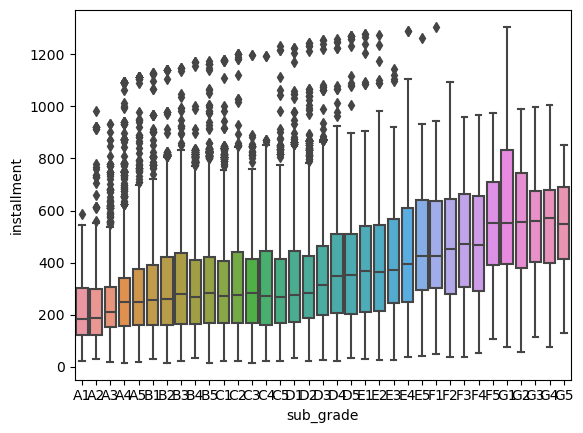

Median: 60000.00
q1: 42000.00
q3: 80000.00
Median: 57000.00
q1: 40029.03
q3: 80000.00
Median: 55000.00
q1: 40000.00
q3: 77000.00
Median: 57006.00
q1: 40000.00
q3: 78200.00
Median: 57900.00
q1: 40000.00
q3: 80000.00
Median: 54600.00
q1: 38214.00
q3: 75000.00
Median: 55000.00
q1: 39872.50
q3: 80000.00
Median: 57797.00
q1: 40000.00
q3: 80000.00
Median: 60000.00
q1: 40000.00
q3: 80004.00
Median: 57000.00
q1: 40000.00
q3: 79000.00
Median: 55000.00
q1: 40000.00
q3: 80000.00
Median: 55438.00
q1: 39993.00
q3: 79100.00
Median: 55000.00
q1: 40000.00
q3: 76422.00
Median: 55000.00
q1: 39307.50
q3: 79112.50
Median: 53960.00
q1: 37725.00
q3: 77326.00
Median: 55000.00
q1: 37956.00
q3: 75150.00
Median: 58900.00
q1: 40046.00
q3: 82400.00
Median: 55200.00
q1: 40000.00
q3: 77875.00
Median: 60000.00
q1: 41900.00
q3: 80000.00
Median: 60000.00
q1: 42000.00
q3: 85000.00
Median: 60000.00
q1: 43000.00
q3: 84000.00
Median: 62000.00
q1: 43698.00
q3: 87000.00
Median: 60000.00
q1: 45000.00
q3: 88200.00
Median: 650

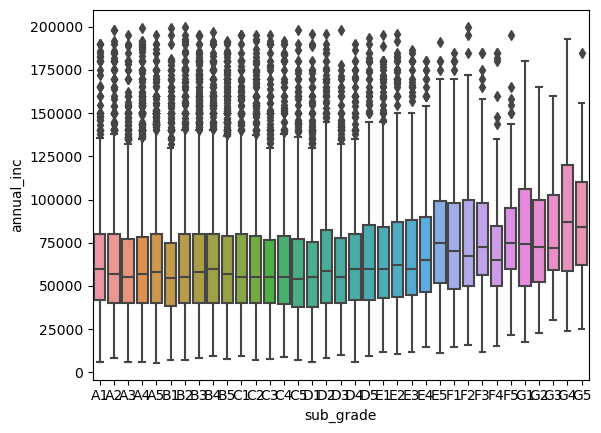

Median: 10.08
q1: 5.34
q3: 15.36
Median: 10.76
q1: 5.79
q3: 16.87
Median: 11.47
q1: 6.37
q3: 17.12
Median: 12.00
q1: 7.00
q3: 17.44
Median: 12.50
q1: 7.52
q3: 17.82
Median: 12.80
q1: 7.80
q3: 18.00
Median: 13.33
q1: 7.96
q3: 18.58
Median: 13.77
q1: 8.66
q3: 18.50
Median: 13.98
q1: 8.79
q3: 18.98
Median: 13.98
q1: 8.88
q3: 19.02
Median: 14.23
q1: 8.95
q3: 18.97
Median: 14.05
q1: 9.03
q3: 18.99
Median: 14.01
q1: 8.75
q3: 18.85
Median: 14.34
q1: 9.82
q3: 19.21
Median: 14.37
q1: 9.19
q3: 19.52
Median: 14.25
q1: 8.84
q3: 19.03
Median: 14.26
q1: 9.60
q3: 19.49
Median: 14.46
q1: 9.32
q3: 19.28
Median: 14.43
q1: 9.18
q3: 19.05
Median: 14.13
q1: 9.26
q3: 18.90
Median: 14.28
q1: 9.44
q3: 19.66
Median: 14.82
q1: 9.78
q3: 19.28
Median: 14.23
q1: 8.68
q3: 19.25
Median: 14.70
q1: 9.54
q3: 19.49
Median: 15.04
q1: 10.09
q3: 19.63
Median: 14.57
q1: 9.31
q3: 18.65
Median: 15.19
q1: 9.24
q3: 18.87
Median: 15.14
q1: 10.64
q3: 19.15
Median: 14.87
q1: 10.19
q3: 19.79
Median: 14.71
q1: 10.80
q3: 19.92
Median

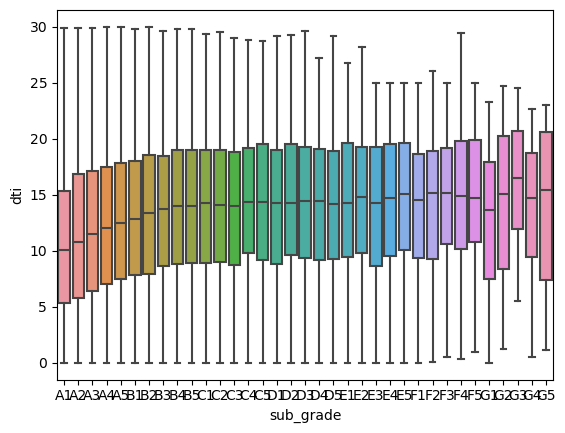

Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 8.00
q1: 5.00
q3: 12.00
Median: 8.50
q1: 6.00
q3: 12.00
Median: 9.00
q1: 5.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 13.00
Median: 9.00
q1: 6.00
q3: 13.00
Median: 9.00
q1: 6.00
q3: 13.00
Median: 9.00
q1: 5.50
q3: 12.00
Median: 9.00
q1: 5.00
q3: 12.00
Median: 9.00
q1: 5.25
q3: 13.75
Median: 9.00
q1: 5.00
q3: 13.00
Median: 

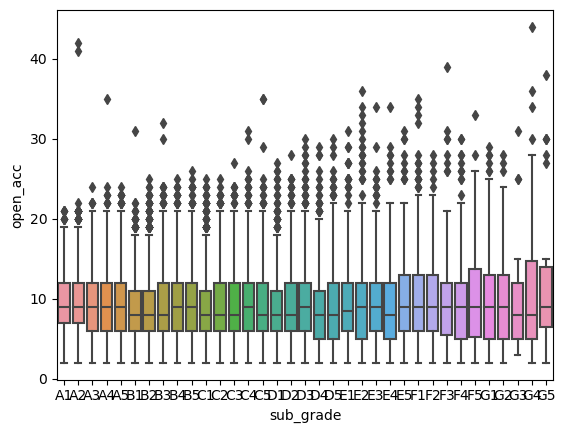

Median: 5135.00
q1: 2344.50
q3: 11390.00
Median: 5273.50
q1: 1988.75
q3: 11302.50
Median: 6288.00
q1: 2357.00
q3: 12818.00
Median: 7349.00
q1: 2979.00
q3: 14664.00
Median: 8285.00
q1: 3365.00
q3: 15733.50
Median: 8552.00
q1: 3427.50
q3: 14908.50
Median: 8316.00
q1: 3541.00
q3: 16000.50
Median: 8847.00
q1: 3678.00
q3: 16475.50
Median: 9456.00
q1: 4130.50
q3: 17410.50
Median: 9479.50
q1: 4219.25
q3: 17922.75
Median: 9283.50
q1: 4178.75
q3: 17129.50
Median: 9192.00
q1: 3968.00
q3: 17350.50
Median: 8973.00
q1: 3803.00
q3: 16738.00
Median: 9244.00
q1: 3918.25
q3: 17235.25
Median: 8402.50
q1: 3531.50
q3: 17271.25
Median: 8098.00
q1: 3810.25
q3: 16358.25
Median: 9176.00
q1: 4284.00
q3: 17657.00
Median: 9253.00
q1: 4606.00
q3: 17813.75
Median: 9538.50
q1: 4224.75
q3: 17756.75
Median: 10296.00
q1: 4745.00
q3: 18554.00
Median: 10549.00
q1: 4977.75
q3: 18784.25
Median: 10953.00
q1: 4852.25
q3: 20172.50
Median: 11106.00
q1: 5819.00
q3: 21718.75
Median: 11907.00
q1: 5243.00
q3: 21860.50
Median: 138

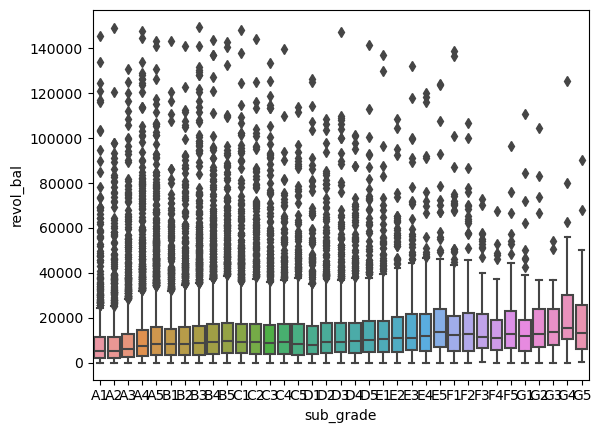

Median: 15.60
q1: 7.70
q3: 27.30
Median: 17.20
q1: 7.60
q3: 33.10
Median: 22.80
q1: 9.40
q3: 40.10
Median: 31.20
q1: 14.70
q3: 49.90
Median: 34.70
q1: 17.40
q3: 54.10
Median: 40.60
q1: 22.00
q3: 61.10
Median: 43.10
q1: 23.75
q3: 62.50
Median: 47.55
q1: 26.60
q3: 67.67
Median: 48.10
q1: 27.20
q3: 68.47
Median: 53.40
q1: 32.30
q3: 72.00
Median: 57.30
q1: 37.30
q3: 77.07
Median: 59.60
q1: 39.05
q3: 78.75
Median: 56.70
q1: 34.50
q3: 76.90
Median: 61.50
q1: 40.80
q3: 78.80
Median: 64.00
q1: 42.00
q3: 80.50
Median: 69.00
q1: 47.38
q3: 85.50
Median: 67.85
q1: 45.00
q3: 84.30
Median: 65.60
q1: 47.15
q3: 82.50
Median: 69.20
q1: 46.32
q3: 85.35
Median: 67.10
q1: 44.85
q3: 86.00
Median: 70.20
q1: 51.18
q3: 86.93
Median: 73.40
q1: 49.50
q3: 89.10
Median: 75.20
q1: 53.70
q3: 90.30
Median: 73.50
q1: 52.30
q3: 89.50
Median: 75.60
q1: 54.55
q3: 89.60
Median: 73.05
q1: 52.80
q3: 88.78
Median: 78.55
q1: 55.48
q3: 92.62
Median: 79.20
q1: 52.15
q3: 93.85
Median: 76.90
q1: 53.85
q3: 94.25
Median: 81.05
q1:

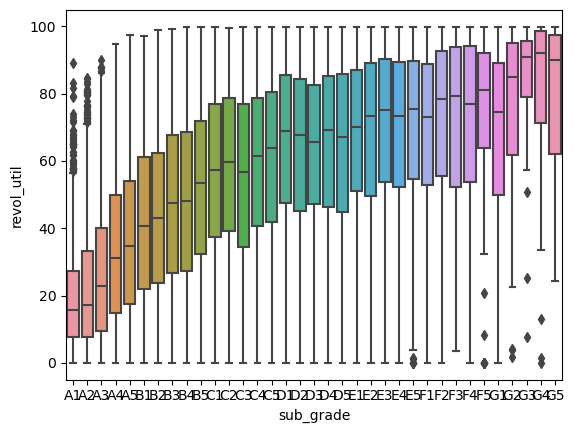

Median: 24.00
q1: 18.00
q3: 31.00
Median: 23.00
q1: 16.25
q3: 31.00
Median: 22.00
q1: 15.00
q3: 29.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 20.00
q1: 14.00
q3: 28.00
Median: 19.00
q1: 13.00
q3: 28.00
Median: 20.00
q1: 13.00
q3: 28.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 20.00
q1: 13.00
q3: 28.00
Median: 19.00
q1: 13.00
q3: 27.00
Median: 20.00
q1: 12.00
q3: 28.00
Median: 19.00
q1: 13.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 28.00
Median: 18.00
q1: 12.00
q3: 27.00
Median: 17.00
q1: 11.00
q3: 26.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 18.00
q1: 12.00
q3: 27.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 20.00
q1: 12.00
q3: 29.00
Median: 19.00
q1: 12.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 29.00
Median: 20.00
q1: 12.00
q3: 29.00
Median: 21.00
q1: 13.00
q3: 30.00
Median: 22.00
q1: 14.00
q3: 32.00
Median: 20.00
q1: 13.00
q3: 30.00
Median: 21.00
q1: 12.00
q3: 31.00
Median: 22.00
q1: 14.00
q3: 31.00
Median: 21.50
q1: 12.00
q3: 33.00
Median: 20.00


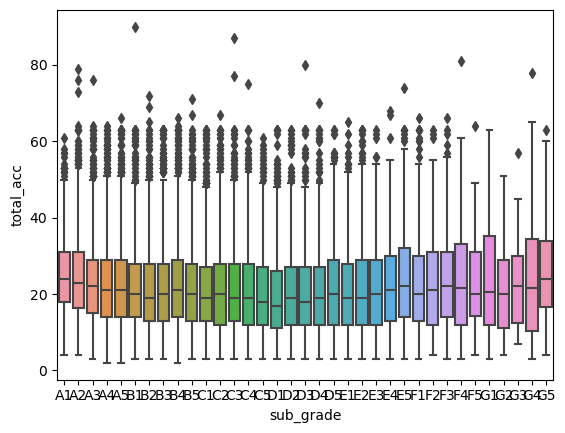

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 

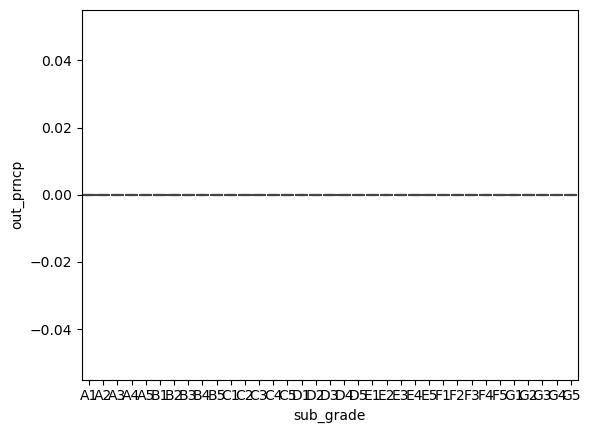

Median: 6515.13
q1: 4287.22
q3: 10857.53
Median: 6631.96
q1: 4350.65
q3: 10331.86
Median: 7305.36
q1: 5235.65
q3: 10655.02
Median: 8479.67
q1: 5472.57
q3: 12210.11
Median: 8979.76
q1: 5630.89
q3: 13470.67
Median: 9242.95
q1: 5664.47
q3: 14017.64
Median: 9325.03
q1: 5508.12
q3: 15148.92
Median: 10241.25
q1: 5590.14
q3: 16747.76
Median: 10190.46
q1: 5633.45
q3: 16492.41
Median: 10143.94
q1: 5713.69
q3: 17461.80
Median: 9559.21
q1: 5421.50
q3: 16378.16
Median: 9803.18
q1: 5436.91
q3: 16926.49
Median: 9841.30
q1: 5078.08
q3: 16286.16
Median: 9073.25
q1: 4886.17
q3: 16281.57
Median: 8838.39
q1: 4879.26
q3: 15191.54
Median: 8639.33
q1: 4861.36
q3: 14529.85
Median: 10168.13
q1: 5726.27
q3: 17256.90
Median: 11921.36
q1: 6440.07
q3: 17874.85
Median: 12618.19
q1: 6039.96
q3: 19631.65
Median: 12814.88
q1: 6611.81
q3: 21518.58
Median: 13593.61
q1: 7048.42
q3: 21382.66
Median: 14459.96
q1: 7116.34
q3: 23048.75
Median: 14654.63
q1: 7484.29
q3: 23574.69
Median: 15839.70
q1: 7104.26
q3: 24740.98
Media

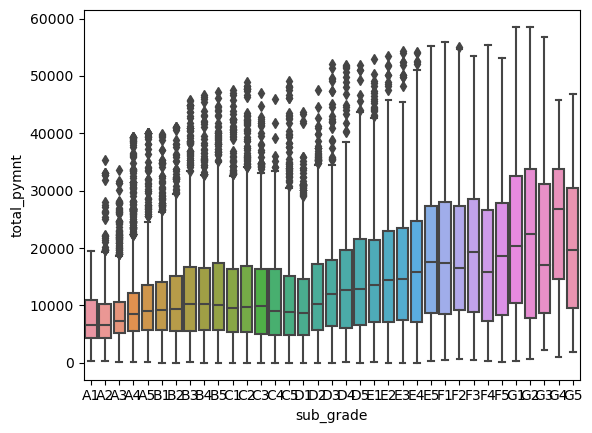

Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 6000.00
q1: 4000.00
q3: 9600.00
Median: 6600.00
q1: 4800.00
q3: 10000.00
Median: 7750.00
q1: 5000.00
q3: 11000.00
Median: 8000.00
q1: 5000.00
q3: 12000.00
Median: 8000.00
q1: 5000.00
q3: 12000.00
Median: 8000.00
q1: 4750.00
q3: 13000.00
Median: 8500.00
q1: 4800.00
q3: 14400.00
Median: 8400.00
q1: 4750.00
q3: 13925.64
Median: 8400.00
q1: 4800.00
q3: 14781.25
Median: 7999.99
q1: 4191.18
q3: 13500.00
Median: 8000.00
q1: 4000.00
q3: 14000.00
Median: 8000.00
q1: 4000.00
q3: 12430.09
Median: 7200.00
q1: 3836.52
q3: 13000.00
Median: 7000.00
q1: 3600.00
q3: 12000.00
Median: 7000.00
q1: 4000.00
q3: 12000.00
Median: 8000.00
q1: 4100.00
q3: 14000.00
Median: 9000.00
q1: 4750.00
q3: 14000.00
Median: 10000.00
q1: 4000.00
q3: 15000.00
Median: 9874.77
q1: 4500.00
q3: 15600.00
Median: 10000.00
q1: 4622.16
q3: 16000.00
Median: 10000.00
q1: 4472.60
q3: 17000.00
Median: 10000.00
q1: 5000.00
q3: 18000.00
Median: 11224.66
q1: 4236.88
q3: 18237.50
Median: 1200

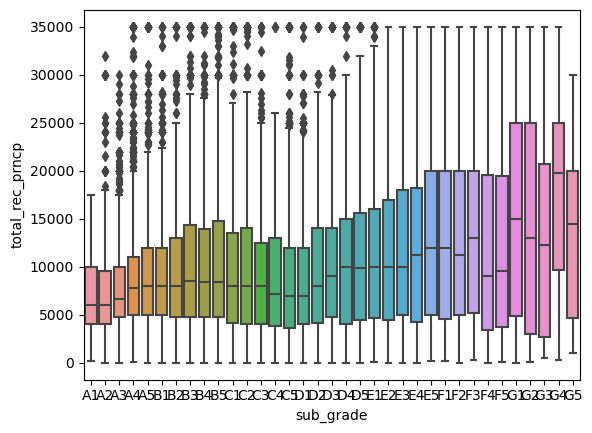

Median: 471.64
q1: 275.11
q3: 777.82
Median: 531.36
q1: 292.31
q3: 816.20
Median: 637.66
q1: 390.46
q3: 967.91
Median: 779.20
q1: 455.34
q3: 1207.52
Median: 895.57
q1: 511.46
q3: 1437.69
Median: 1110.93
q1: 611.16
q3: 1848.57
Median: 1177.02
q1: 642.99
q3: 2074.88
Median: 1377.47
q1: 697.86
q3: 2471.78
Median: 1432.30
q1: 736.35
q3: 2633.57
Median: 1527.72
q1: 782.16
q3: 2788.11
Median: 1502.47
q1: 833.90
q3: 2931.33
Median: 1682.07
q1: 850.66
q3: 3069.52
Median: 1676.34
q1: 812.74
q3: 2965.90
Median: 1516.22
q1: 765.92
q3: 2892.30
Median: 1587.01
q1: 783.00
q3: 2930.64
Median: 1473.62
q1: 845.75
q3: 2597.04
Median: 2011.08
q1: 1115.95
q3: 3698.63
Median: 2469.36
q1: 1240.47
q3: 4199.05
Median: 2630.61
q1: 1284.56
q3: 4754.36
Median: 2883.63
q1: 1423.81
q3: 5314.53
Median: 2958.46
q1: 1557.25
q3: 5313.46
Median: 3485.49
q1: 1497.35
q3: 6204.91
Median: 3864.99
q1: 1995.73
q3: 6298.55
Median: 4014.19
q1: 1985.02
q3: 6741.88
Median: 4725.20
q1: 2292.36
q3: 7805.16
Median: 4997.97
q1: 2319

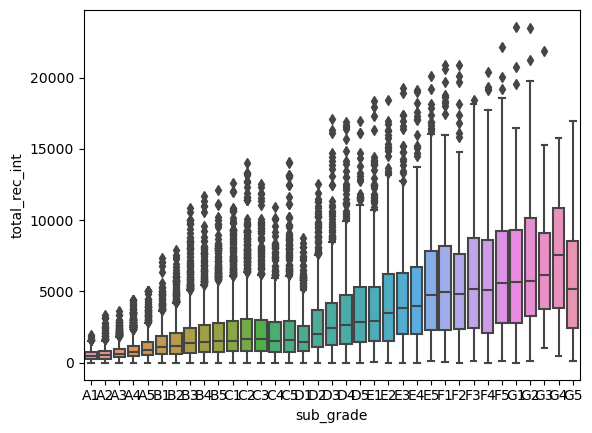

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 

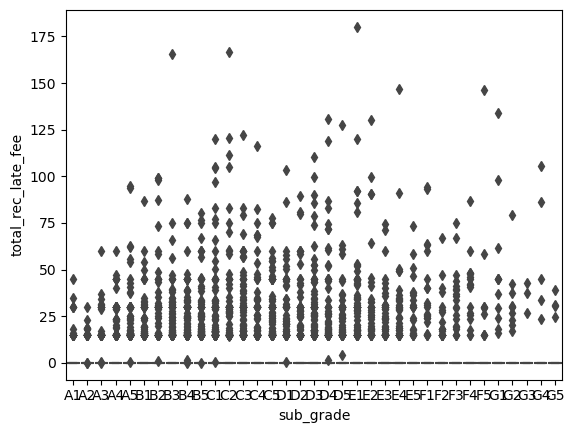

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 13.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 290.11
Median: 0.00
q1: 0.00
q3: 719.82
Median: 0.00
q1: 0.00
q3: 43.82
Median: 0.00
q1: 0.00
q3: 378.87


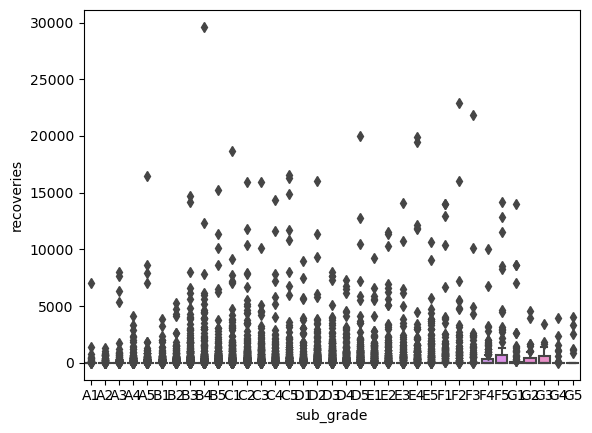

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 3.95
Median: 0.00
q1: 0.00
q3: 9.04
Median: 0.00
q1: 0.00
q3: 0.44
Median: 0.00
q1: 0.00
q3: 3.54
Median: 

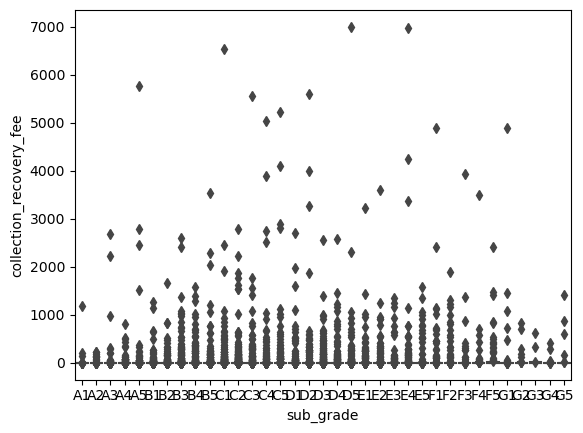

Median: 428.34
q1: 178.76
q3: 2472.18
Median: 402.94
q1: 184.77
q3: 2377.25
Median: 422.18
q1: 194.52
q3: 2380.15
Median: 477.19
q1: 208.61
q3: 2707.30
Median: 505.64
q1: 222.76
q3: 2961.94
Median: 521.21
q1: 220.12
q3: 3115.89
Median: 567.78
q1: 214.57
q3: 3389.86
Median: 601.74
q1: 233.08
q3: 3621.78
Median: 595.98
q1: 216.12
q3: 3735.12
Median: 564.48
q1: 225.13
q3: 3643.36
Median: 517.46
q1: 201.21
q3: 3324.31
Median: 575.12
q1: 218.80
q3: 3812.73
Median: 520.38
q1: 200.00
q3: 3121.68
Median: 516.22
q1: 187.75
q3: 2892.29
Median: 452.95
q1: 184.35
q3: 2733.98
Median: 390.01
q1: 186.80
q3: 1819.88
Median: 552.50
q1: 223.46
q3: 3591.93
Median: 682.77
q1: 266.54
q3: 3965.16
Median: 678.38
q1: 238.78
q3: 4612.07
Median: 611.31
q1: 228.69
q3: 5021.54
Median: 739.17
q1: 244.22
q3: 5200.44
Median: 798.35
q1: 259.52
q3: 6650.78
Median: 882.03
q1: 297.92
q3: 6262.36
Median: 746.18
q1: 272.83
q3: 7249.54
Median: 1016.32
q1: 350.12
q3: 8199.40
Median: 1203.64
q1: 357.42
q3: 7423.70
Median: 11

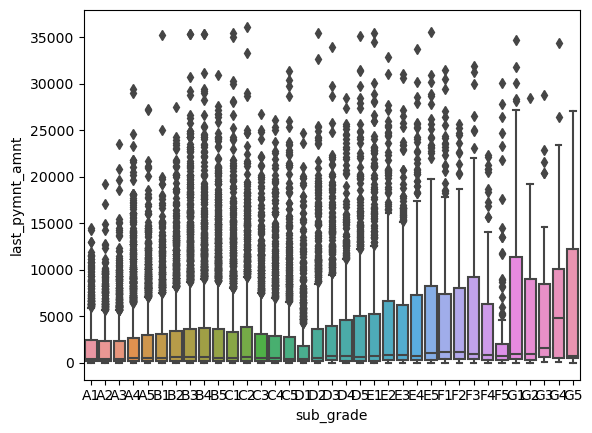

Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 9000.00
q1: 5000.00
q3: 14000.00
Median: 9600.00
q1: 5218.75
q3: 15000.00
Median: 9975.00
q1: 5600.00
q3: 15000.00
Median: 10000.00
q1: 5850.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 15950.00
Median: 10000.00
q1: 6000.00
q3: 16000.00


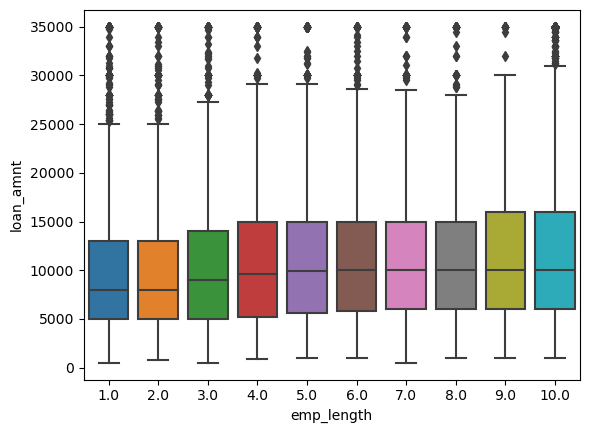

Median: 11.83
q1: 9.32
q3: 14.26
Median: 11.86
q1: 9.63
q3: 14.27
Median: 11.71
q1: 9.25
q3: 14.27
Median: 11.86
q1: 9.30
q3: 14.65
Median: 11.71
q1: 8.90
q3: 14.59
Median: 11.71
q1: 8.90
q3: 14.59
Median: 11.86
q1: 9.29
q3: 14.65
Median: 11.71
q1: 8.69
q3: 14.26
Median: 11.58
q1: 8.88
q3: 14.46
Median: 11.49
q1: 8.49
q3: 14.42


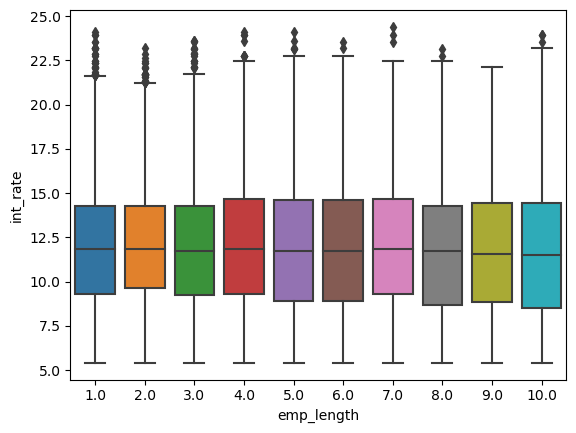

Median: 243.34
q1: 150.85
q3: 383.64
Median: 251.55
q1: 158.77
q3: 387.52
Median: 270.41
q1: 163.96
q3: 398.47
Median: 277.51
q1: 168.25
q3: 411.25
Median: 276.76
q1: 168.76
q3: 418.07
Median: 282.25
q1: 170.84
q3: 427.18
Median: 297.58
q1: 180.96
q3: 445.06
Median: 284.39
q1: 174.78
q3: 438.72
Median: 312.82
q1: 190.19
q3: 461.12
Median: 304.36
q1: 174.64
q3: 472.39


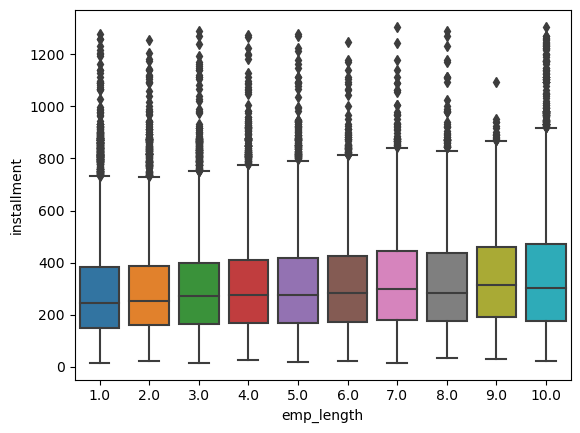

Median: 50000.00
q1: 35000.00
q3: 75000.00
Median: 51492.00
q1: 36500.00
q3: 73450.00
Median: 55000.00
q1: 39996.00
q3: 76240.79
Median: 57000.00
q1: 40000.00
q3: 80000.00
Median: 57000.00
q1: 40800.00
q3: 80000.00
Median: 60000.00
q1: 41000.00
q3: 80000.00
Median: 60000.00
q1: 44000.00
q3: 80000.00
Median: 60000.00
q1: 45000.00
q3: 85000.00
Median: 63208.00
q1: 47000.00
q3: 86500.00
Median: 65000.00
q1: 48000.00
q3: 90000.00


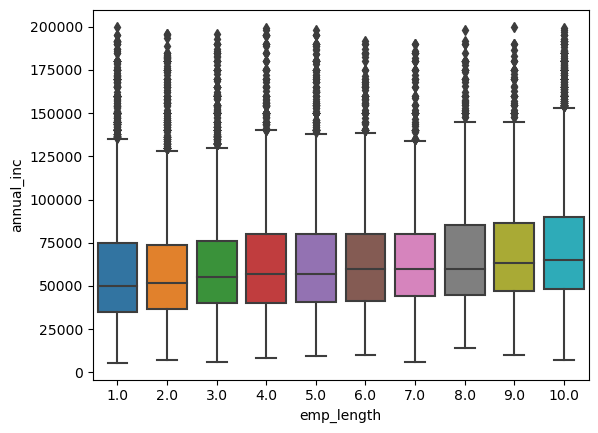

Median: 12.80
q1: 7.51
q3: 18.09
Median: 13.32
q1: 7.94
q3: 18.31
Median: 13.30
q1: 8.08
q3: 18.41
Median: 13.30
q1: 8.08
q3: 18.51
Median: 13.58
q1: 8.25
q3: 18.84
Median: 14.00
q1: 8.90
q3: 19.13
Median: 13.90
q1: 8.81
q3: 18.88
Median: 13.89
q1: 9.07
q3: 19.33
Median: 13.75
q1: 8.72
q3: 18.54
Median: 13.82
q1: 8.59
q3: 18.98


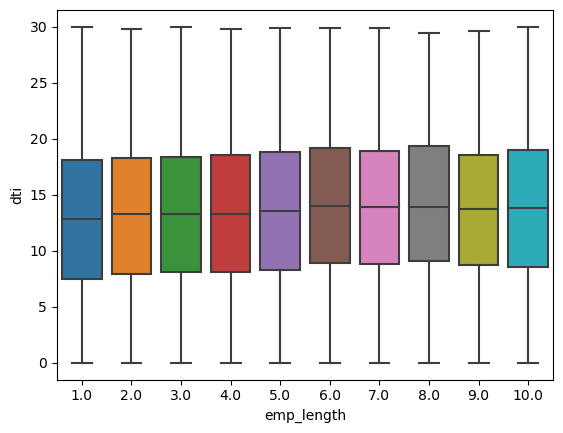

Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00


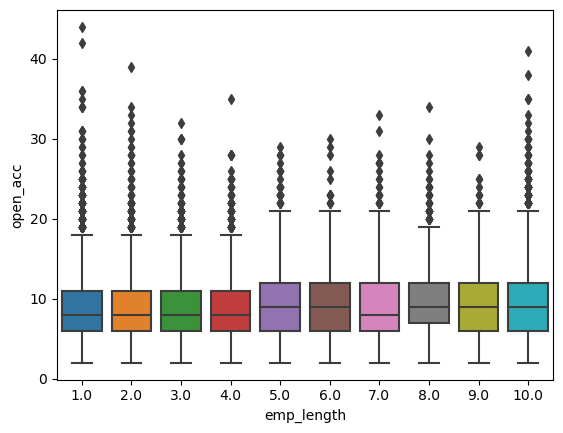

Median: 7105.00
q1: 2911.50
q3: 14149.25
Median: 7319.00
q1: 3053.00
q3: 14024.00
Median: 7601.50
q1: 3150.75
q3: 14703.75
Median: 8227.00
q1: 3429.00
q3: 15232.75
Median: 8485.00
q1: 3519.00
q3: 15176.50
Median: 8805.00
q1: 3871.00
q3: 16320.00
Median: 9348.00
q1: 4039.00
q3: 17449.50
Median: 10100.00
q1: 4705.50
q3: 17625.50
Median: 10592.00
q1: 4710.50
q3: 19577.00
Median: 11325.00
q1: 4767.50
q3: 21229.50


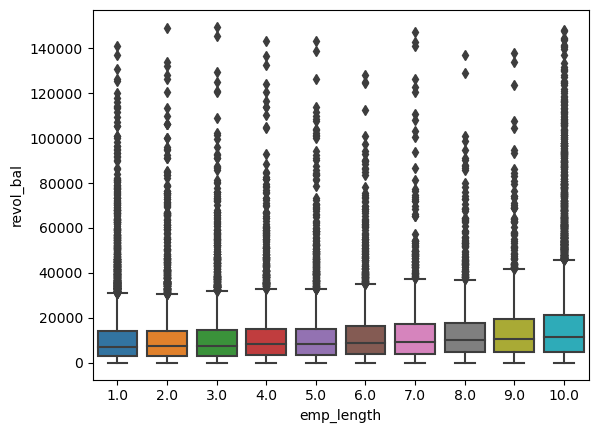

Median: 49.00
q1: 24.50
q3: 72.60
Median: 48.80
q1: 25.60
q3: 71.30
Median: 47.70
q1: 24.90
q3: 72.10
Median: 49.60
q1: 26.60
q3: 72.50
Median: 48.60
q1: 25.20
q3: 72.10
Median: 51.00
q1: 26.20
q3: 72.10
Median: 50.20
q1: 27.38
q3: 72.00
Median: 47.70
q1: 25.30
q3: 71.35
Median: 49.00
q1: 26.05
q3: 72.05
Median: 49.30
q1: 24.45
q3: 72.40


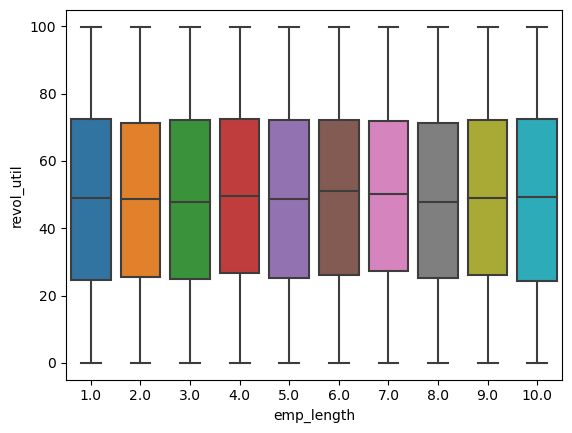

Median: 18.00
q1: 11.00
q3: 26.00
Median: 18.00
q1: 11.00
q3: 26.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 19.00
q1: 13.00
q3: 27.00
Median: 20.00
q1: 13.00
q3: 27.00
Median: 20.00
q1: 14.00
q3: 28.00
Median: 21.00
q1: 14.00
q3: 28.00
Median: 22.00
q1: 16.00
q3: 31.00
Median: 22.00
q1: 16.00
q3: 31.00
Median: 24.00
q1: 17.00
q3: 32.00


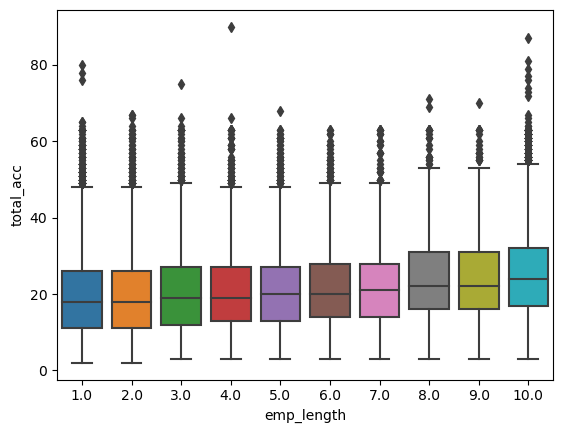

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


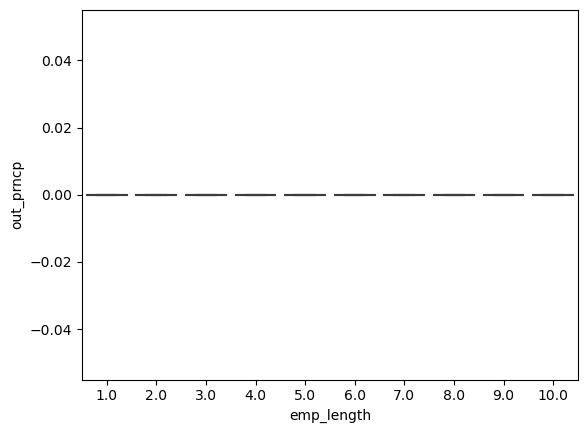

Median: 8257.73
q1: 4733.66
q3: 13923.85
Median: 8828.25
q1: 5230.05
q3: 14277.15
Median: 9477.77
q1: 5526.41
q3: 14884.17
Median: 9724.80
q1: 5546.73
q3: 15597.34
Median: 9761.04
q1: 5616.11
q3: 16185.26
Median: 10057.64
q1: 5667.76
q3: 16430.07
Median: 10290.86
q1: 5802.33
q3: 16849.08
Median: 10155.70
q1: 5886.36
q3: 16420.96
Median: 11261.47
q1: 6091.90
q3: 17372.05
Median: 10626.86
q1: 5764.72
q3: 17712.83


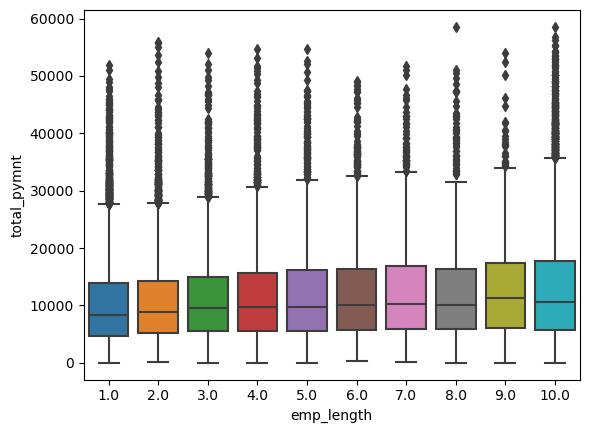

Median: 7000.00
q1: 4000.00
q3: 12000.00
Median: 7200.00
q1: 4200.00
q3: 12000.00
Median: 8000.00
q1: 4561.57
q3: 12000.00
Median: 8000.00
q1: 4500.00
q3: 12806.25
Median: 8000.00
q1: 4800.00
q3: 13112.50
Median: 8000.00
q1: 4800.00
q3: 13250.00
Median: 8400.00
q1: 4800.00
q3: 14000.00
Median: 8387.50
q1: 5000.00
q3: 13725.00
Median: 9875.00
q1: 5000.00
q3: 15000.00
Median: 8767.32
q1: 4800.00
q3: 15000.00


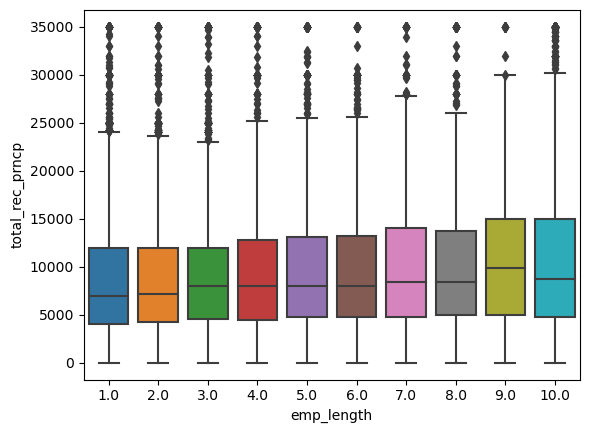

Median: 1106.03
q1: 563.21
q3: 2189.42
Median: 1209.88
q1: 608.16
q3: 2337.10
Median: 1261.24
q1: 655.88
q3: 2512.91
Median: 1286.62
q1: 659.47
q3: 2476.54
Median: 1333.29
q1: 668.34
q3: 2690.41
Median: 1360.42
q1: 687.01
q3: 2884.85
Median: 1492.02
q1: 720.83
q3: 2888.36
Median: 1359.29
q1: 681.18
q3: 2644.28
Median: 1443.74
q1: 695.34
q3: 3012.91
Median: 1409.70
q1: 663.91
q3: 3109.62


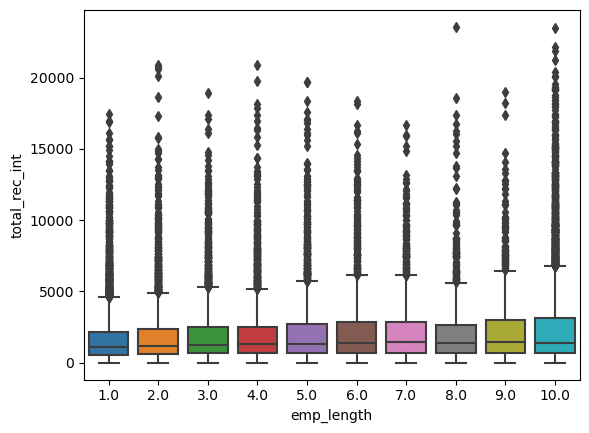

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


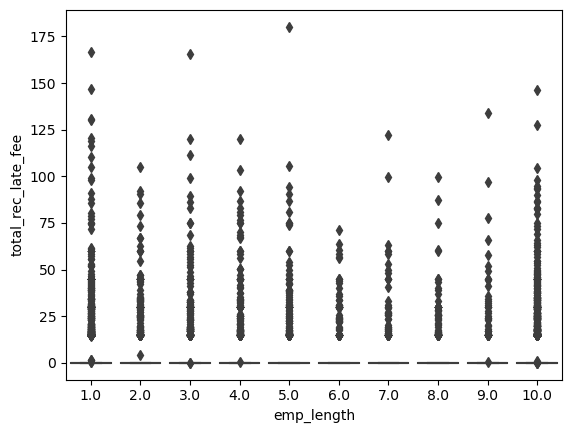

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


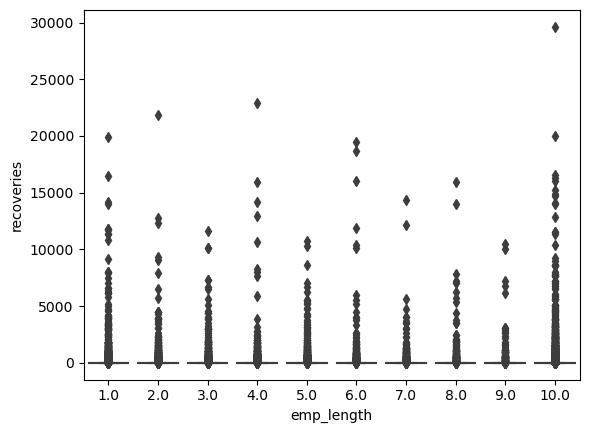

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


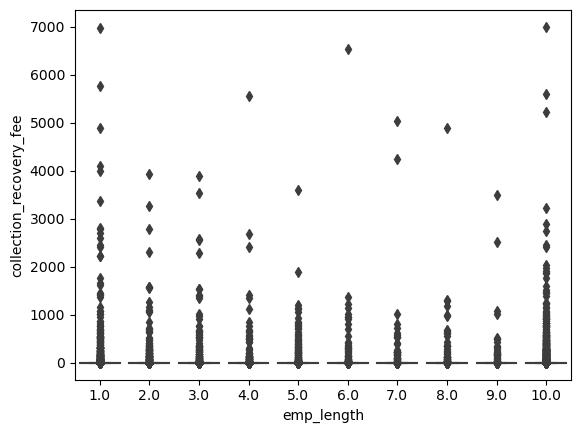

Median: 484.13
q1: 189.53
q3: 2614.41
Median: 538.20
q1: 213.19
q3: 2950.58
Median: 568.05
q1: 216.55
q3: 3341.02
Median: 583.74
q1: 223.36
q3: 3496.89
Median: 578.35
q1: 231.29
q3: 3592.10
Median: 561.56
q1: 219.90
q3: 3794.33
Median: 568.09
q1: 241.98
q3: 3529.23
Median: 580.58
q1: 220.84
q3: 3726.68
Median: 639.21
q1: 246.18
q3: 4269.93
Median: 599.85
q1: 224.73
q3: 4017.52


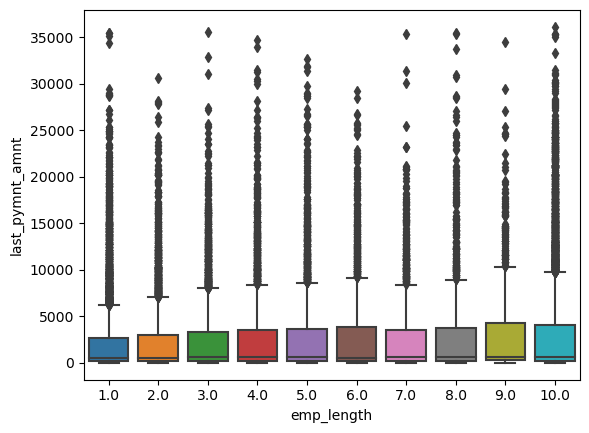

Median: 10000.00
q1: 6000.00
q3: 16000.00
Median: 4000.00
q1: 3400.00
q3: 7000.00
Median: 9800.00
q1: 6000.00
q3: 15000.00
Median: 8000.00
q1: 5000.00
q3: 14000.00
Median: 8000.00
q1: 5000.00
q3: 13000.00


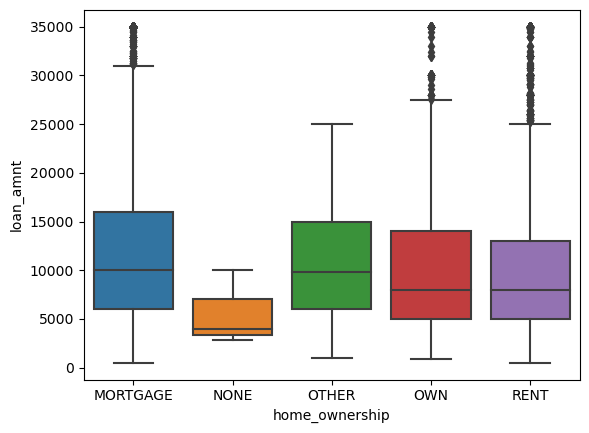

Median: 11.48
q1: 7.90
q3: 14.17
Median: 8.70
q1: 8.22
q3: 9.17
Median: 11.83
q1: 9.63
q3: 14.26
Median: 11.49
q1: 8.49
q3: 14.09
Median: 12.09
q1: 9.91
q3: 14.61


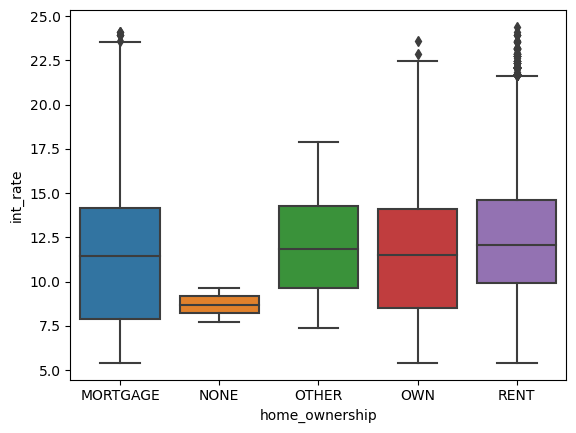

Median: 307.66
q1: 185.05
q3: 469.21
Median: 128.41
q1: 108.53
q3: 220.31
Median: 284.79
q1: 165.67
q3: 484.30
Median: 247.61
q1: 154.33
q3: 392.82
Median: 254.44
q1: 155.72
q3: 388.78


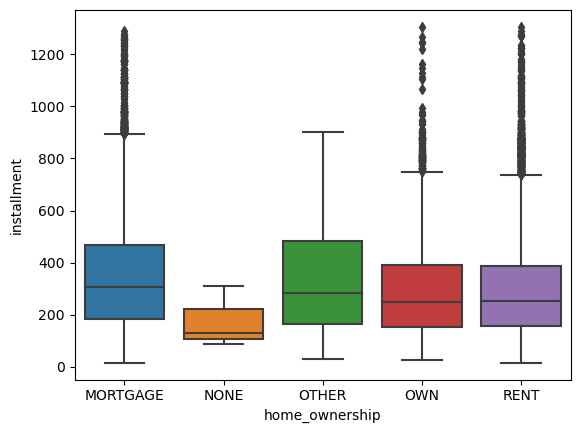

Median: 70000.00
q1: 50400.00
q3: 95000.00
Median: 100000.00
q1: 61100.00
q3: 110000.00
Median: 59300.00
q1: 39999.00
q3: 80053.00
Median: 48000.00
q1: 32545.00
q3: 69996.00
Median: 50000.00
q1: 35496.00
q3: 68500.00


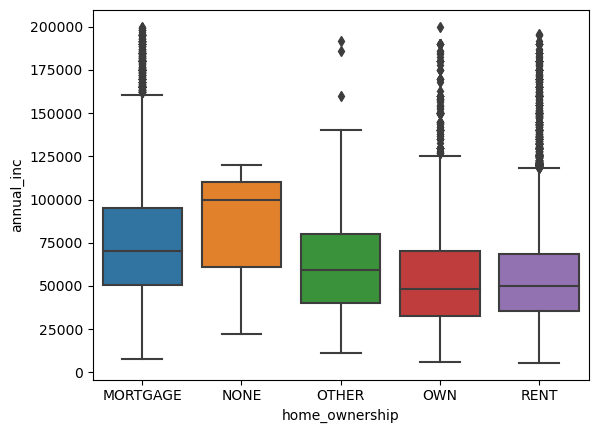

Median: 13.27
q1: 8.28
q3: 18.30
Median: 15.00
q1: 10.12
q3: 15.00
Median: 10.99
q1: 6.78
q3: 15.36
Median: 13.44
q1: 7.80
q3: 18.84
Median: 13.68
q1: 8.30
q3: 18.87


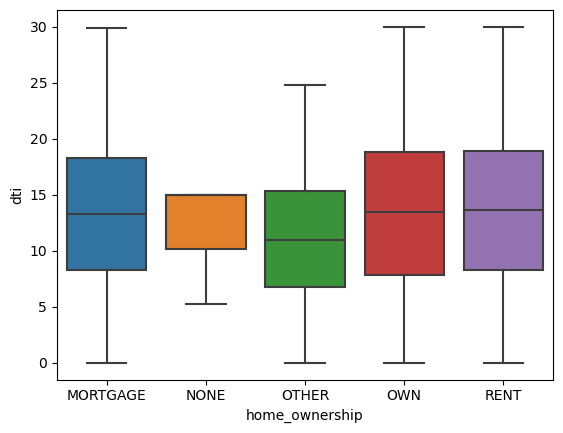

Median: 10.00
q1: 7.00
q3: 13.00
Median: 6.00
q1: 6.00
q3: 7.50
Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 11.00


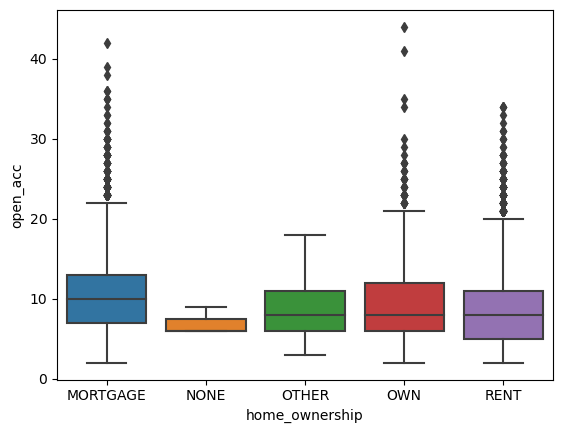

Median: 11037.50
q1: 4679.25
q3: 21160.00
Median: 8155.00
q1: 6461.00
q3: 8155.00
Median: 10027.00
q1: 3694.25
q3: 15265.25
Median: 7151.50
q1: 2582.75
q3: 14274.25
Median: 7251.00
q1: 3099.00
q3: 13599.00


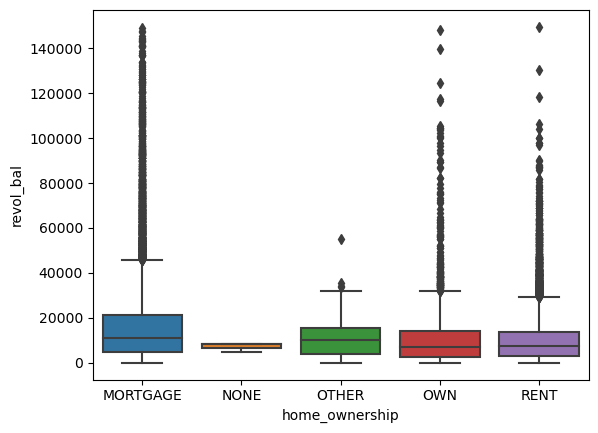

Median: 46.20
q1: 22.90
q3: 69.43
Median: 14.90
q1: 11.80
q3: 14.90
Median: 38.65
q1: 18.02
q3: 64.88
Median: 42.60
q1: 17.90
q3: 66.80
Median: 53.10
q1: 28.90
q3: 75.20


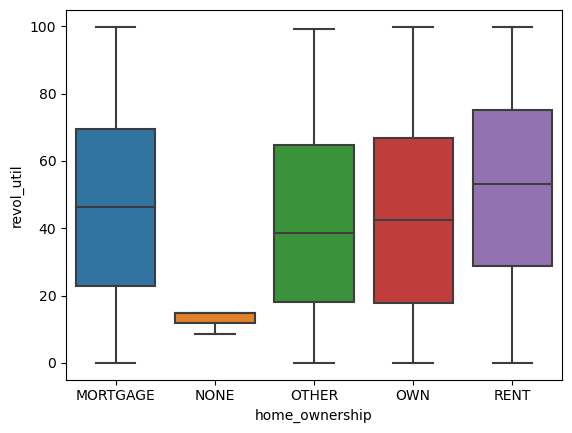

Median: 25.00
q1: 18.00
q3: 33.00
Median: 8.00
q1: 8.00
q3: 15.00
Median: 19.00
q1: 14.00
q3: 27.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 17.00
q1: 11.00
q3: 24.00


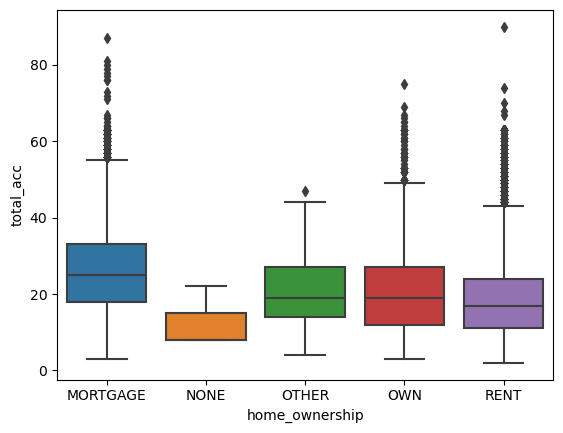

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


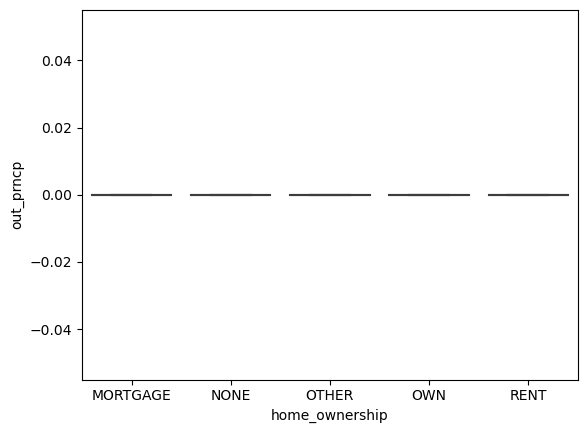

Median: 10914.11
q1: 6107.75
q3: 17756.00
Median: 4622.49
q1: 3906.85
q3: 7931.06
Median: 8976.09
q1: 5474.64
q3: 14517.89
Median: 8529.00
q1: 4957.26
q3: 14450.79
Median: 8657.78
q1: 4929.93
q3: 14168.79


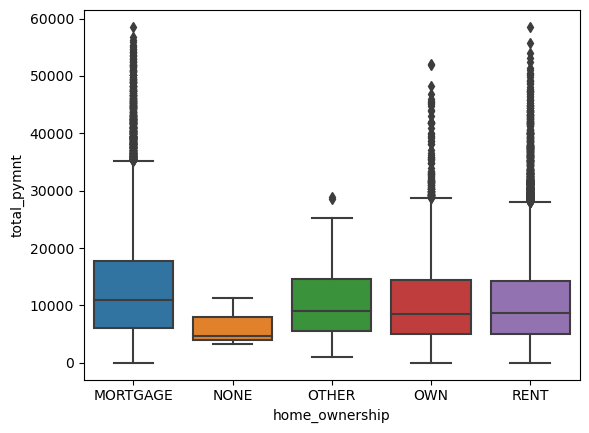

Median: 9250.00
q1: 5000.00
q3: 15000.00
Median: 4000.00
q1: 3400.00
q3: 6999.99
Median: 7349.99
q1: 4755.23
q3: 12000.00
Median: 7000.00
q1: 4000.00
q3: 12000.00
Median: 7125.00
q1: 4000.00
q3: 12000.00


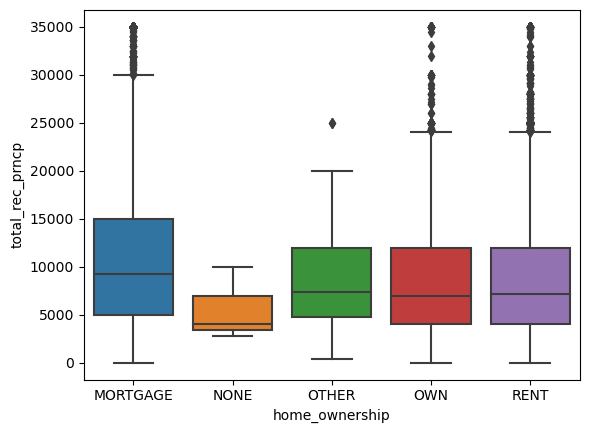

Median: 1427.26
q1: 694.82
q3: 3063.96
Median: 622.49
q1: 506.86
q3: 931.06
Median: 1398.80
q1: 765.56
q3: 2307.99
Median: 1097.52
q1: 521.05
q3: 2213.15
Median: 1214.99
q1: 609.63
q3: 2361.91


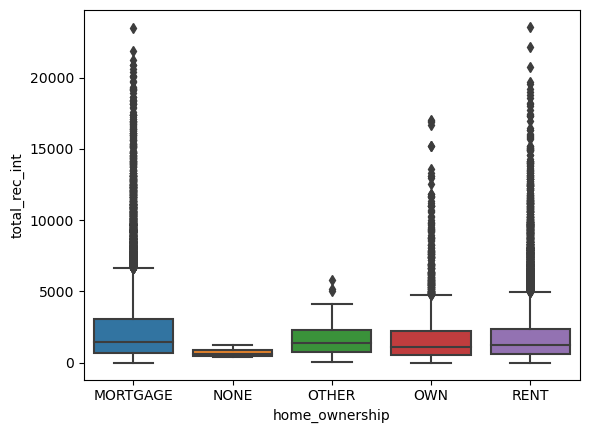

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


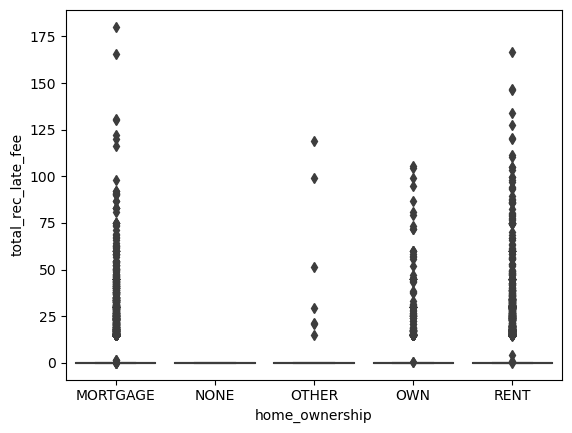

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


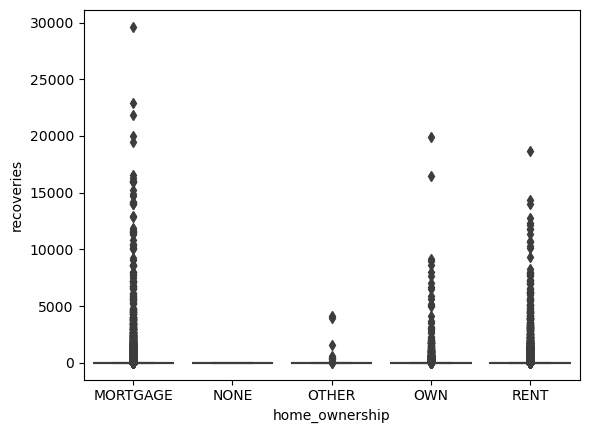

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


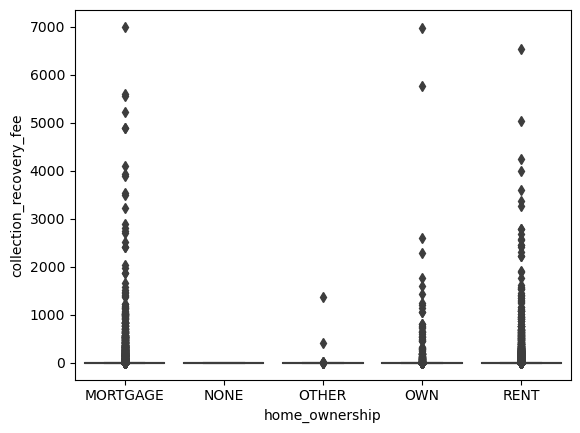

Median: 711.17
q1: 246.42
q3: 4320.59
Median: 129.76
q1: 109.78
q3: 221.67
Median: 357.62
q1: 188.46
q3: 1233.06
Median: 504.64
q1: 200.44
q3: 3239.16
Median: 479.92
q1: 197.36
q3: 2690.07


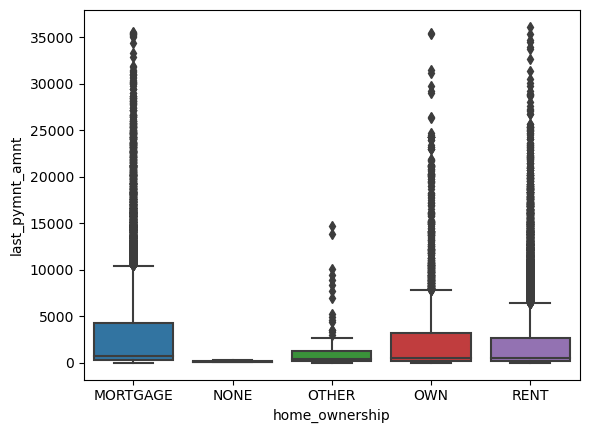

Median: 7500.00
q1: 4800.00
q3: 11200.00
Median: 8500.00
q1: 5000.00
q3: 13000.00
Median: 15000.00
q1: 8400.00
q3: 21000.00


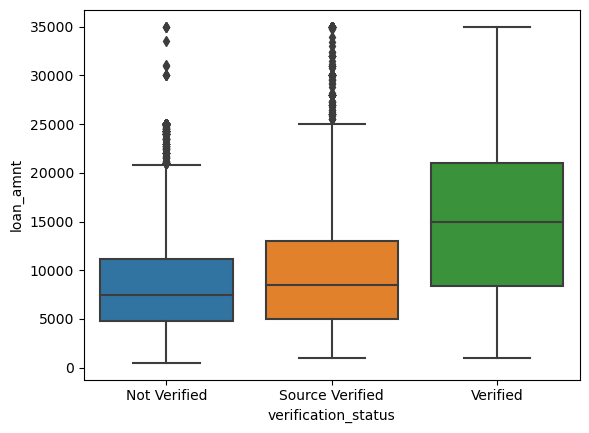

Median: 11.12
q1: 8.32
q3: 13.49
Median: 11.83
q1: 8.90
q3: 14.79
Median: 12.69
q1: 10.36
q3: 15.65


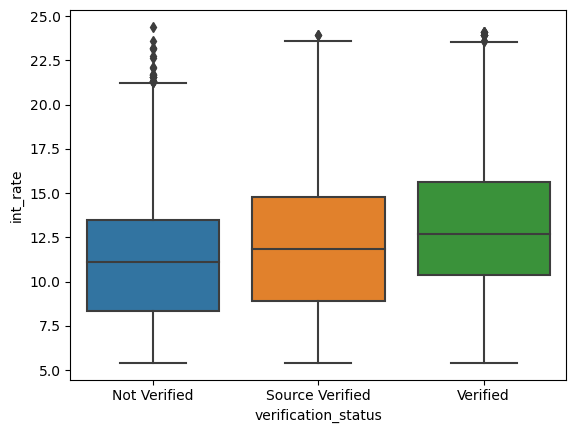

Median: 222.91
q1: 142.17
q3: 335.42
Median: 250.03
q1: 156.41
q3: 370.94
Median: 394.83
q1: 249.44
q3: 579.85


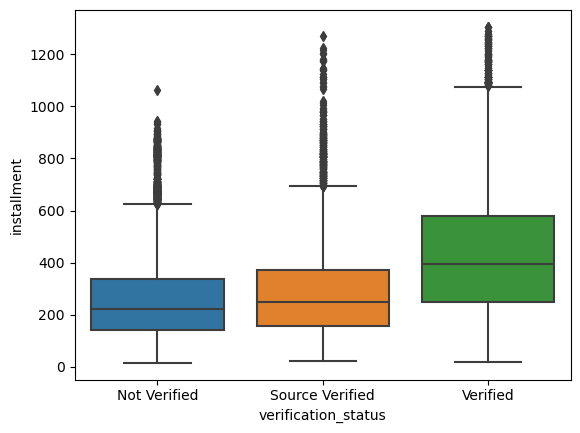

Median: 52000.00
q1: 38000.00
q3: 72000.00
Median: 55000.00
q1: 39000.00
q3: 76404.00
Median: 68000.00
q1: 49000.00
q3: 94000.00


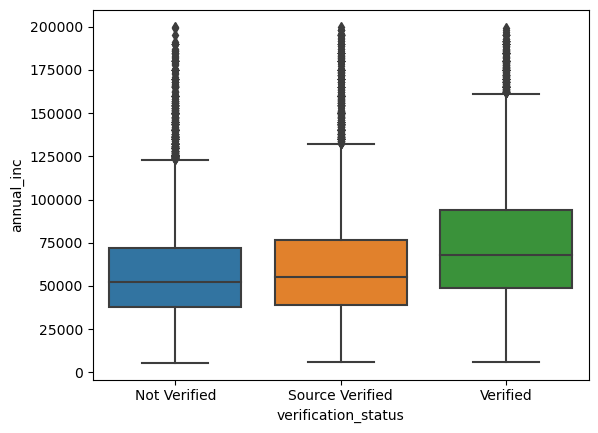

Median: 13.16
q1: 7.97
q3: 18.24
Median: 12.74
q1: 7.56
q3: 17.87
Median: 14.52
q1: 9.30
q3: 19.69


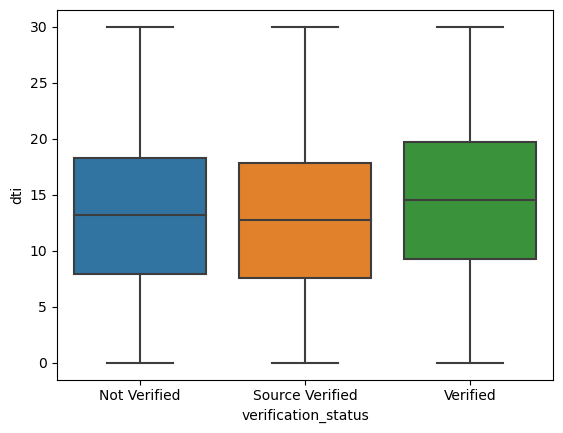

Median: 8.00
q1: 6.00
q3: 11.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 9.00
q1: 7.00
q3: 12.00


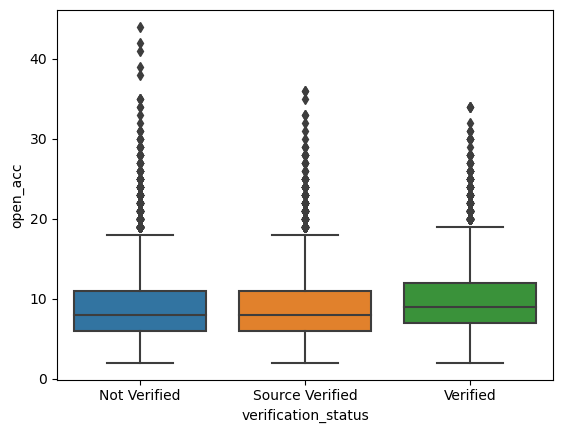

Median: 7796.50
q1: 3354.75
q3: 14535.00
Median: 7390.00
q1: 3102.00
q3: 14004.00
Median: 11762.00
q1: 4824.00
q3: 22187.00


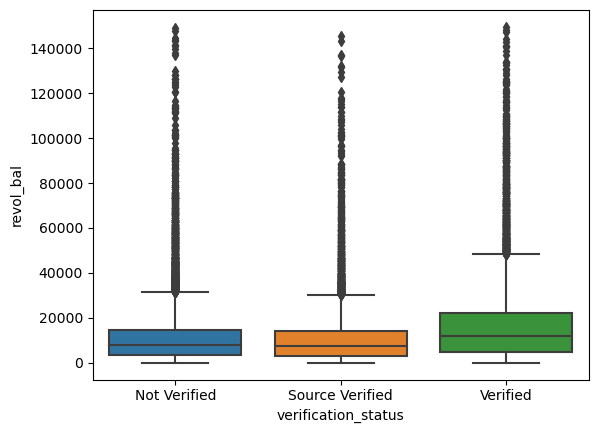

Median: 46.60
q1: 23.00
q3: 70.10
Median: 49.90
q1: 26.30
q3: 73.20
Median: 52.00
q1: 28.10
q3: 74.30


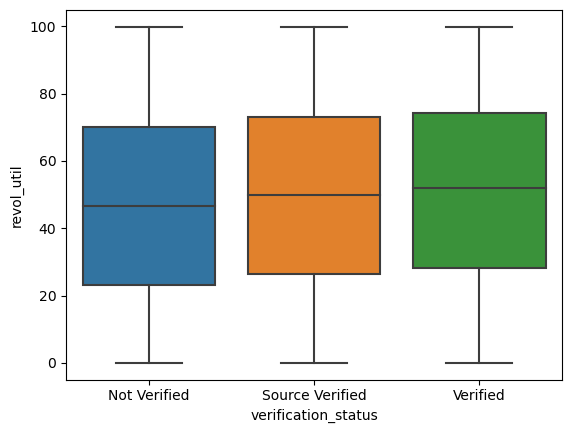

Median: 19.00
q1: 13.00
q3: 27.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 23.00
q1: 15.00
q3: 31.00


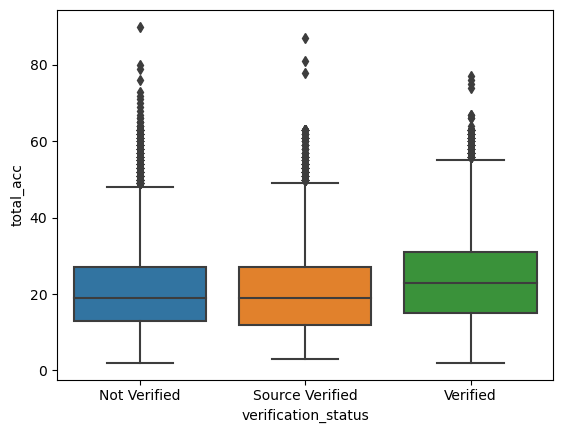

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


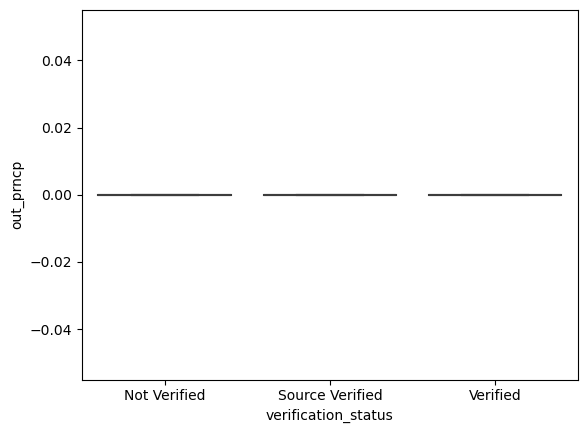

Median: 7669.72
q1: 4638.30
q3: 12080.53
Median: 8812.35
q1: 5176.09
q3: 14261.86
Median: 14528.69
q1: 7990.84
q3: 23641.91


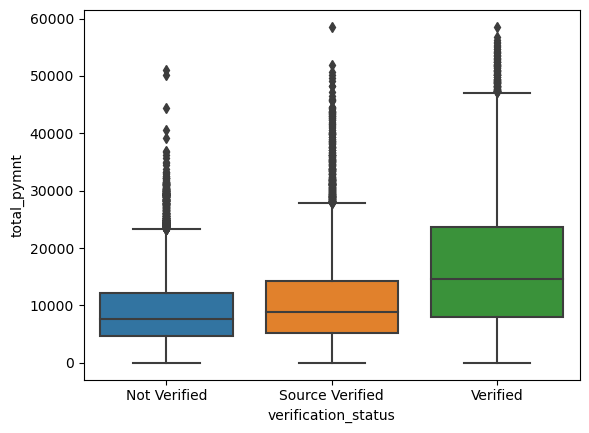

Median: 6470.38
q1: 4000.00
q3: 10000.00
Median: 7200.00
q1: 4000.00
q3: 12000.00
Median: 12000.00
q1: 6000.00
q3: 20000.00


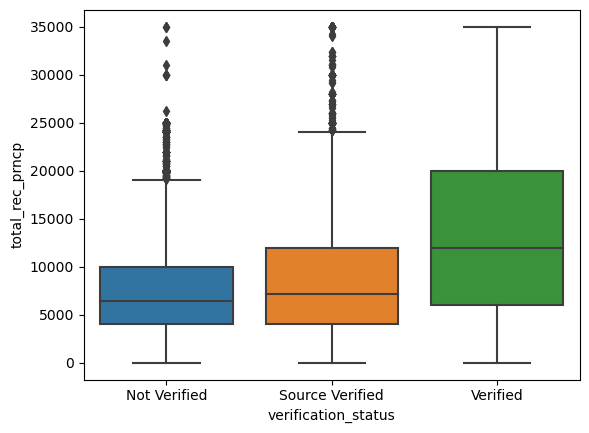

Median: 984.67
q1: 514.52
q3: 1794.22
Median: 1192.73
q1: 612.56
q3: 2365.06
Median: 2260.40
q1: 1023.65
q3: 4456.15


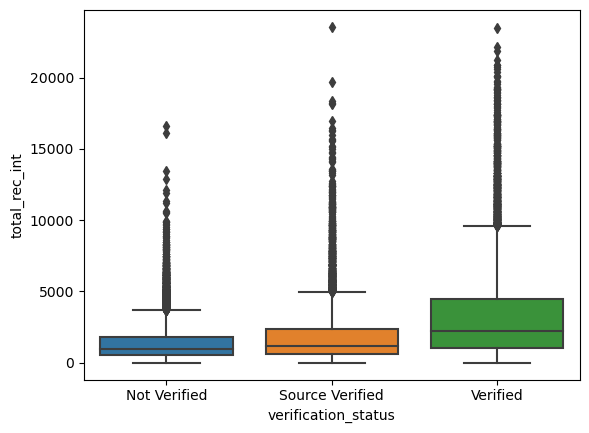

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


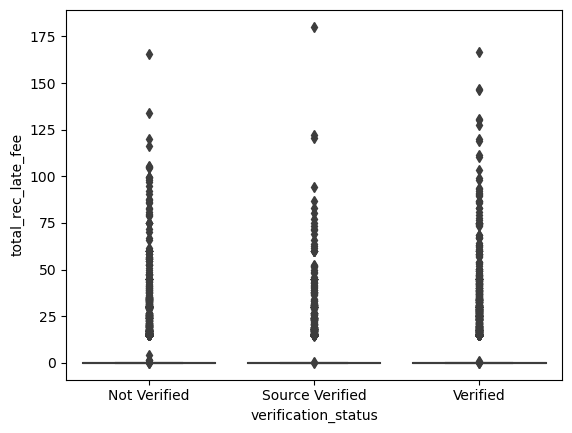

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


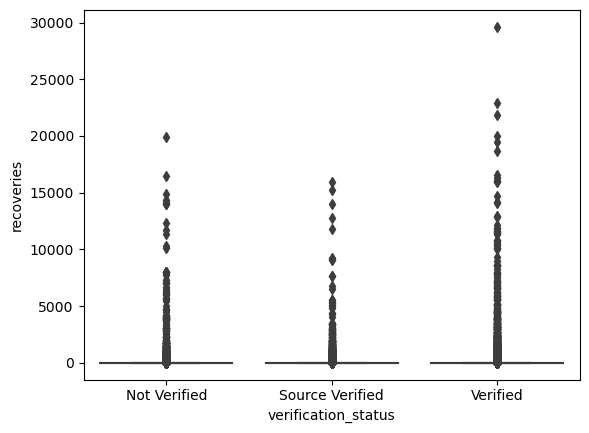

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


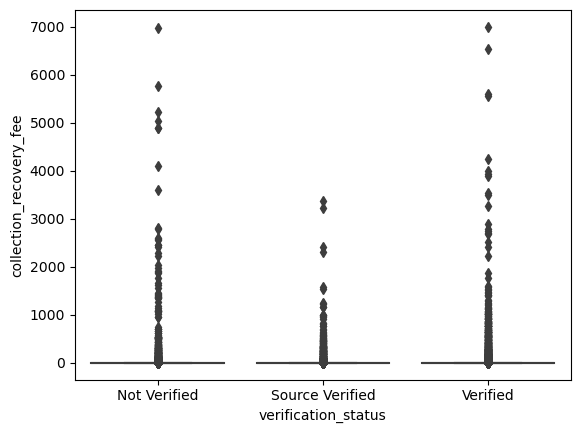

Median: 405.74
q1: 177.47
q3: 2359.93
Median: 531.42
q1: 215.21
q3: 3239.11
Median: 872.25
q1: 323.53
q3: 5853.05


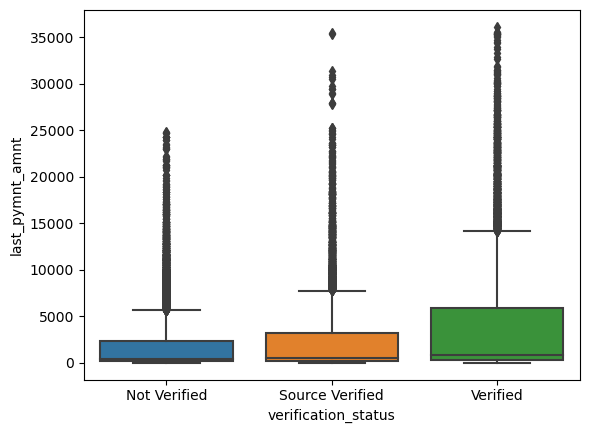

Median: 9250.00
q1: 5000.00
q3: 15000.00
Median: 10000.00
q1: 5600.00
q3: 16000.00


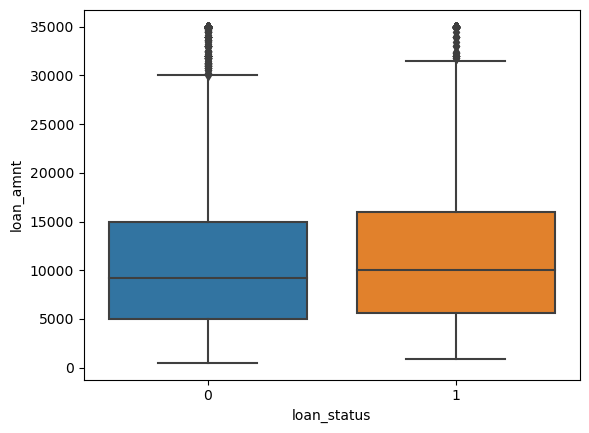

Median: 11.49
q1: 8.49
q3: 13.98
Median: 13.57
q1: 11.28
q3: 16.40


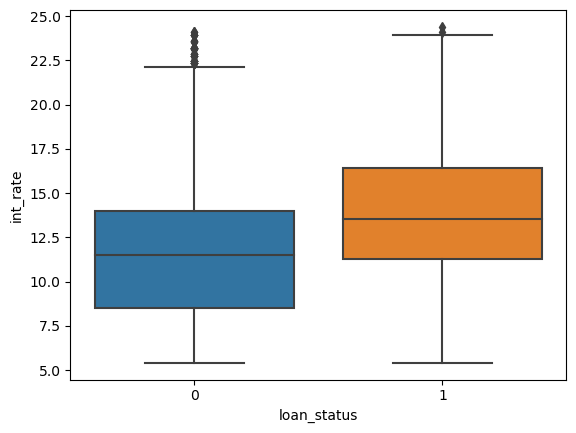

Median: 272.78
q1: 164.07
q3: 412.97
Median: 291.60
q1: 168.44
q3: 452.75


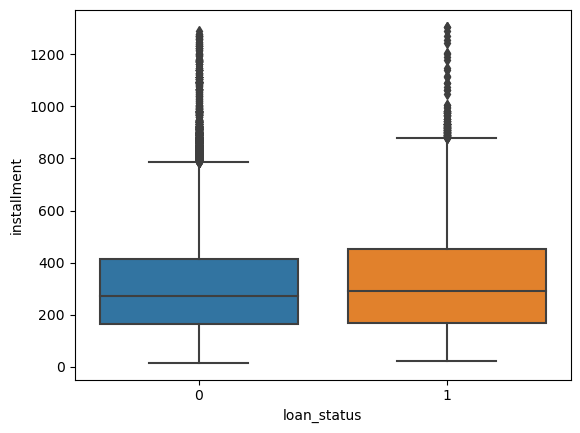

Median: 59000.00
q1: 40927.30
q3: 81120.00
Median: 52509.36
q1: 37000.00
q3: 74000.00


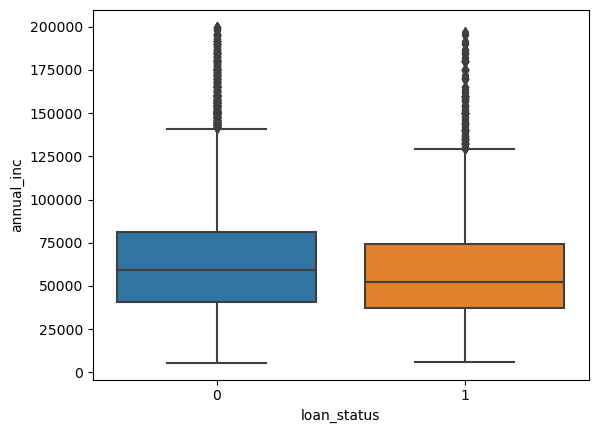

Median: 13.31
q1: 8.10
q3: 18.49
Median: 14.36
q1: 9.14
q3: 19.33


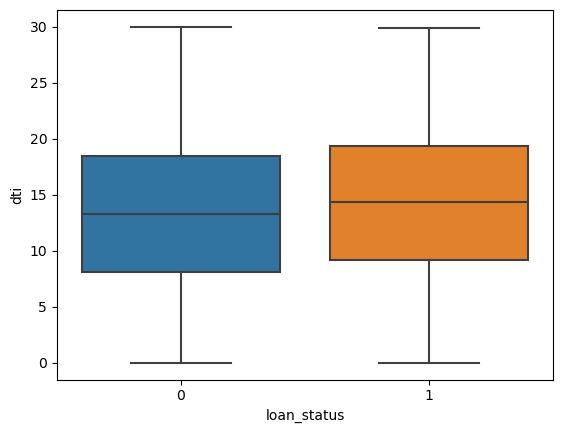

Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00


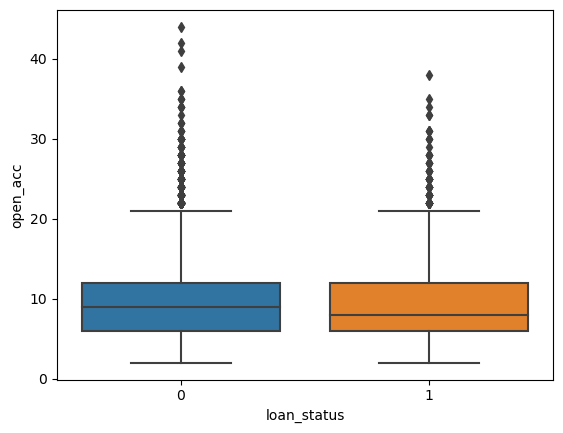

Median: 8588.50
q1: 3571.00
q3: 16507.00
Median: 9099.00
q1: 3948.25
q3: 17252.75


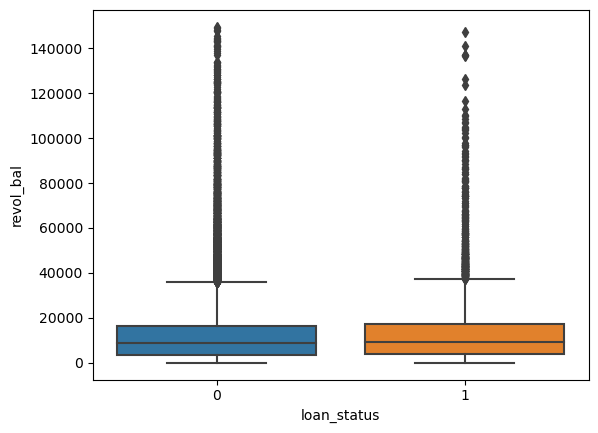

Median: 47.60
q1: 23.90
q3: 70.70
Median: 58.20
q1: 34.30
q3: 79.00


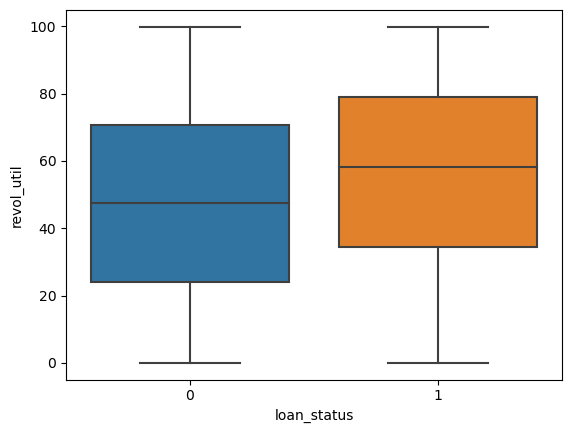

Median: 20.00
q1: 13.00
q3: 29.00
Median: 19.00
q1: 13.00
q3: 28.00


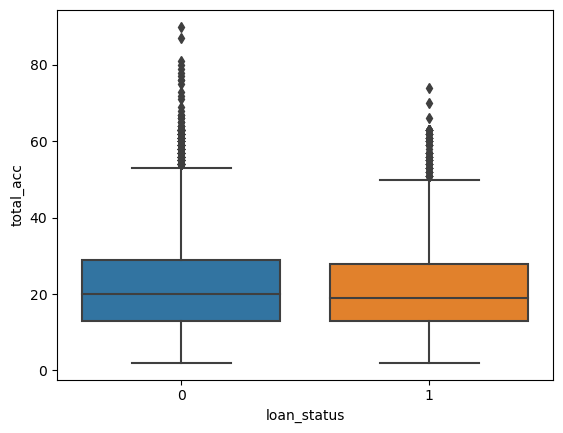

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


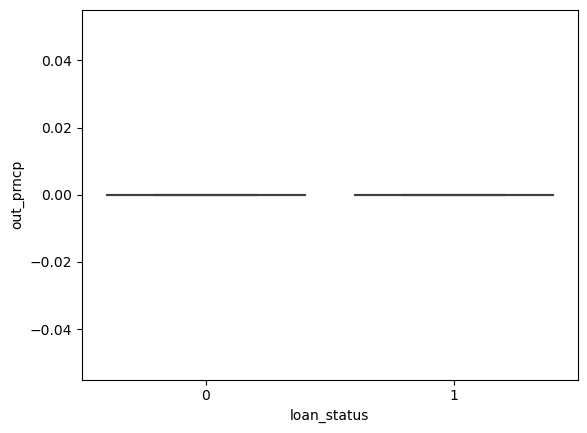

Median: 10556.02
q1: 6089.85
q3: 16794.85
Median: 4805.80
q1: 2204.34
q3: 9110.40


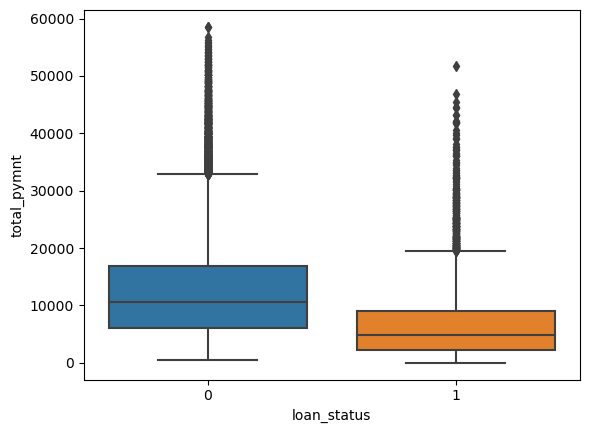

Median: 9000.00
q1: 5000.00
q3: 14400.00
Median: 2715.74
q1: 1197.30
q3: 5281.37


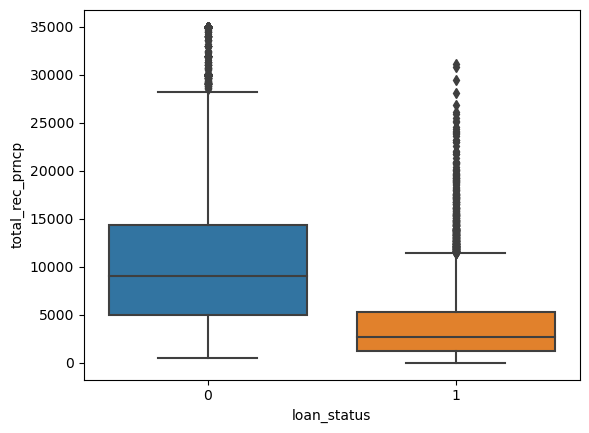

Median: 1286.28
q1: 653.04
q3: 2600.85
Median: 1276.49
q1: 552.40
q3: 2762.16


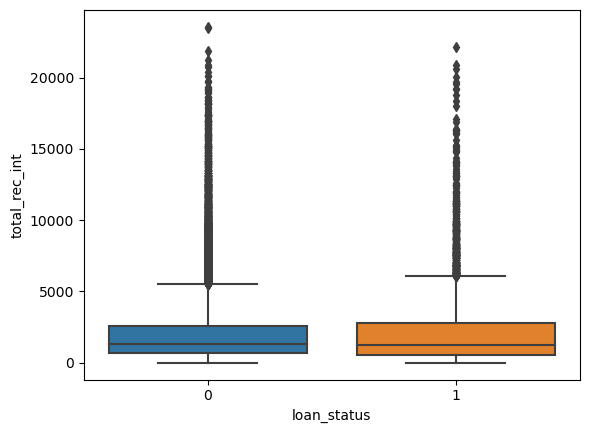

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


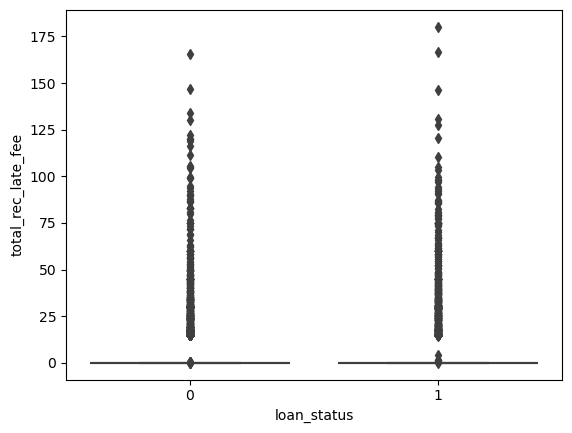

Median: 0.00
q1: 0.00
q3: 0.00
Median: 172.90
q1: 1.57
q3: 586.70


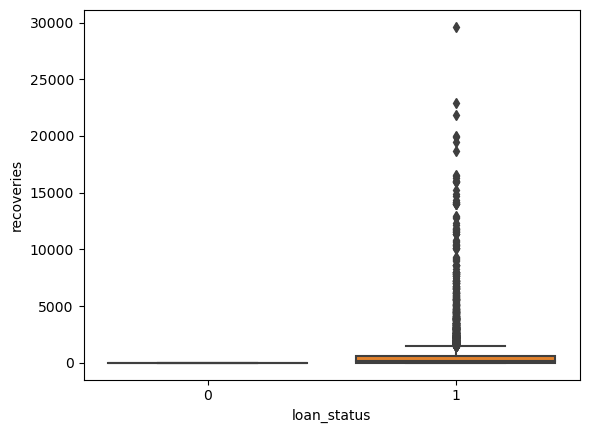

Median: 0.00
q1: 0.00
q3: 0.00
Median: 2.50
q1: 0.00
q3: 9.18


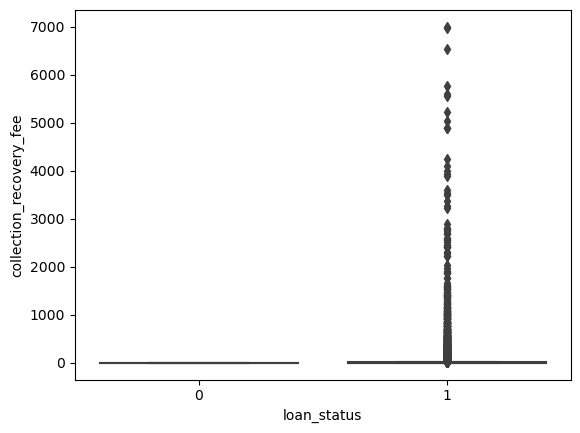

Median: 847.78
q1: 252.60
q3: 4178.79
Median: 237.50
q1: 112.83
q3: 403.54


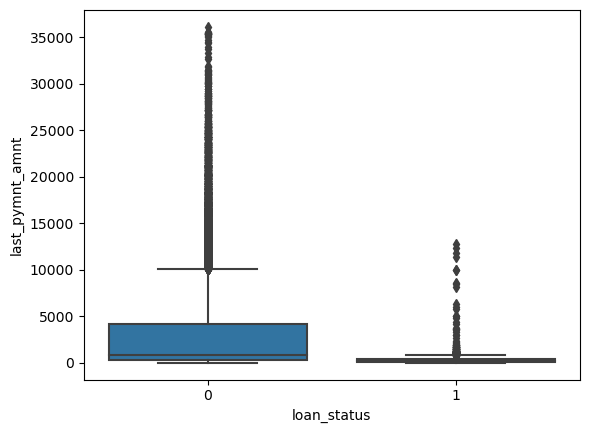

Median: 5900.00
q1: 4000.00
q3: 8400.00
Median: 10000.00
q1: 6093.75
q3: 15000.00
Median: 11000.00
q1: 7000.00
q3: 16000.00
Median: 5350.00
q1: 3000.00
q3: 9243.75
Median: 9000.00
q1: 5000.00
q3: 15000.00
Median: 10000.00
q1: 6000.00
q3: 15000.00
Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 5000.00
q1: 3000.00
q3: 8000.00
Median: 6000.00
q1: 3500.00
q3: 10000.00
Median: 6000.00
q1: 3325.00
q3: 12000.00
Median: 10750.00
q1: 6000.00
q3: 18362.50
Median: 4575.00
q1: 2500.00
q3: 6831.25
Median: 8000.00
q1: 5000.00
q3: 12000.00


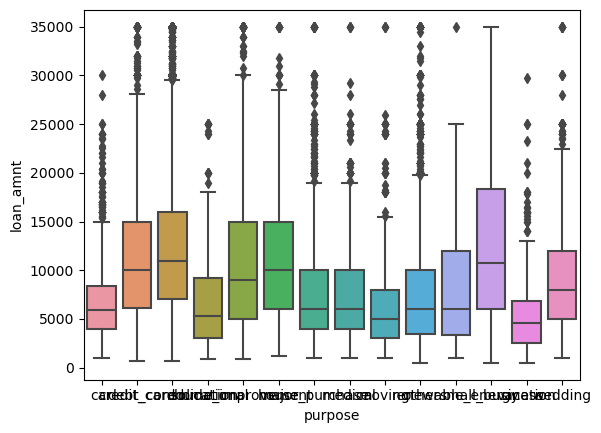

Median: 10.37
q1: 7.51
q3: 13.04
Median: 11.49
q1: 8.90
q3: 13.80
Median: 12.23
q1: 9.99
q3: 14.91
Median: 11.83
q1: 9.63
q3: 13.22
Median: 10.99
q1: 7.88
q3: 13.72
Median: 11.83
q1: 9.27
q3: 15.03
Median: 10.65
q1: 7.51
q3: 13.48
Median: 11.26
q1: 7.90
q3: 14.17
Median: 11.12
q1: 8.49
q3: 13.98
Median: 11.49
q1: 8.90
q3: 13.98
Median: 10.75
q1: 7.90
q3: 13.36
Median: 12.79
q1: 10.00
q3: 15.65
Median: 10.65
q1: 7.66
q3: 13.46
Median: 11.58
q1: 8.94
q3: 14.17


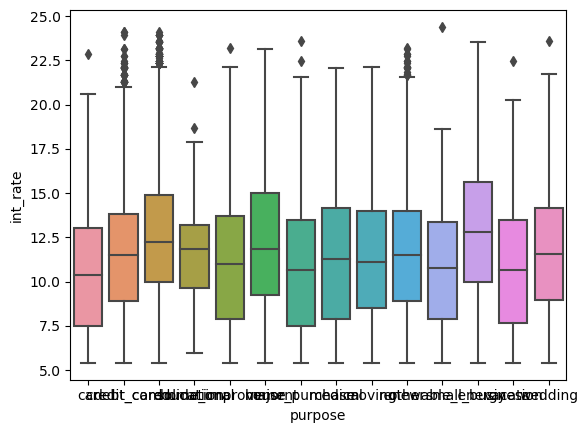

Median: 161.70
q1: 111.03
q3: 236.73
Median: 307.04
q1: 194.40
q3: 446.53
Median: 324.42
q1: 205.33
q3: 475.99
Median: 171.27
q1: 99.71
q3: 279.12
Median: 256.72
q1: 156.42
q3: 395.12
Median: 312.01
q1: 192.37
q3: 466.91
Median: 186.66
q1: 120.64
q3: 301.60
Median: 186.06
q1: 115.47
q3: 311.80
Median: 155.56
q1: 93.31
q3: 234.95
Median: 182.06
q1: 104.36
q3: 309.42
Median: 175.18
q1: 102.50
q3: 325.03
Median: 323.49
q1: 193.90
q3: 506.56
Median: 140.55
q1: 75.56
q3: 206.48
Median: 246.64
q1: 164.43
q3: 368.14


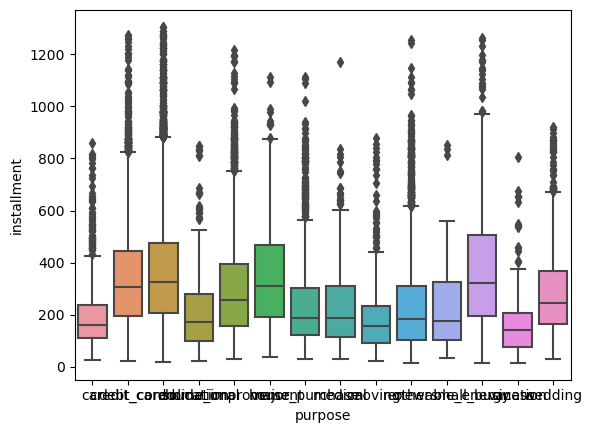

Median: 54000.00
q1: 38000.00
q3: 75000.00
Median: 60000.00
q1: 43000.00
q3: 84000.00
Median: 57359.00
q1: 40428.00
q3: 79200.00
Median: 41000.00
q1: 26625.00
q3: 69381.00
Median: 70000.00
q1: 48000.00
q3: 97000.00
Median: 60000.00
q1: 42250.00
q3: 84950.00
Median: 54180.00
q1: 37108.50
q3: 77248.00
Median: 54000.00
q1: 38000.00
q3: 76900.00
Median: 48500.00
q1: 33340.00
q3: 72000.00
Median: 51600.00
q1: 36000.00
q3: 75000.00
Median: 60000.00
q1: 35887.82
q3: 86000.00
Median: 62000.00
q1: 43300.25
q3: 89000.00
Median: 51600.00
q1: 37162.00
q3: 75000.00
Median: 59250.00
q1: 42000.00
q3: 77000.00


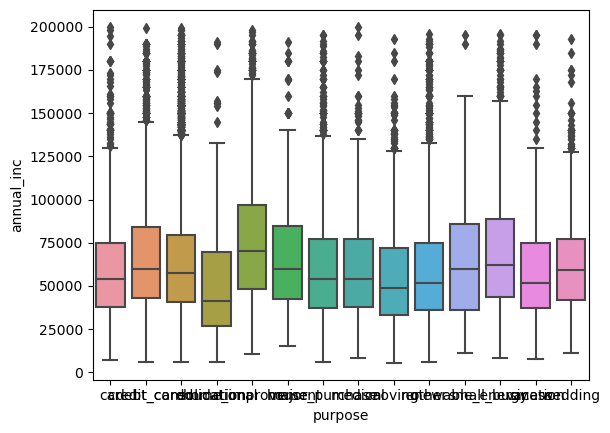

Median: 10.68
q1: 5.20
q3: 16.26
Median: 14.78
q1: 10.14
q3: 19.44
Median: 14.64
q1: 9.76
q3: 19.51
Median: 11.40
q1: 6.18
q3: 15.80
Median: 10.79
q1: 5.72
q3: 16.46
Median: 10.42
q1: 4.50
q3: 15.55
Median: 10.44
q1: 5.29
q3: 15.63
Median: 12.48
q1: 6.64
q3: 17.76
Median: 11.60
q1: 5.84
q3: 17.41
Median: 12.41
q1: 6.69
q3: 17.83
Median: 12.25
q1: 7.69
q3: 16.84
Median: 10.62
q1: 5.66
q3: 16.59
Median: 11.69
q1: 6.58
q3: 18.39
Median: 12.50
q1: 7.21
q3: 17.51


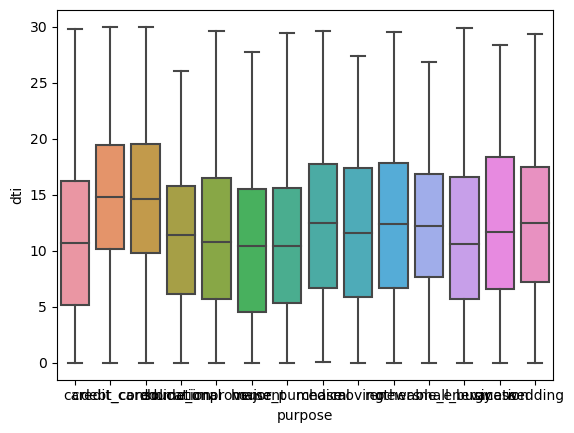

Median: 8.00
q1: 5.00
q3: 11.00
Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 7.00
q1: 5.00
q3: 10.00
Median: 8.00
q1: 6.00
q3: 11.00
Median: 7.00
q1: 5.00
q3: 10.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 8.00
q1: 5.00
q3: 12.00
Median: 8.00
q1: 5.00
q3: 11.00
Median: 7.00
q1: 5.00
q3: 10.00
Median: 8.00
q1: 6.00
q3: 11.00


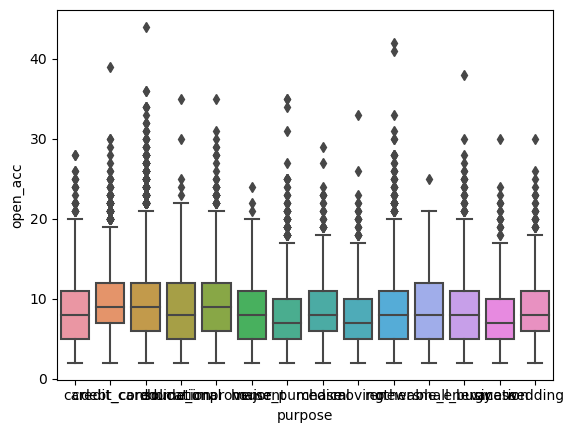

Median: 5000.00
q1: 1738.00
q3: 12218.00
Median: 12843.50
q1: 7078.50
q3: 21044.00
Median: 10506.00
q1: 5418.00
q3: 18121.00
Median: 3639.50
q1: 1282.75
q3: 9311.25
Median: 5960.00
q1: 2003.00
q3: 13718.00
Median: 4752.00
q1: 1589.50
q3: 10222.75
Median: 4105.00
q1: 1439.00
q3: 9538.00
Median: 4624.00
q1: 1651.50
q3: 11370.00
Median: 4159.00
q1: 1320.00
q3: 9553.00
Median: 5255.00
q1: 1933.25
q3: 12070.50
Median: 6281.00
q1: 2834.50
q3: 15838.50
Median: 6050.50
q1: 1946.50
q3: 14702.00
Median: 4167.00
q1: 1512.00
q3: 9246.75
Median: 5144.00
q1: 2045.75
q3: 11021.50


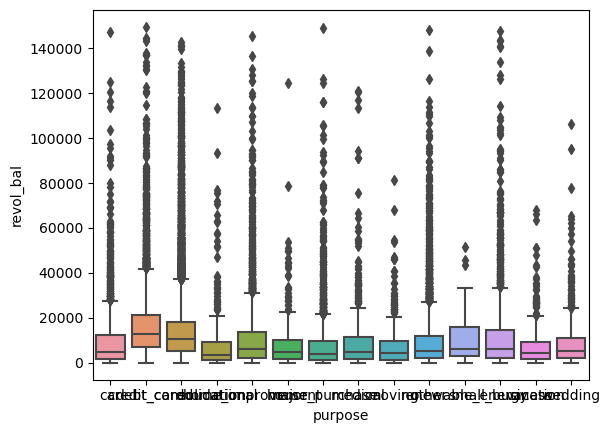

Median: 30.90
q1: 12.00
q3: 57.70
Median: 58.50
q1: 36.80
q3: 77.50
Median: 55.00
q1: 33.70
q3: 75.20
Median: 32.60
q1: 10.85
q3: 61.42
Median: 31.30
q1: 10.40
q3: 57.70
Median: 30.75
q1: 10.03
q3: 54.70
Median: 30.45
q1: 9.90
q3: 56.60
Median: 38.30
q1: 12.80
q3: 68.10
Median: 41.10
q1: 15.80
q3: 71.80
Median: 43.40
q1: 17.77
q3: 71.20
Median: 44.70
q1: 22.35
q3: 73.70
Median: 38.00
q1: 13.90
q3: 65.20
Median: 39.10
q1: 12.40
q3: 68.90
Median: 40.30
q1: 18.30
q3: 65.00


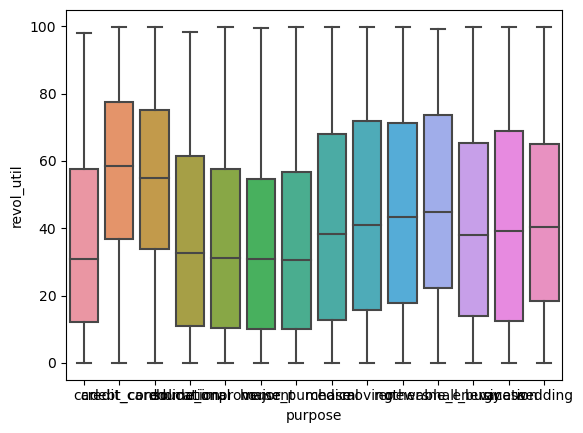

Median: 19.00
q1: 12.00
q3: 28.00
Median: 21.00
q1: 15.00
q3: 29.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 16.00
q1: 9.00
q3: 25.00
Median: 23.00
q1: 15.00
q3: 31.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 18.00
q1: 11.00
q3: 26.00
Median: 19.00
q1: 13.00
q3: 28.00
Median: 17.00
q1: 10.00
q3: 25.00
Median: 18.00
q1: 11.00
q3: 26.00
Median: 22.00
q1: 13.50
q3: 30.00
Median: 19.00
q1: 12.00
q3: 28.00
Median: 19.00
q1: 12.00
q3: 27.00
Median: 17.00
q1: 11.00
q3: 25.00


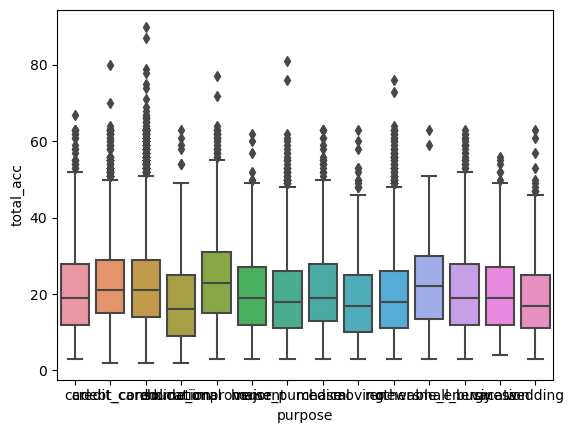

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


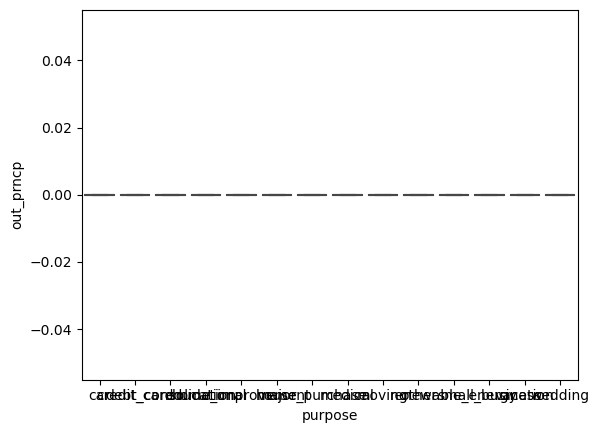

Median: 6320.60
q1: 4169.77
q3: 9486.70
Median: 10955.70
q1: 6589.19
q3: 16703.84
Median: 11450.01
q1: 6658.25
q3: 17899.98
Median: 5713.71
q1: 3025.55
q3: 9344.14
Median: 9386.55
q1: 5303.05
q3: 15581.51
Median: 11028.14
q1: 6216.08
q3: 17457.91
Median: 6628.80
q1: 4039.25
q3: 10866.75
Median: 6464.68
q1: 3652.33
q3: 11229.41
Median: 5049.64
q1: 2964.83
q3: 7966.72
Median: 6090.50
q1: 3388.34
q3: 10960.89
Median: 6039.47
q1: 3556.64
q3: 12608.24
Median: 10370.20
q1: 5406.12
q3: 17332.57
Median: 4729.28
q1: 2455.93
q3: 7404.12
Median: 8975.40
q1: 5684.60
q3: 13594.28


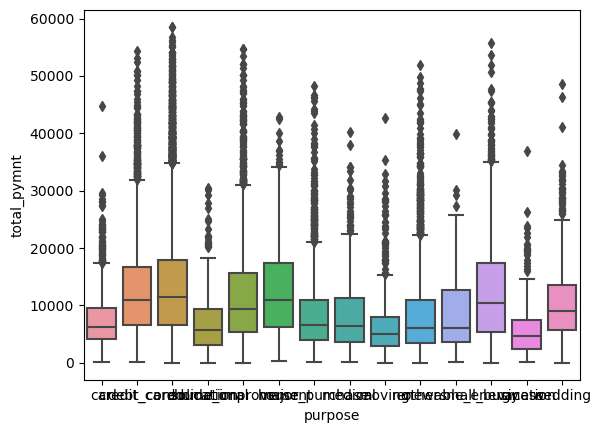

Median: 5300.00
q1: 3500.00
q3: 8000.00
Median: 9250.00
q1: 5500.00
q3: 14000.00
Median: 9999.99
q1: 5300.00
q3: 15000.00
Median: 5000.00
q1: 2500.00
q3: 7500.00
Median: 8000.00
q1: 4487.45
q3: 13000.00
Median: 10000.00
q1: 5000.00
q3: 15000.00
Median: 5793.68
q1: 3492.77
q3: 9800.00
Median: 5175.00
q1: 3000.00
q3: 9600.00
Median: 4200.00
q1: 2400.00
q3: 7000.00
Median: 5000.00
q1: 2700.00
q3: 9600.00
Median: 5000.00
q1: 2450.00
q3: 10487.50
Median: 8000.00
q1: 3940.69
q3: 14400.00
Median: 4000.00
q1: 2000.00
q3: 6000.00
Median: 7500.00
q1: 5000.00
q3: 11549.99


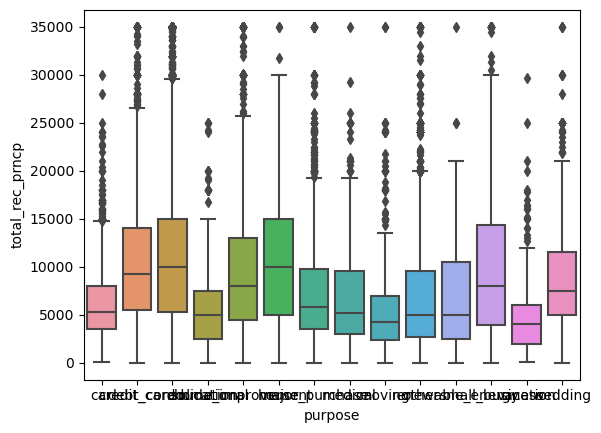

Median: 786.11
q1: 422.44
q3: 1425.37
Median: 1419.16
q1: 768.05
q3: 2703.22
Median: 1636.96
q1: 833.72
q3: 3166.20
Median: 757.12
q1: 380.77
q3: 1356.56
Median: 1127.87
q1: 557.34
q3: 2485.62
Median: 1294.22
q1: 672.79
q3: 2753.83
Median: 785.52
q1: 411.61
q3: 1531.18
Median: 804.01
q1: 423.35
q3: 1490.05
Median: 668.47
q1: 364.50
q3: 1204.92
Median: 834.06
q1: 413.58
q3: 1637.31
Median: 608.82
q1: 348.25
q3: 1643.29
Median: 1632.44
q1: 749.44
q3: 3387.30
Median: 571.29
q1: 273.51
q3: 1005.03
Median: 1189.89
q1: 656.46
q3: 2239.16


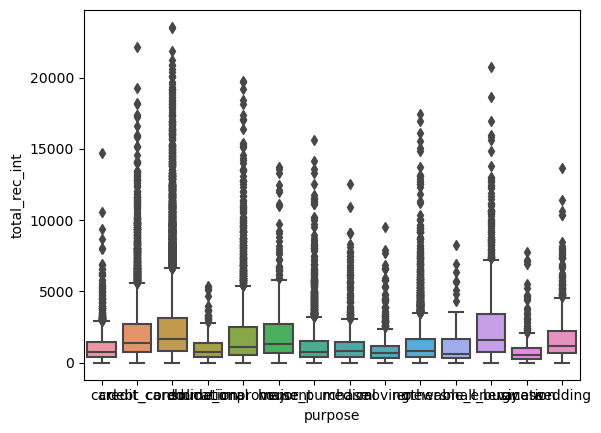

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


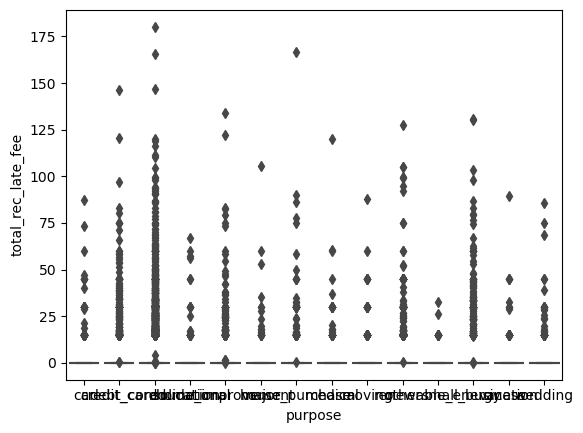

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


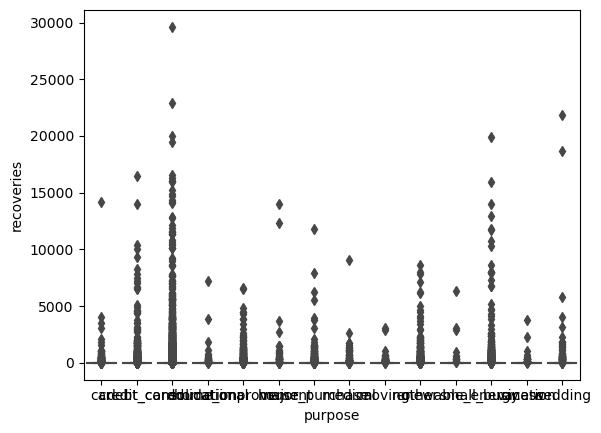

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


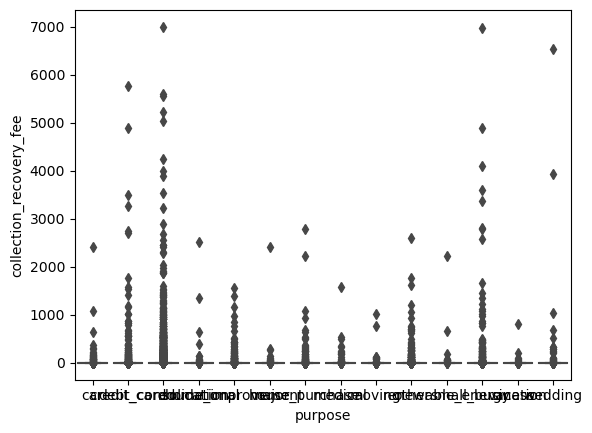

Median: 423.64
q1: 152.69
q3: 2373.78
Median: 585.60
q1: 246.31
q3: 3388.90
Median: 691.75
q1: 271.78
q3: 4377.32
Median: 247.84
q1: 100.97
q3: 1002.58
Median: 572.62
q1: 206.92
q3: 3728.20
Median: 901.73
q1: 242.03
q3: 5110.66
Median: 410.34
q1: 167.56
q3: 2424.28
Median: 350.07
q1: 139.55
q3: 2223.86
Median: 259.58
q1: 119.79
q3: 1368.57
Median: 346.34
q1: 146.06
q3: 1901.52
Median: 396.75
q1: 127.01
q3: 1552.76
Median: 516.42
q1: 218.87
q3: 2447.96
Median: 254.18
q1: 109.11
q3: 1399.22
Median: 534.25
q1: 204.06
q3: 2973.54


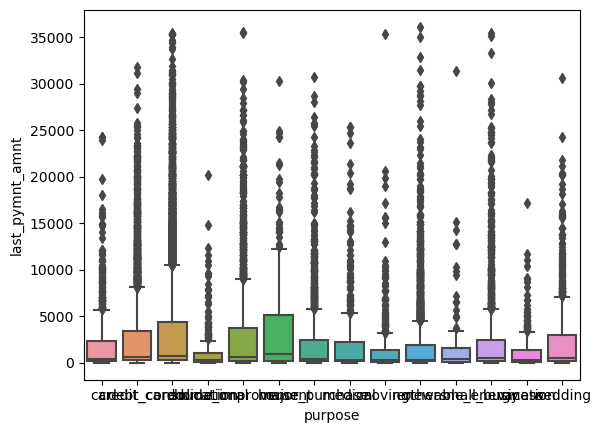

Median: 9600.00
q1: 5400.00
q3: 15000.00
Median: 8500.00
q1: 5000.00
q3: 14000.00
Median: 8000.00
q1: 5000.00
q3: 13000.00
Median: 8000.00
q1: 4800.00
q3: 13375.00
Median: 7500.00
q1: 4625.00
q3: 12000.00
Median: 7000.00
q1: 4200.00
q3: 10000.00
Median: 5250.00
q1: 2575.00
q3: 7875.00
Median: 7237.50
q1: 4950.00
q3: 9656.25
Median: 8100.00
q1: 6150.00
q3: 10050.00
Median: 5000.00
q1: 5000.00
q3: 5000.00
Median: 5000.00
q1: 5000.00
q3: 5000.00


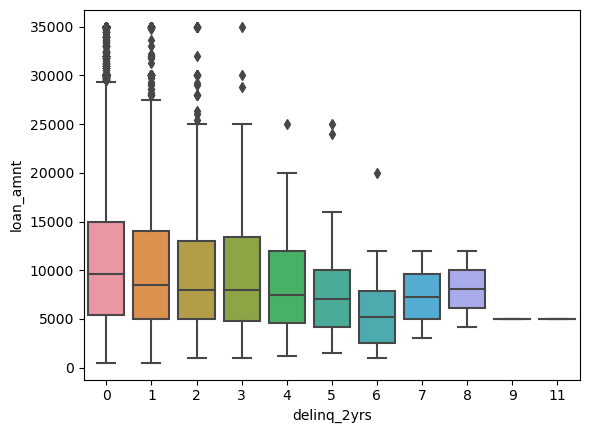

Median: 11.49
q1: 8.59
q3: 14.17
Median: 13.35
q1: 10.99
q3: 15.62
Median: 14.11
q1: 12.19
q3: 16.32
Median: 14.09
q1: 12.18
q3: 16.77
Median: 15.79
q1: 13.10
q3: 17.56
Median: 14.26
q1: 12.99
q3: 16.02
Median: 13.74
q1: 12.48
q3: 15.77
Median: 17.64
q1: 16.07
q3: 18.45
Median: 16.93
q1: 16.28
q3: 17.59
Median: 14.79
q1: 14.79
q3: 14.79
Median: 10.74
q1: 10.74
q3: 10.74


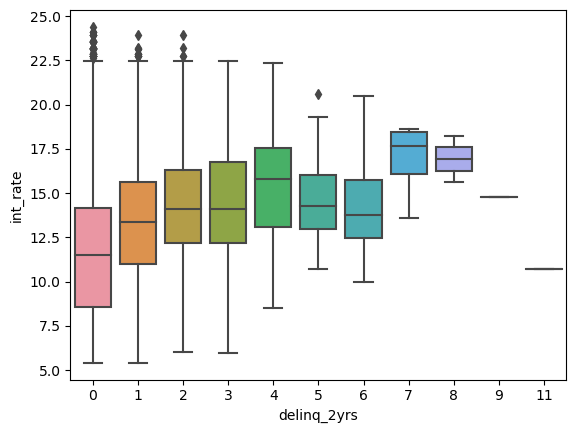

Median: 277.05
q1: 165.82
q3: 421.89
Median: 262.33
q1: 158.77
q3: 405.29
Median: 257.22
q1: 162.82
q3: 393.50
Median: 249.92
q1: 157.26
q3: 396.99
Median: 205.19
q1: 140.41
q3: 356.83
Median: 204.23
q1: 141.64
q3: 363.49
Median: 173.89
q1: 72.88
q3: 202.50
Median: 226.10
q1: 133.04
q3: 310.58
Median: 226.62
q1: 186.75
q3: 266.49
Median: 172.82
q1: 172.82
q3: 172.82
Median: 163.08
q1: 163.08
q3: 163.08


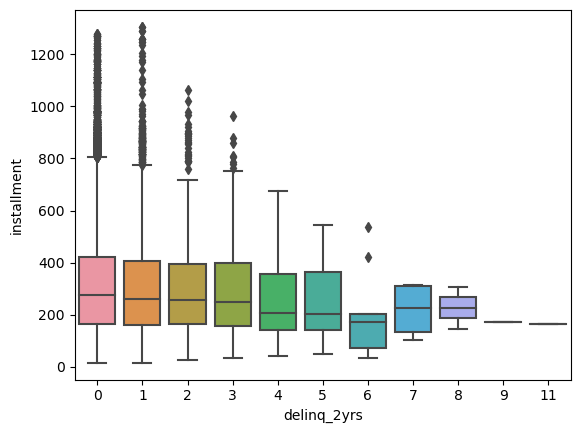

Median: 57000.00
q1: 40000.00
q3: 80000.00
Median: 60000.00
q1: 42000.00
q3: 85000.00
Median: 60000.00
q1: 42030.00
q3: 86850.00
Median: 55000.00
q1: 44550.00
q3: 79250.00
Median: 65500.00
q1: 46375.00
q3: 94650.00
Median: 78000.00
q1: 48960.00
q3: 105000.00
Median: 60315.00
q1: 50001.00
q3: 70625.00
Median: 55252.00
q1: 47003.00
q3: 62175.00
Median: 51100.00
q1: 43050.00
q3: 59150.00
Median: 130000.00
q1: 130000.00
q3: 130000.00
Median: 53000.00
q1: 53000.00
q3: 53000.00


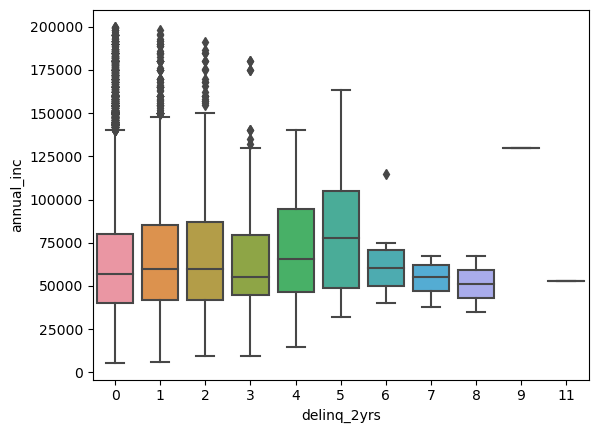

Median: 13.55
q1: 8.33
q3: 18.73
Median: 12.85
q1: 7.62
q3: 17.75
Median: 12.04
q1: 7.29
q3: 17.56
Median: 11.98
q1: 7.75
q3: 16.83
Median: 13.78
q1: 10.80
q3: 19.49
Median: 9.57
q1: 7.99
q3: 14.58
Median: 20.39
q1: 13.49
q3: 22.31
Median: 15.07
q1: 11.19
q3: 17.44
Median: 10.90
q1: 10.30
q3: 11.51
Median: 8.82
q1: 8.82
q3: 8.82
Median: 9.74
q1: 9.74
q3: 9.74


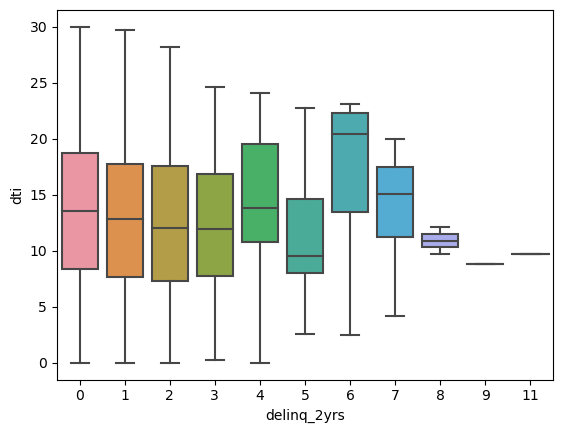

Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 8.00
q1: 6.00
q3: 12.00
Median: 8.50
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 14.50
q1: 12.00
q3: 16.75
Median: 8.50
q1: 7.25
q3: 9.25
Median: 8.50
q1: 7.75
q3: 9.25
Median: 7.00
q1: 7.00
q3: 7.00
Median: 16.00
q1: 16.00
q3: 16.00


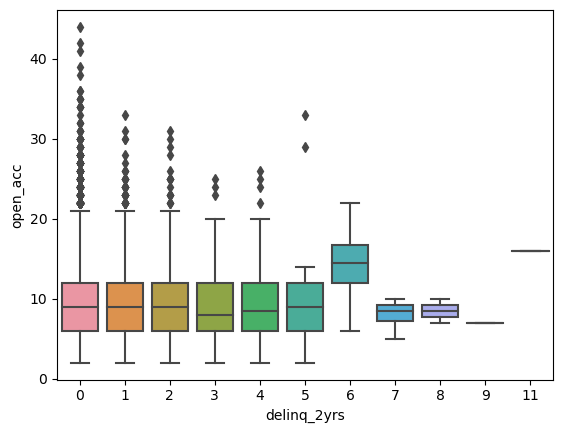

Median: 8935.50
q1: 3817.75
q3: 17004.25
Median: 6899.00
q1: 2691.00
q3: 13809.00
Median: 5766.50
q1: 1960.50
q3: 12435.25
Median: 3018.00
q1: 853.00
q3: 8001.00
Median: 2997.50
q1: 940.00
q3: 8947.25
Median: 1070.00
q1: 713.00
q3: 7483.00
Median: 3895.50
q1: 1301.50
q3: 8330.00
Median: 1074.00
q1: 821.50
q3: 2737.00
Median: 1443.50
q1: 960.75
q3: 1926.25
Median: 1796.00
q1: 1796.00
q3: 1796.00
Median: 2357.00
q1: 2357.00
q3: 2357.00


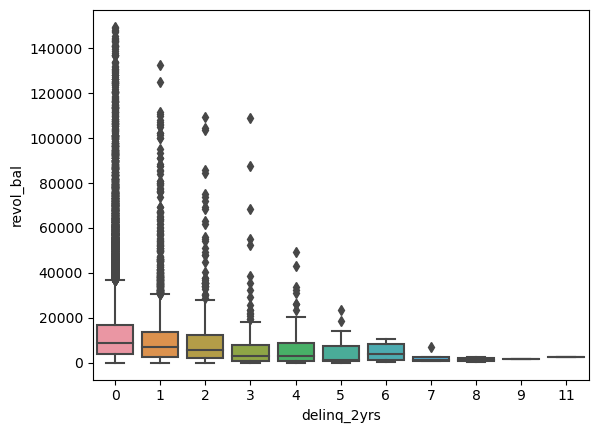

Median: 49.50
q1: 25.50
q3: 72.60
Median: 46.20
q1: 24.20
q3: 70.00
Median: 43.50
q1: 23.60
q3: 65.00
Median: 35.25
q1: 19.45
q3: 58.62
Median: 43.20
q1: 22.80
q3: 63.80
Median: 35.00
q1: 9.34
q3: 54.10
Median: 31.05
q1: 12.22
q3: 41.60
Median: 35.65
q1: 13.88
q3: 60.15
Median: 72.40
q1: 68.75
q3: 76.05
Median: 17.10
q1: 17.10
q3: 17.10
Median: 8.30
q1: 8.30
q3: 8.30


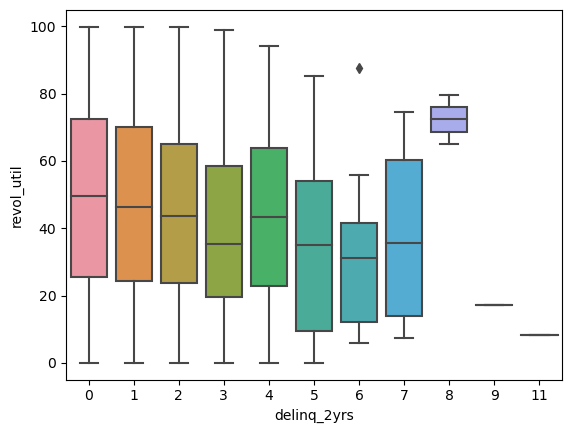

Median: 20.00
q1: 13.00
q3: 28.00
Median: 22.00
q1: 15.00
q3: 30.00
Median: 24.00
q1: 17.00
q3: 31.00
Median: 23.00
q1: 16.00
q3: 32.00
Median: 27.00
q1: 17.00
q3: 35.00
Median: 28.00
q1: 21.00
q3: 40.00
Median: 31.00
q1: 25.25
q3: 35.50
Median: 25.50
q1: 23.00
q3: 26.25
Median: 18.00
q1: 17.50
q3: 18.50
Median: 32.00
q1: 32.00
q3: 32.00
Median: 21.00
q1: 21.00
q3: 21.00


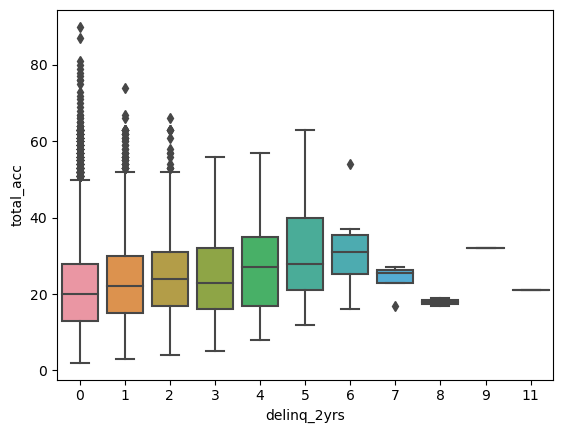

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


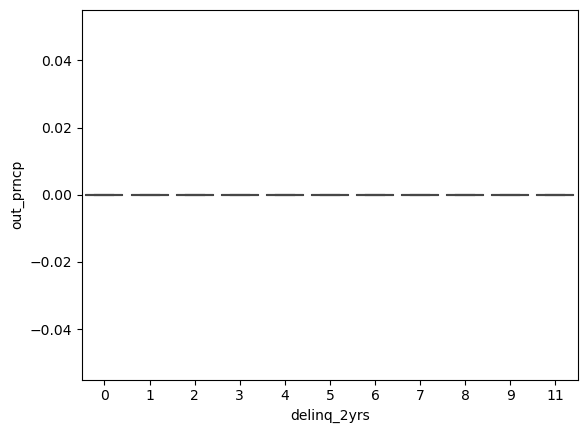

Median: 9667.79
q1: 5522.18
q3: 15964.79
Median: 8911.91
q1: 5096.15
q3: 14827.71
Median: 8488.20
q1: 4841.62
q3: 14241.95
Median: 8848.67
q1: 4480.41
q3: 15152.88
Median: 8058.10
q1: 4281.72
q3: 14162.56
Median: 7469.17
q1: 4743.73
q3: 10154.26
Median: 5944.64
q1: 3221.49
q3: 7575.85
Median: 7508.64
q1: 2983.46
q3: 13091.00
Median: 4112.63
q1: 3743.82
q3: 4481.45
Median: 6221.20
q1: 6221.20
q3: 6221.20
Median: 5870.82
q1: 5870.82
q3: 5870.82


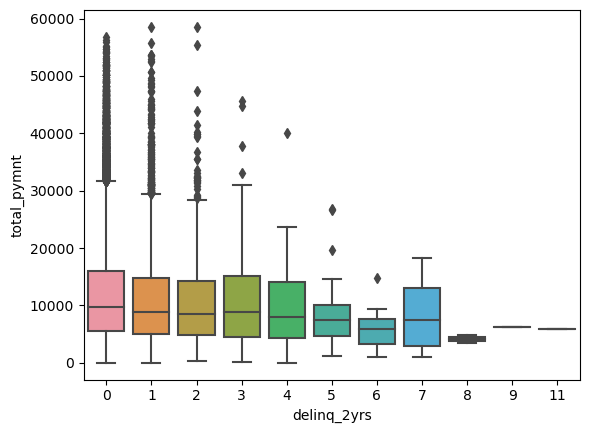

Median: 8000.00
q1: 4500.00
q3: 13000.00
Median: 7199.99
q1: 4000.00
q3: 12000.00
Median: 7000.00
q1: 3600.00
q3: 12000.00
Median: 7000.00
q1: 3262.50
q3: 12000.00
Median: 6000.00
q1: 2703.39
q3: 11799.99
Median: 6000.00
q1: 4000.00
q3: 10000.00
Median: 3650.00
q1: 1532.39
q3: 6000.00
Median: 5937.50
q1: 2334.86
q3: 9656.25
Median: 2690.15
q1: 1935.22
q3: 3445.07
Median: 5000.00
q1: 5000.00
q3: 5000.00
Median: 5000.00
q1: 5000.00
q3: 5000.00


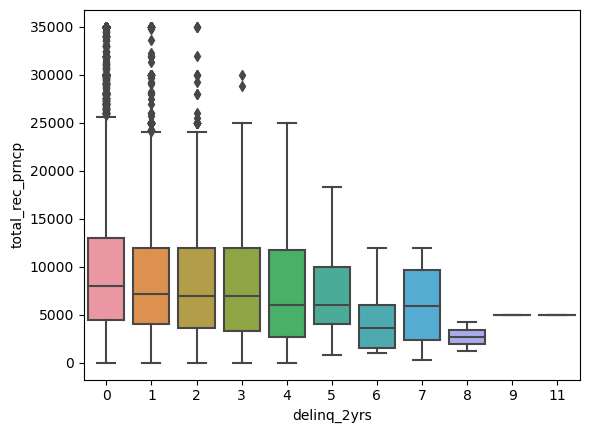

Median: 1267.36
q1: 632.82
q3: 2611.48
Median: 1386.51
q1: 677.03
q3: 2733.41
Median: 1396.07
q1: 688.85
q3: 2604.01
Median: 1503.38
q1: 698.30
q3: 3141.72
Median: 1703.39
q1: 963.77
q3: 2730.94
Median: 1302.59
q1: 743.73
q3: 2605.77
Median: 835.87
q1: 485.78
q3: 1047.94
Median: 1580.76
q1: 658.22
q3: 3434.75
Median: 1108.11
q1: 879.18
q3: 1337.04
Median: 1221.20
q1: 1221.20
q3: 1221.20
Median: 870.82
q1: 870.82
q3: 870.82


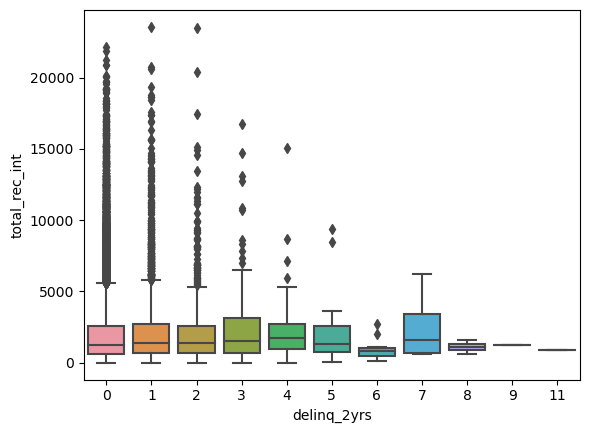

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


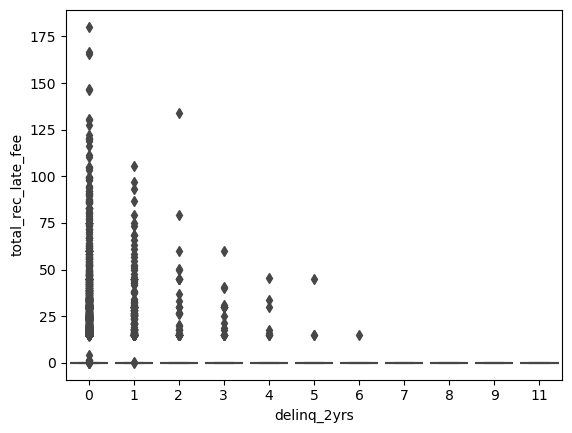

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 314.38
q1: 157.19
q3: 471.56
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


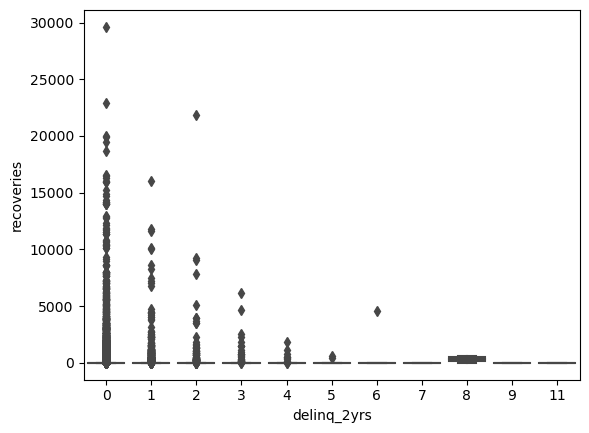

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 57.59
q1: 28.79
q3: 86.38
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


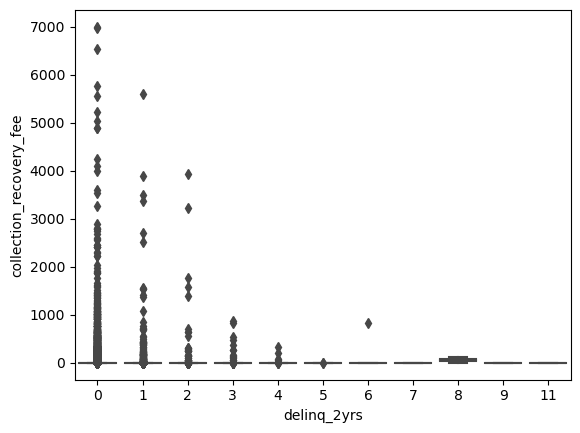

Median: 568.20
q1: 219.23
q3: 3423.08
Median: 497.70
q1: 193.28
q3: 3116.44
Median: 471.39
q1: 195.81
q3: 2921.78
Median: 455.75
q1: 178.87
q3: 2424.45
Median: 368.38
q1: 154.34
q3: 1872.95
Median: 449.09
q1: 205.87
q3: 2347.32
Median: 620.93
q1: 177.36
q3: 4273.84
Median: 419.91
q1: 335.95
q3: 1222.81
Median: 1624.97
q1: 965.66
q3: 2284.27
Median: 181.08
q1: 181.08
q3: 181.08
Median: 174.59
q1: 174.59
q3: 174.59


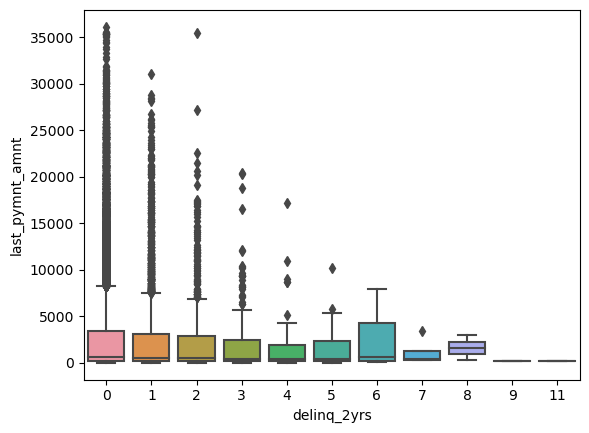

Median: 9600.00
q1: 5300.00
q3: 15000.00
Median: 9500.00
q1: 5018.75
q3: 15000.00
Median: 9600.00
q1: 5000.00
q3: 15000.00
Median: 9000.00
q1: 5000.00
q3: 14400.00
Median: 10150.00
q1: 6700.00
q3: 18000.00
Median: 11000.00
q1: 6000.00
q3: 18125.00
Median: 10000.00
q1: 7000.00
q3: 20000.00
Median: 10000.00
q1: 7750.00
q3: 16000.00
Median: 14000.00
q1: 5150.00
q3: 21250.00


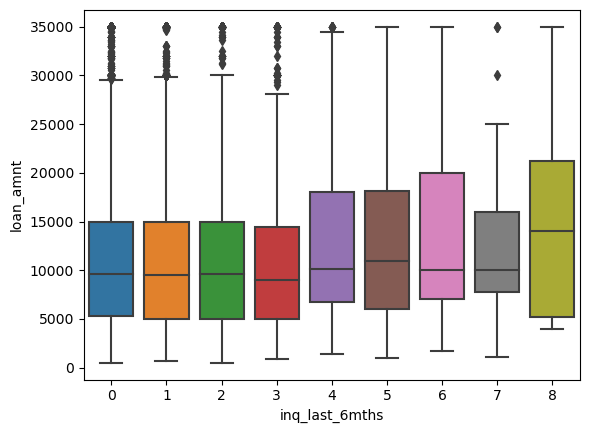

Median: 10.99
q1: 7.90
q3: 13.49
Median: 12.42
q1: 9.91
q3: 14.79
Median: 12.84
q1: 10.27
q3: 15.23
Median: 12.99
q1: 10.38
q3: 15.27
Median: 9.99
q1: 7.81
q3: 11.99
Median: 11.14
q1: 8.49
q3: 13.23
Median: 12.57
q1: 10.62
q3: 14.65
Median: 13.23
q1: 12.23
q3: 14.65
Median: 15.28
q1: 12.85
q3: 16.34


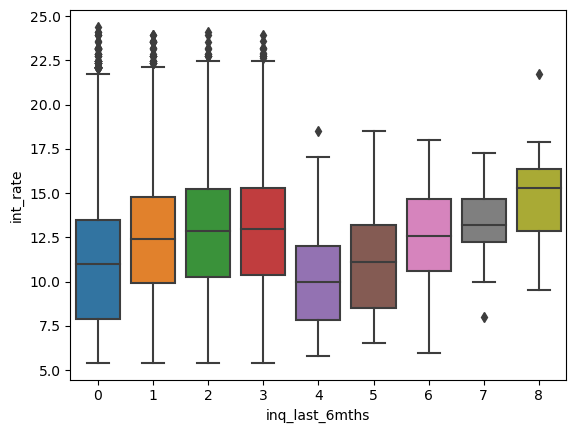

Median: 276.15
q1: 164.85
q3: 419.82
Median: 275.37
q1: 165.42
q3: 417.08
Median: 272.65
q1: 163.77
q3: 421.60
Median: 268.95
q1: 162.71
q3: 404.25
Median: 312.81
q1: 188.56
q3: 487.25
Median: 312.91
q1: 187.18
q3: 514.62
Median: 315.12
q1: 207.23
q3: 567.88
Median: 322.71
q1: 235.03
q3: 509.53
Median: 409.02
q1: 158.17
q3: 639.85


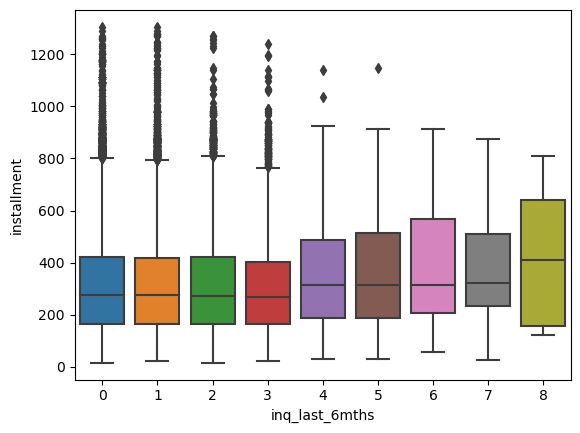

Median: 56810.46
q1: 40000.00
q3: 80000.00
Median: 57000.00
q1: 40000.00
q3: 80000.00
Median: 60000.00
q1: 41600.00
q3: 81504.00
Median: 60000.00
q1: 41148.00
q3: 82000.00
Median: 65000.00
q1: 47970.00
q3: 91000.00
Median: 64992.00
q1: 45000.00
q3: 89000.00
Median: 71802.00
q1: 45250.00
q3: 102000.00
Median: 69000.00
q1: 41000.00
q3: 81000.00
Median: 60000.00
q1: 34500.00
q3: 82100.00


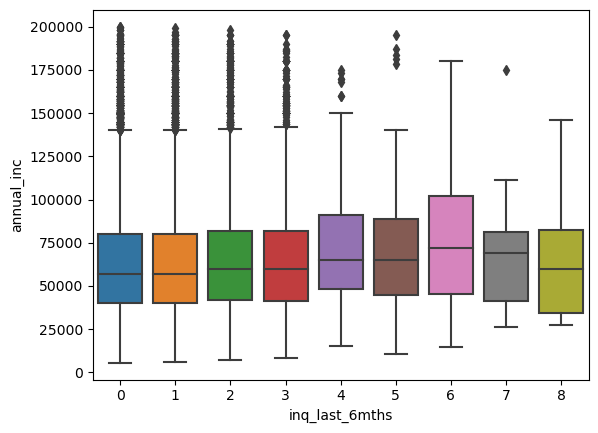

Median: 13.27
q1: 8.04
q3: 18.50
Median: 13.56
q1: 8.37
q3: 18.77
Median: 13.81
q1: 8.64
q3: 18.68
Median: 13.80
q1: 8.84
q3: 19.00
Median: 11.97
q1: 7.18
q3: 17.02
Median: 11.13
q1: 5.51
q3: 15.88
Median: 12.68
q1: 6.71
q3: 16.46
Median: 7.52
q1: 3.08
q3: 13.81
Median: 12.28
q1: 4.17
q3: 18.53


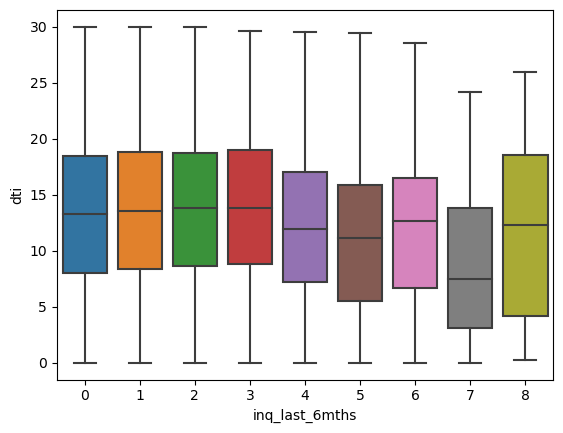

Median: 8.00
q1: 6.00
q3: 11.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 7.00
q3: 12.00
Median: 9.00
q1: 7.00
q3: 13.00
Median: 9.00
q1: 7.00
q3: 12.50
Median: 9.00
q1: 6.00
q3: 13.00
Median: 10.00
q1: 7.00
q3: 14.00
Median: 8.00
q1: 6.00
q3: 14.00
Median: 10.50
q1: 6.25
q3: 13.25


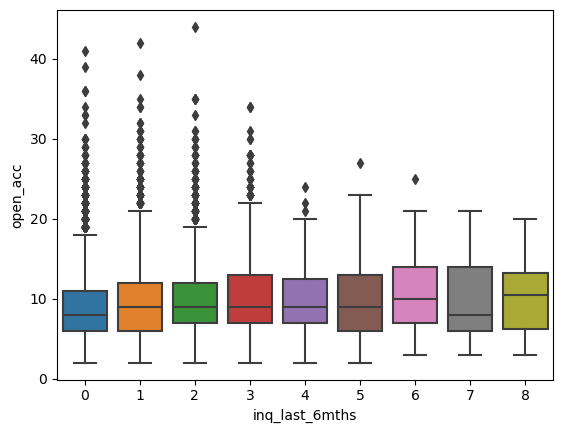

Median: 8866.00
q1: 3742.25
q3: 16796.75
Median: 8808.50
q1: 3737.75
q3: 16728.75
Median: 8358.00
q1: 3575.50
q3: 16645.00
Median: 7921.00
q1: 3113.75
q3: 15544.25
Median: 6204.00
q1: 1944.50
q3: 13883.00
Median: 5999.00
q1: 2166.50
q3: 12117.50
Median: 5158.00
q1: 432.00
q3: 16366.25
Median: 4938.00
q1: 1479.00
q3: 13631.00
Median: 6253.50
q1: 1652.75
q3: 30105.00


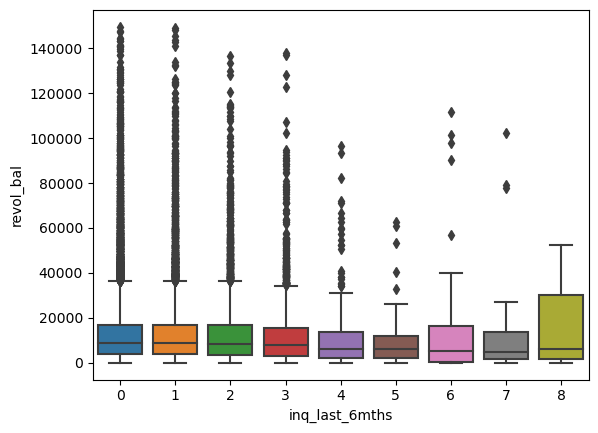

Median: 50.20
q1: 25.80
q3: 73.60
Median: 49.80
q1: 26.40
q3: 71.70
Median: 48.00
q1: 25.30
q3: 71.25
Median: 46.70
q1: 24.00
q3: 69.57
Median: 22.80
q1: 8.55
q3: 38.20
Median: 21.50
q1: 8.55
q3: 33.80
Median: 17.50
q1: 3.38
q3: 31.25
Median: 17.50
q1: 7.10
q3: 35.60
Median: 11.45
q1: 7.92
q3: 46.35


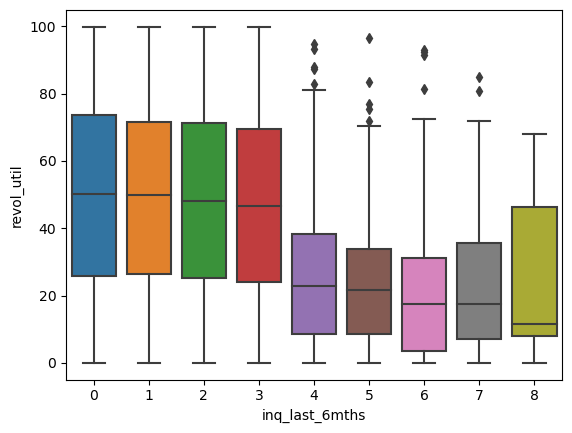

Median: 19.00
q1: 13.00
q3: 27.00
Median: 21.00
q1: 14.00
q3: 29.00
Median: 22.00
q1: 14.00
q3: 30.00
Median: 23.00
q1: 15.00
q3: 32.00
Median: 25.00
q1: 16.00
q3: 34.50
Median: 25.00
q1: 16.50
q3: 36.50
Median: 26.50
q1: 19.00
q3: 35.00
Median: 26.00
q1: 15.00
q3: 39.00
Median: 26.50
q1: 19.25
q3: 32.75


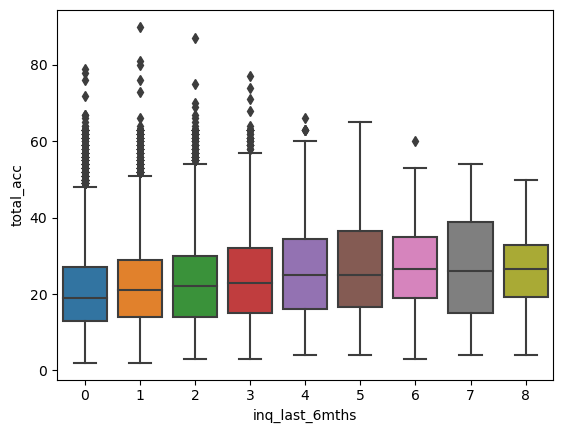

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


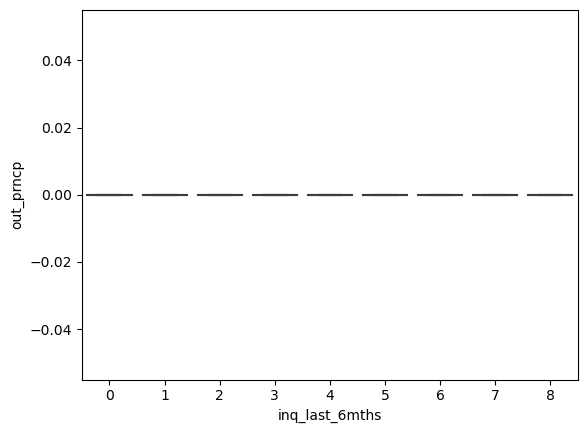

Median: 9810.27
q1: 5604.16
q3: 16077.16
Median: 9436.95
q1: 5405.04
q3: 15661.89
Median: 9242.95
q1: 5319.53
q3: 15758.89
Median: 8808.53
q1: 4804.65
q3: 14703.57
Median: 11163.54
q1: 6008.78
q3: 17775.64
Median: 10610.85
q1: 5801.88
q3: 16706.60
Median: 9881.77
q1: 5895.41
q3: 21223.06
Median: 9653.63
q1: 6488.94
q3: 15637.20
Median: 14486.11
q1: 5955.74
q3: 20012.68


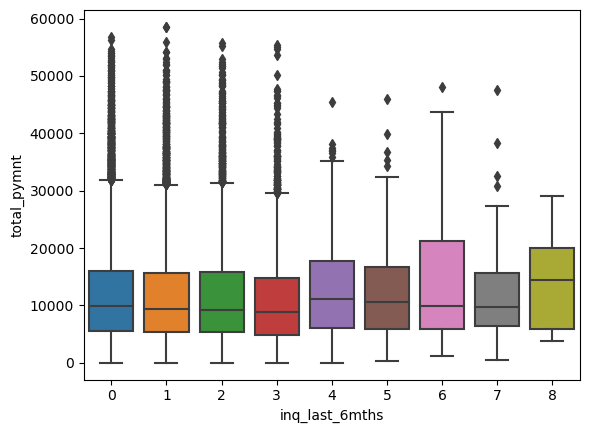

Median: 8000.00
q1: 4800.00
q3: 13225.00
Median: 8000.00
q1: 4200.00
q3: 12681.25
Median: 7750.00
q1: 4000.00
q3: 12800.00
Median: 7200.00
q1: 3669.05
q3: 12000.00
Median: 9700.00
q1: 5000.00
q3: 15000.00
Median: 8000.00
q1: 4950.00
q3: 14450.00
Median: 8529.83
q1: 4305.61
q3: 17904.37
Median: 8000.00
q1: 6000.00
q3: 12000.00
Median: 8418.01
q1: 5000.00
q3: 14250.00


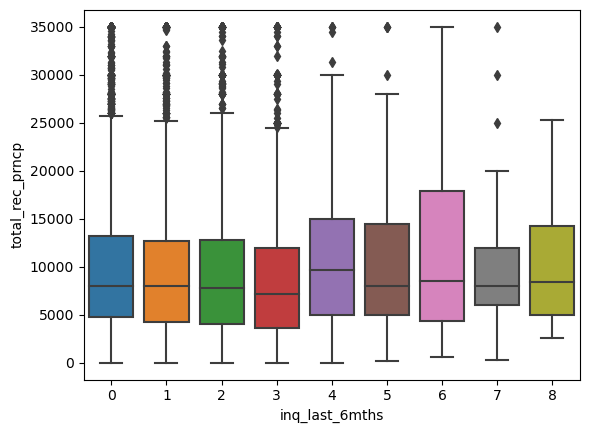

Median: 1253.07
q1: 622.69
q3: 2545.20
Median: 1306.74
q1: 657.68
q3: 2673.66
Median: 1345.16
q1: 656.53
q3: 2774.31
Median: 1285.41
q1: 632.15
q3: 2633.01
Median: 1241.09
q1: 612.26
q3: 2812.07
Median: 1275.10
q1: 649.66
q3: 2614.44
Median: 1462.37
q1: 660.42
q3: 3669.85
Median: 1433.43
q1: 1106.91
q3: 3092.00
Median: 2877.22
q1: 1207.81
q3: 4611.44


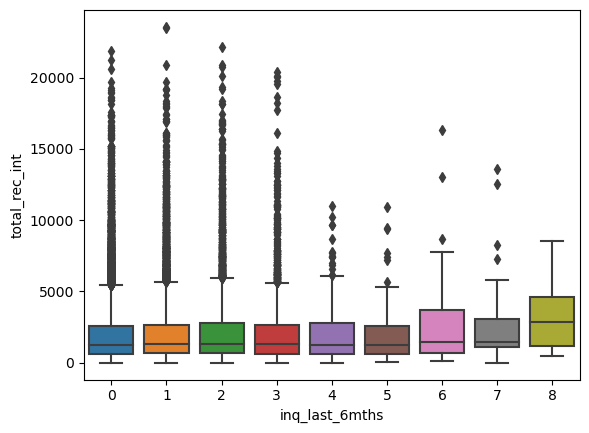

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


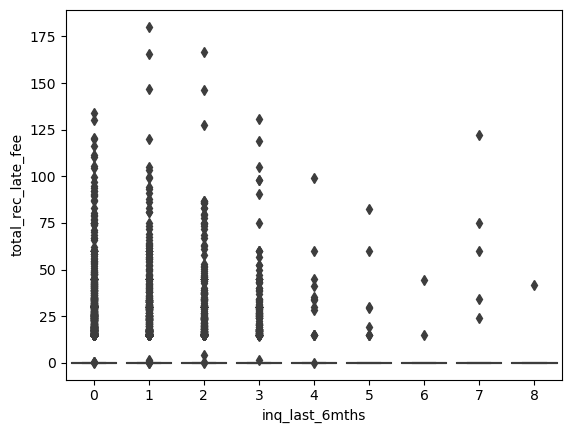

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


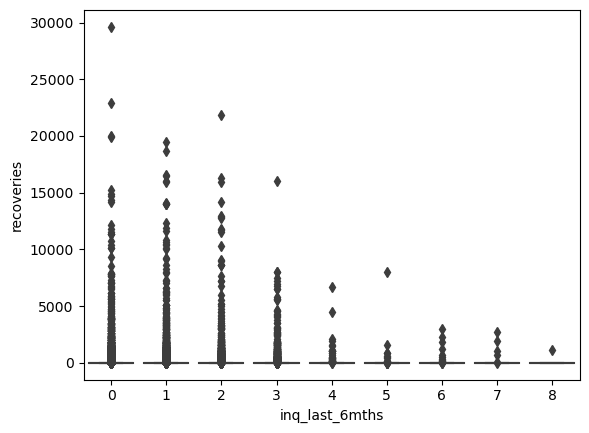

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


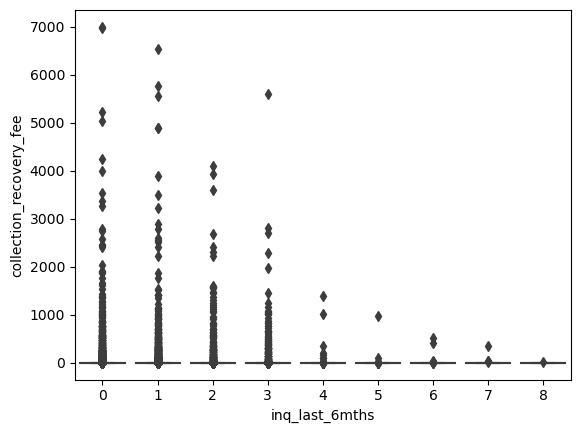

Median: 554.41
q1: 220.81
q3: 3177.94
Median: 559.75
q1: 209.79
q3: 3512.83
Median: 612.05
q1: 216.68
q3: 3766.79
Median: 507.90
q1: 200.41
q3: 3195.77
Median: 640.25
q1: 234.12
q3: 3830.49
Median: 945.98
q1: 344.91
q3: 5152.09
Median: 853.68
q1: 236.57
q3: 7338.13
Median: 1112.44
q1: 287.71
q3: 5318.99
Median: 741.57
q1: 264.03
q3: 2701.97


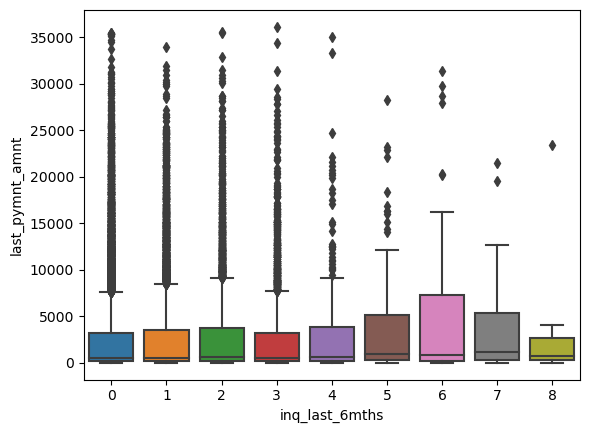

Median: 9600.00
q1: 5312.50
q3: 15000.00
Median: 8000.00
q1: 5000.00
q3: 12500.00
Median: 6000.00
q1: 4250.00
q3: 10000.00
Median: 4000.00
q1: 2800.00
q3: 6300.00
Median: 8600.00
q1: 7900.00
q3: 9300.00


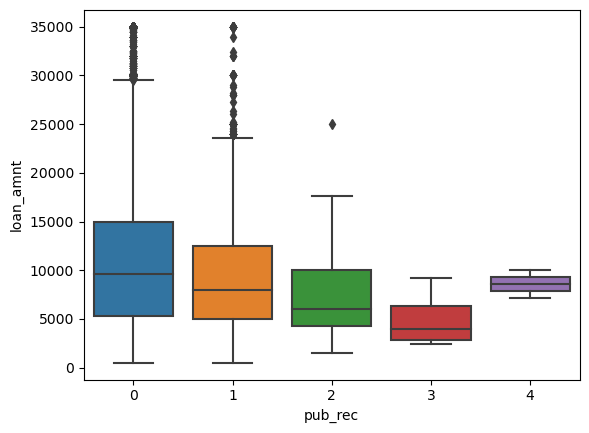

Median: 11.71
q1: 8.90
q3: 14.27
Median: 13.30
q1: 11.12
q3: 15.58
Median: 13.67
q1: 11.77
q3: 15.97
Median: 13.16
q1: 12.41
q3: 13.85
Median: 13.59
q1: 12.54
q3: 14.65


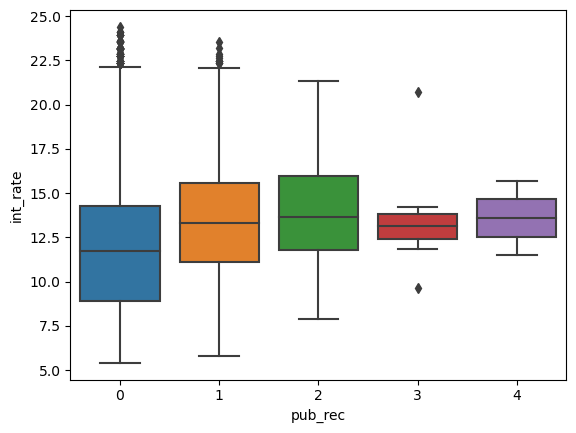

Median: 276.91
q1: 165.68
q3: 423.42
Median: 248.82
q1: 157.34
q3: 364.94
Median: 201.40
q1: 134.54
q3: 310.90
Median: 135.70
q1: 99.57
q3: 206.79
Median: 293.75
q1: 265.58
q3: 321.93


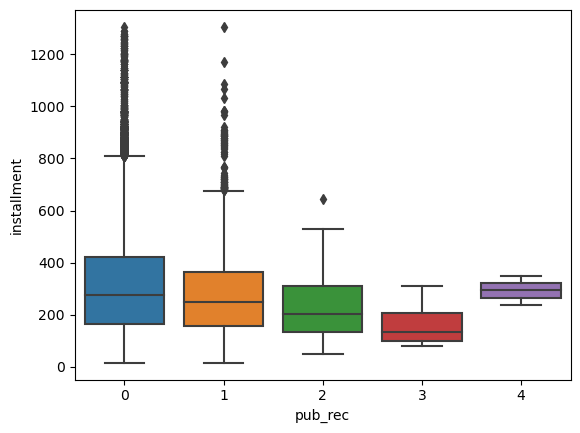

Median: 57996.00
q1: 40000.00
q3: 80000.00
Median: 56700.00
q1: 40000.00
q3: 76000.00
Median: 50004.00
q1: 33680.00
q3: 75378.00
Median: 72000.00
q1: 57500.00
q3: 110500.00
Median: 87450.00
q1: 80175.00
q3: 94725.00


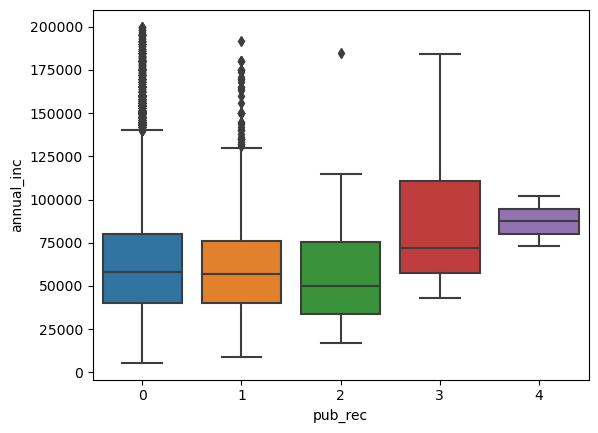

Median: 13.47
q1: 8.23
q3: 18.64
Median: 13.50
q1: 8.46
q3: 18.37
Median: 11.49
q1: 7.30
q3: 16.45
Median: 8.45
q1: 7.66
q3: 16.74
Median: 3.90
q1: 3.59
q3: 4.21


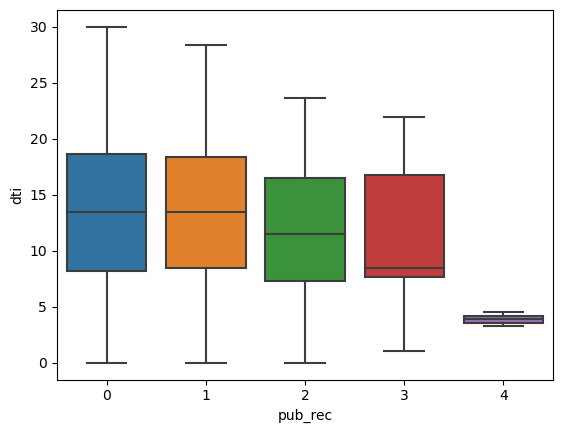

Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 7.00
q1: 5.00
q3: 10.50
Median: 6.00
q1: 6.00
q3: 10.50
Median: 6.50
q1: 6.25
q3: 6.75


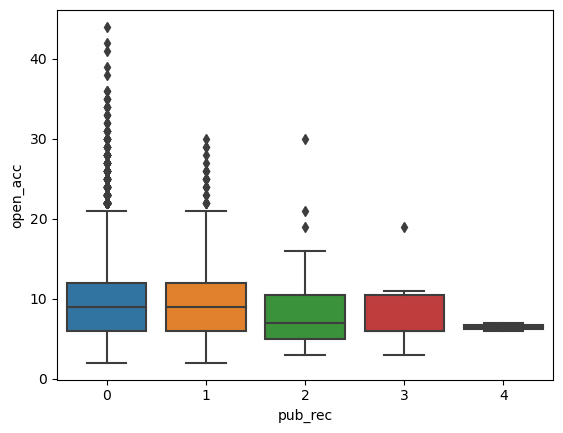

Median: 8794.00
q1: 3629.00
q3: 16940.50
Median: 7216.00
q1: 3623.00
q3: 12130.00
Median: 4414.00
q1: 881.50
q3: 7110.50
Median: 4930.00
q1: 2409.00
q3: 5656.00
Median: 5121.00
q1: 4721.50
q3: 5520.50


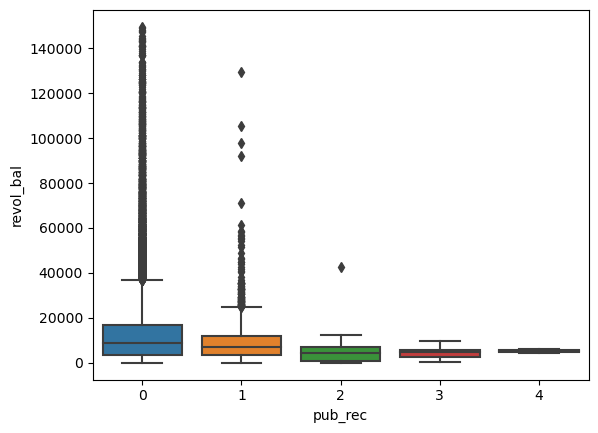

Median: 48.60
q1: 24.70
q3: 71.80
Median: 58.20
q1: 36.40
q3: 77.90
Median: 52.40
q1: 32.25
q3: 81.95
Median: 39.90
q1: 31.45
q3: 63.65
Median: 83.20
q1: 81.60
q3: 84.80


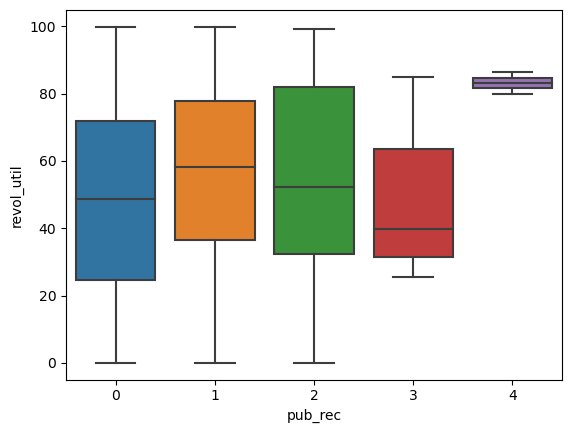

Median: 20.00
q1: 13.00
q3: 29.00
Median: 20.00
q1: 14.00
q3: 26.00
Median: 15.00
q1: 10.00
q3: 20.50
Median: 16.00
q1: 10.50
q3: 19.00
Median: 19.50
q1: 17.75
q3: 21.25


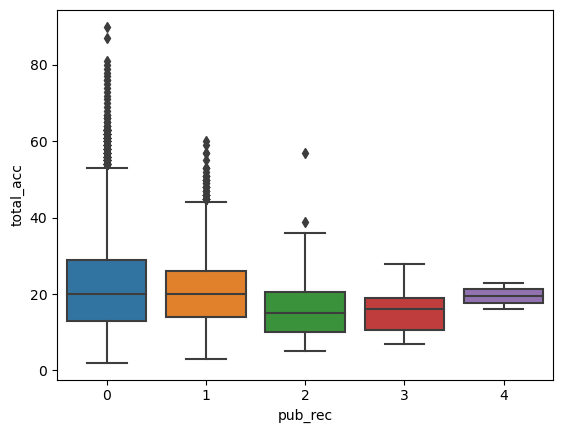

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


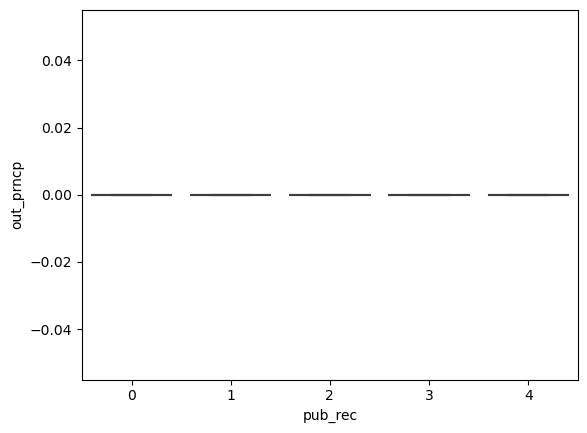

Median: 9663.38
q1: 5520.52
q3: 16005.89
Median: 7841.27
q1: 4660.54
q3: 13504.09
Median: 7192.30
q1: 4330.35
q3: 10722.64
Median: 4885.29
q1: 3579.47
q3: 7452.16
Median: 10498.38
q1: 9462.06
q3: 11534.69


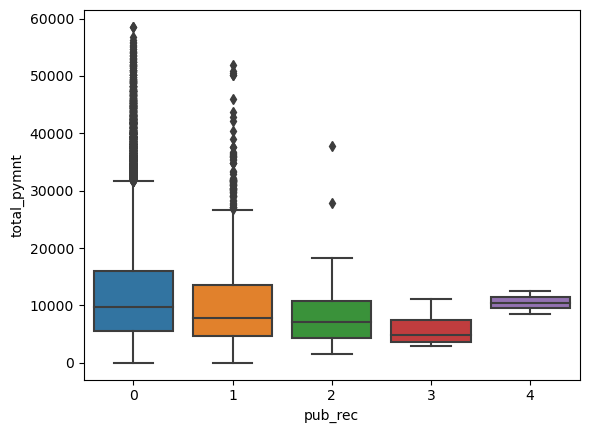

Median: 8000.00
q1: 4500.00
q3: 13000.00
Median: 6000.00
q1: 3434.51
q3: 10589.97
Median: 5850.00
q1: 3125.00
q3: 8000.00
Median: 4000.00
q1: 2800.00
q3: 6300.00
Median: 8600.00
q1: 7900.00
q3: 9300.00


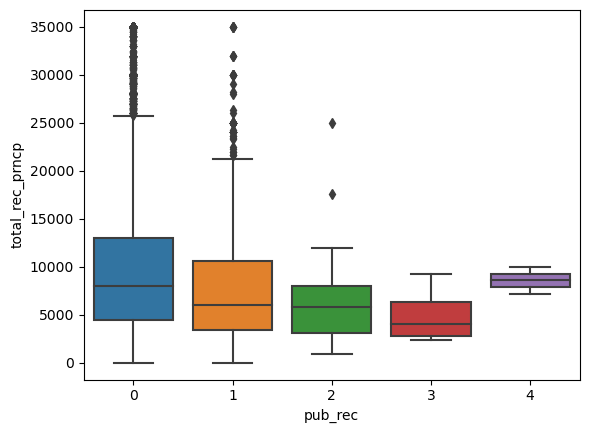

Median: 1282.73
q1: 635.36
q3: 2633.07
Median: 1311.70
q1: 679.68
q3: 2569.66
Median: 1389.25
q1: 863.36
q3: 2108.49
Median: 984.19
q1: 701.50
q3: 1196.93
Median: 1898.38
q1: 1562.06
q3: 2234.69


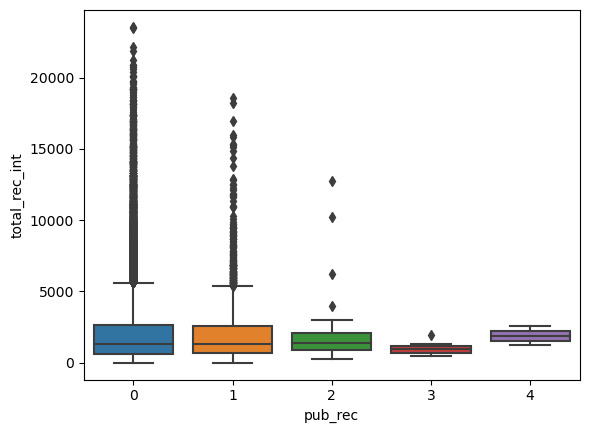

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


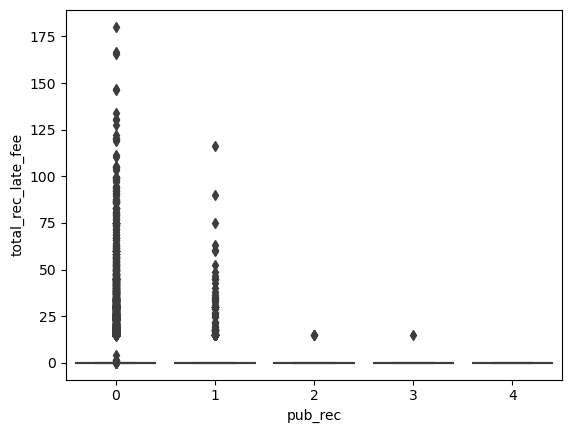

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


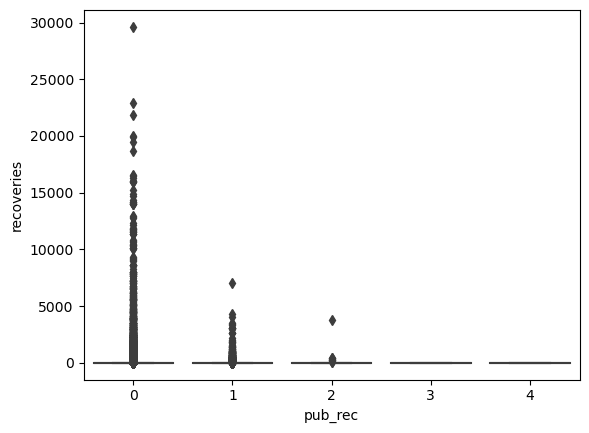

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


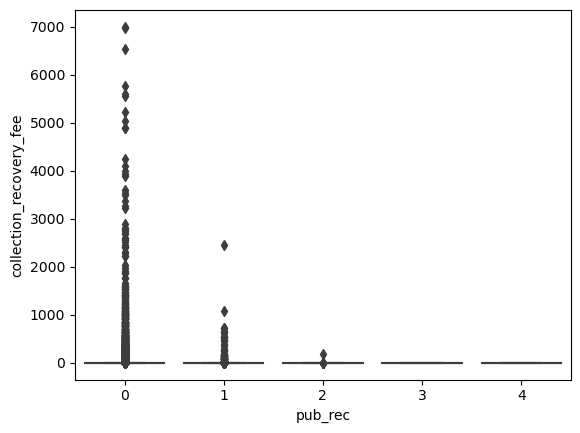

Median: 569.20
q1: 218.06
q3: 3423.89
Median: 404.68
q1: 180.95
q3: 2805.07
Median: 321.15
q1: 166.06
q3: 990.55
Median: 127.49
q1: 59.11
q3: 218.88
Median: 1370.84
q1: 805.38
q3: 1936.31


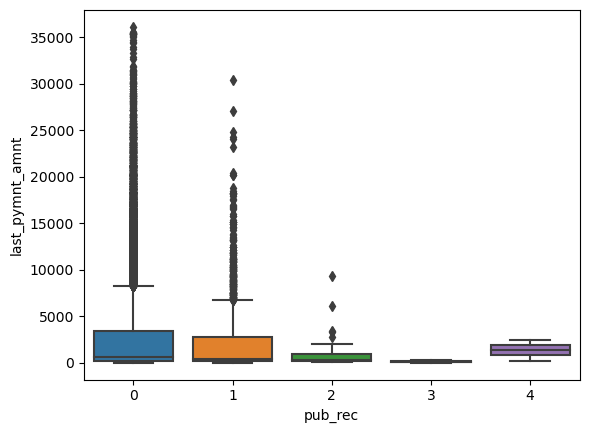

Median: 9600.00
q1: 5300.00
q3: 15000.00
Median: 8400.00
q1: 5000.00
q3: 13000.00
Median: 8000.00
q1: 3600.00
q3: 10000.00


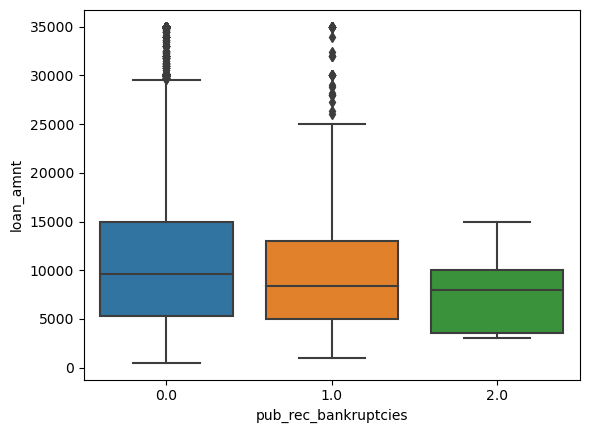

Median: 11.71
q1: 8.90
q3: 14.35
Median: 13.23
q1: 10.99
q3: 15.58
Median: 16.40
q1: 13.35
q3: 16.82


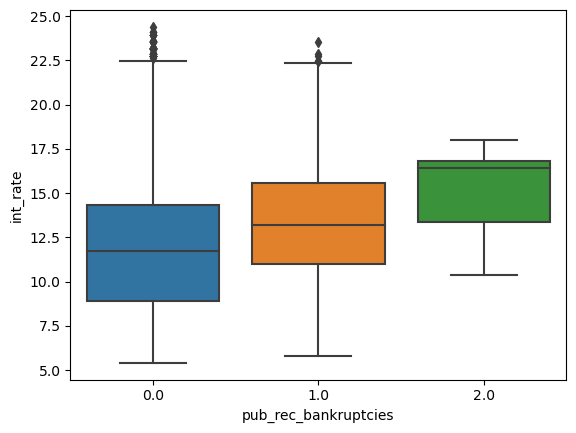

Median: 276.06
q1: 165.46
q3: 421.74
Median: 259.53
q1: 160.84
q3: 374.47
Median: 270.91
q1: 130.14
q3: 324.37


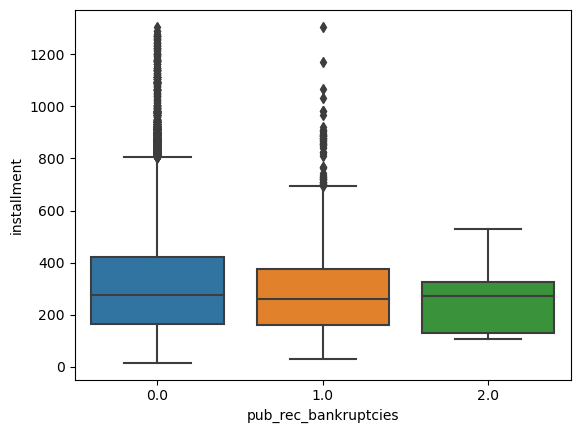

Median: 57996.00
q1: 40000.00
q3: 80000.00
Median: 57408.00
q1: 40800.00
q3: 77000.00
Median: 45600.00
q1: 37100.00
q3: 85000.00


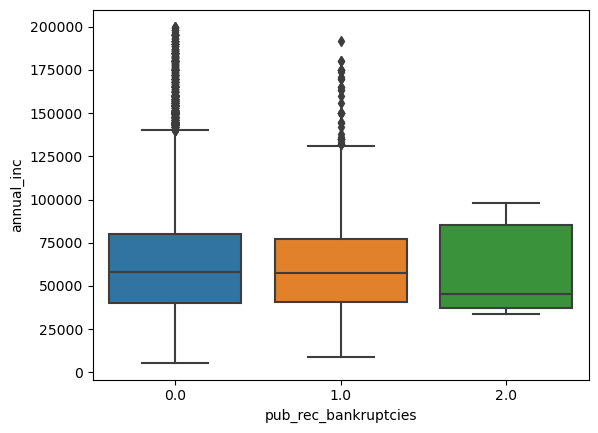

Median: 13.50
q1: 8.28
q3: 18.67
Median: 13.77
q1: 8.82
q3: 18.53
Median: 15.92
q1: 11.41
q3: 16.62


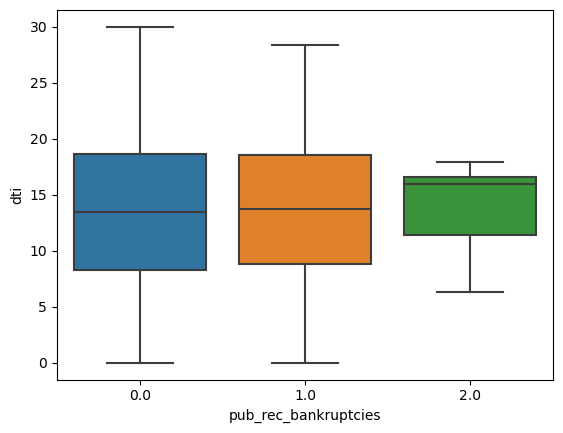

Median: 9.00
q1: 6.00
q3: 12.00
Median: 9.00
q1: 6.00
q3: 12.00
Median: 11.00
q1: 10.00
q3: 11.00


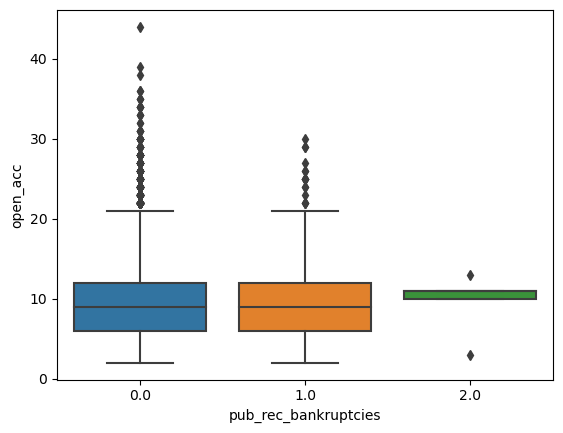

Median: 8752.00
q1: 3621.00
q3: 16862.00
Median: 7507.00
q1: 3970.00
q3: 12445.00
Median: 8723.00
q1: 4414.00
q3: 10170.00


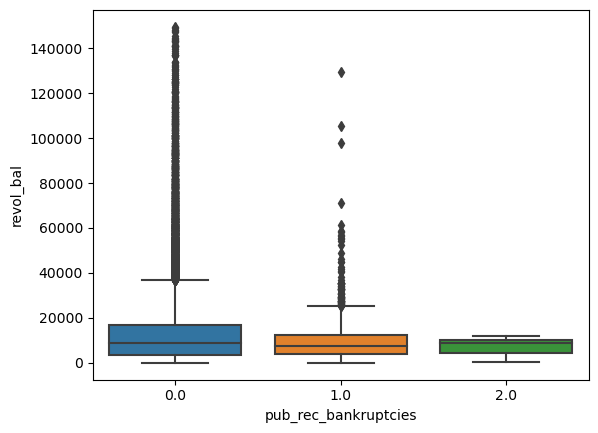

Median: 48.80
q1: 24.90
q3: 72.00
Median: 58.90
q1: 38.27
q3: 78.10
Median: 81.70
q1: 67.40
q3: 93.80


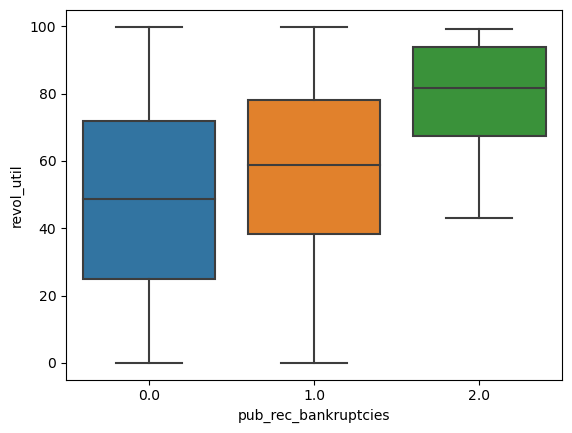

Median: 20.00
q1: 13.00
q3: 29.00
Median: 20.00
q1: 15.00
q3: 27.00
Median: 16.00
q1: 14.00
q3: 17.00


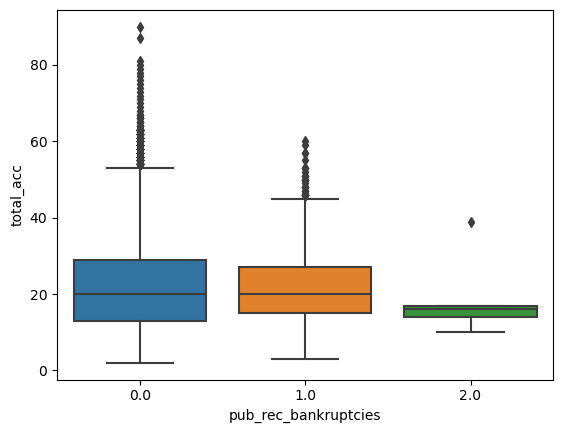

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


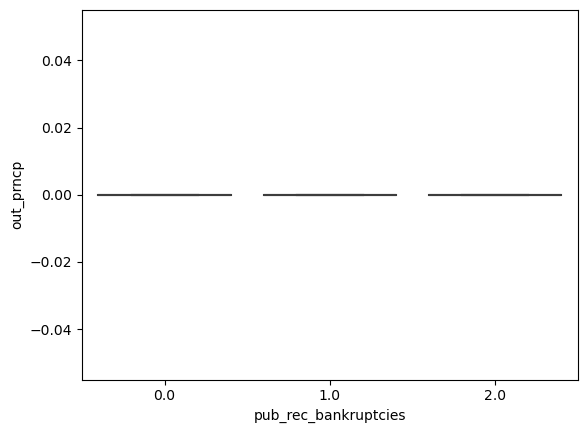

Median: 9648.01
q1: 5510.66
q3: 16008.14
Median: 8177.89
q1: 4747.83
q3: 13960.81
Median: 4679.79
q1: 3789.22
q3: 9753.42


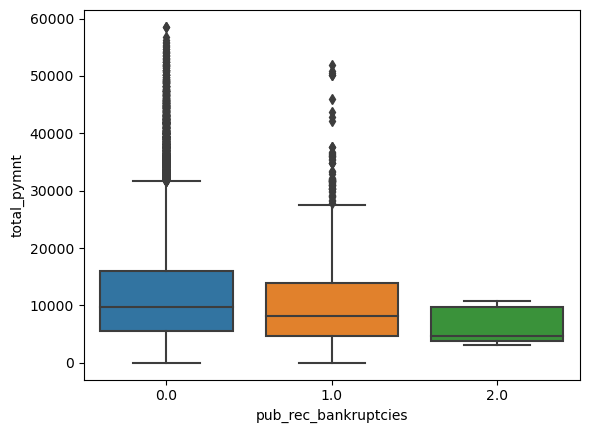

Median: 8000.00
q1: 4500.00
q3: 13000.00
Median: 6500.00
q1: 3500.00
q3: 11000.00
Median: 3600.00
q1: 3000.00
q3: 8000.00


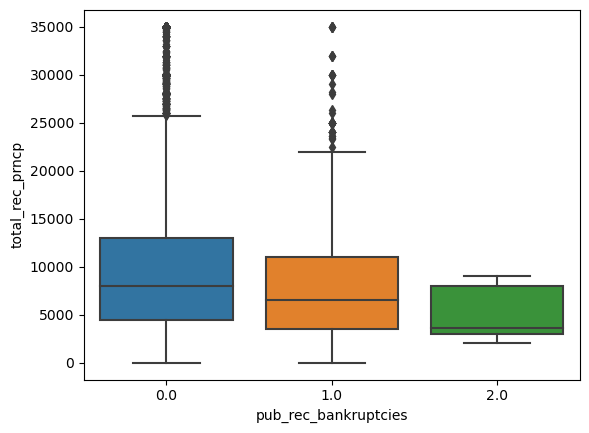

Median: 1283.96
q1: 637.66
q3: 2648.35
Median: 1335.09
q1: 687.98
q3: 2619.61
Median: 1159.45
q1: 1064.79
q3: 1659.16


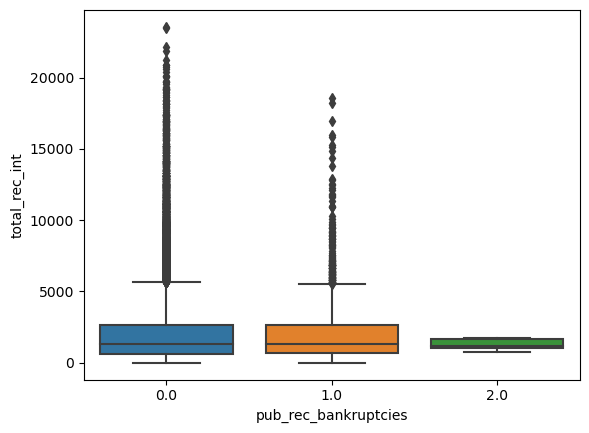

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


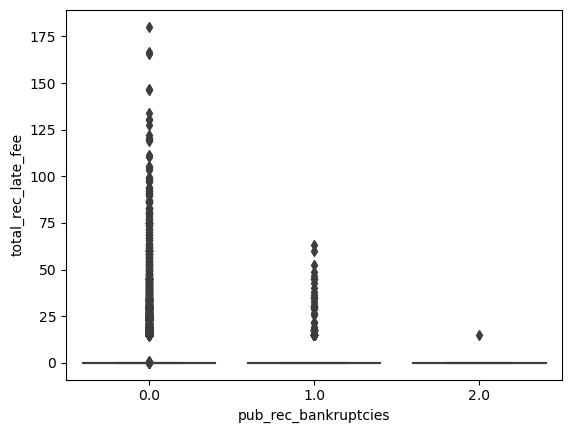

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


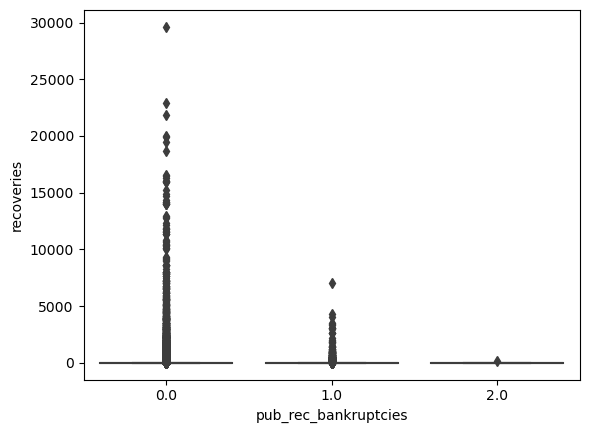

Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00
Median: 0.00
q1: 0.00
q3: 0.00


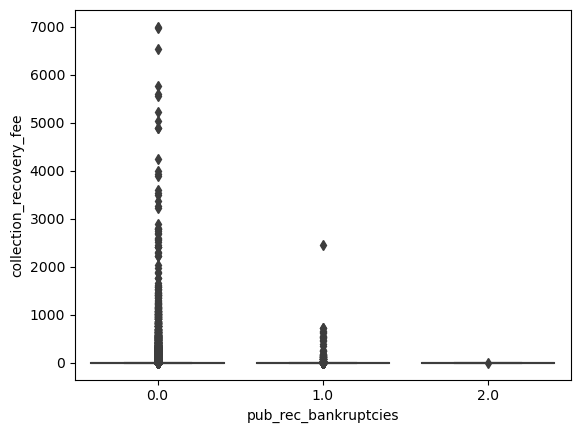

Median: 571.78
q1: 218.30
q3: 3444.81
Median: 429.12
q1: 183.80
q3: 3180.13
Median: 324.37
q1: 299.13
q3: 530.33


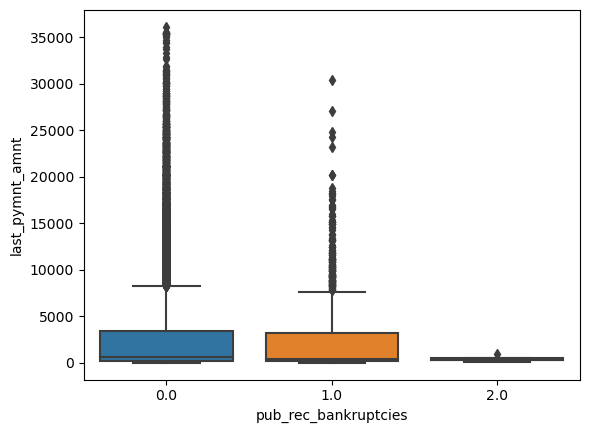

In [11]:
# categorical vs numerical column analysis
for col1 in cat_cols:
    df = df.sort_values(by=col1)
    for col2 in num_cols:
        sns.boxplot(x=df[col1], y=df[col2])
        
        # Calculate median and IQR
        medians = df.groupby([col1])[col2].median().values
        q1 = df.groupby([col1])[col2].quantile(0.25).values
        q3 = df.groupby([col1])[col2].quantile(0.75).values

        # Annotate plot with median and IQR values
        for i in range(len(medians)):
            print(f'Median: {medians[i]:.2f}\nq1: {q1[i]:.2f}\nq3: {q3[i]:.2f}')
        
        plt.show()

In [12]:
# function to plot default rate as count
def perc_abv_bar_rel_to_xgrp(ax):
    # explain
    # ax.containers is a list of bar containers, each container contains bars for a particular x group
    # all_heights is a list of lists, each inner list contains the height of each bar in a container
    # for each bar in a container, calculate the total height of all bars in the container
    # calculate the percentage of the bar height relative to the total height of all bars in the container
    # annotate the bar with the percentage
    all_heights=[[p.get_height() for p in bars] for bars in ax.containers]
    #print('cont:', ax.containers)
    #print('ht:', all_heights)
    for bars in ax.containers:
        for i, p in enumerate(bars):
            #print('i=', i, "p=", p)
            #total = sum(xgroup[i] for xgroup in all_heights)
            # copied row with id 1067874 to make this work, need to handle nulls in perc_abv_bar_rel_to_xgrp
            total = sum(xgroup[i] for xgroup in all_heights if i < len(xgroup))
            #print('tot=', total)
            perc = f'{(100 * p.get_height() / total) : .2f}%'
            ax.annotate(text=perc, xy=(p.get_x() + p.get_width() / 2, p.get_height()), size=11, ha='center', va='bottom')
        #print('----------------')

def plot_relation_to_loan_status(x, df):
    plt.figure(figsize=(12, 8))
    ax = sns.countplot(x=x, hue="loan_status", data=df)
    ax.set(xlabel=x, ylabel='count')
    perc_abv_bar_rel_to_xgrp(ax)
    plt.show()

In [13]:
# function to plot default rate as percentage
def plot_relation_to_loan_status_in_percent(x, df):    
    y = 'loan_status'
    
    # Calculate percentage of loan status by x
    df1 = df.groupby(x)[y].value_counts(normalize=True)
    df1 = df1.mul(100)
    df1 = df1.rename('loan_status %').reset_index()

    # Plot bar plot
    g = sns.catplot(x=x, y='loan_status %', hue=y, kind='bar', data=df1, aspect=1.35, height=8)
    g.ax.set_ylim(0, 100)
    
    # Plot trend line for each category
    means = df1.groupby([x, y]).mean().reset_index()
    for cat in means[y].unique():
        if cat == 'Charged Off':
            subset = means[means[y] == cat]
            x2 = np.arange(len(subset[x]))
            z = np.polyfit(x2, subset['loan_status %'], 1)
            p = np.poly1d(z)
            plt.plot(x2, p(x2), linestyle='--', color='gray')  # Overlay trend line

    # Add percentage labels
    for p in g.ax.patches:
        txt = f'{p.get_height() : .2f}%'
        txt_x = p.get_x() 
        txt_y = p.get_height()
        if np.isfinite(txt_x) and np.isfinite(txt_y):  # Check if position is finite
            g.ax.text(txt_x, txt_y, txt)
        
    plt.show()

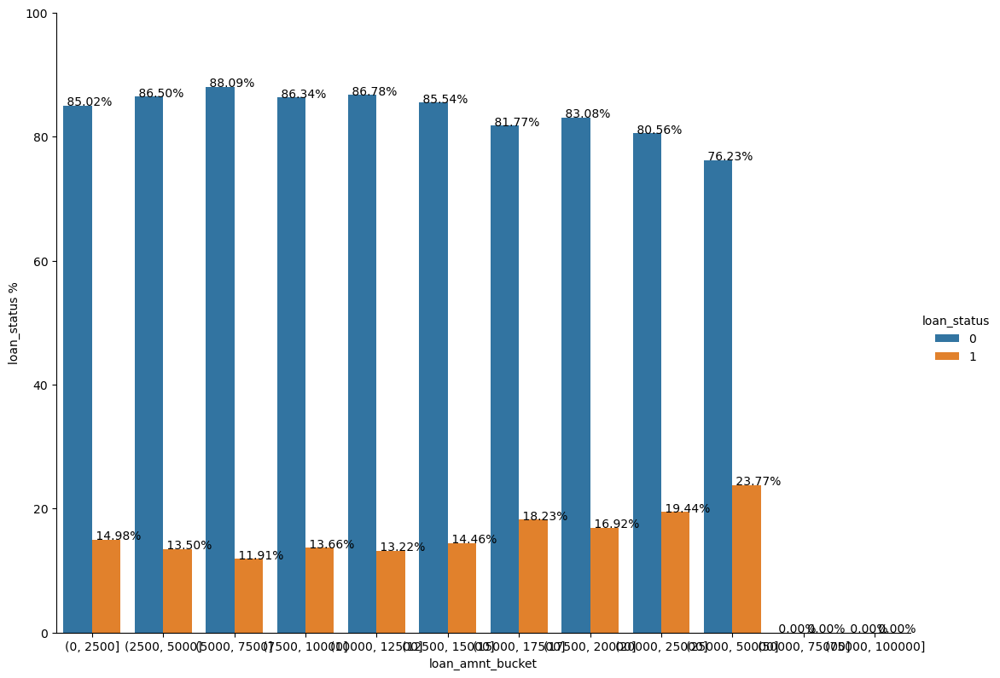

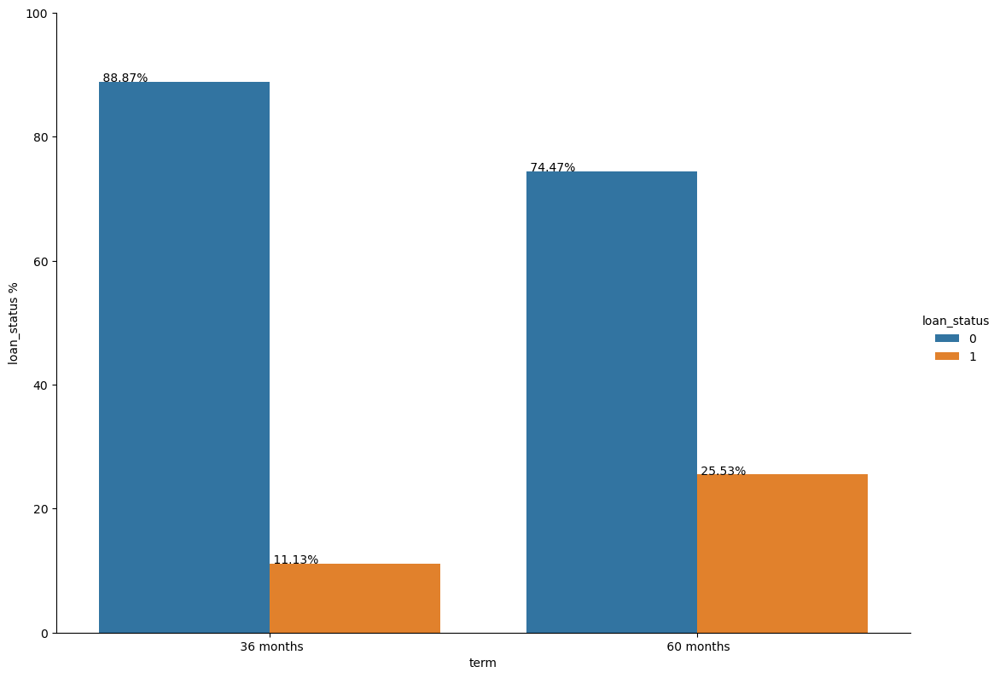

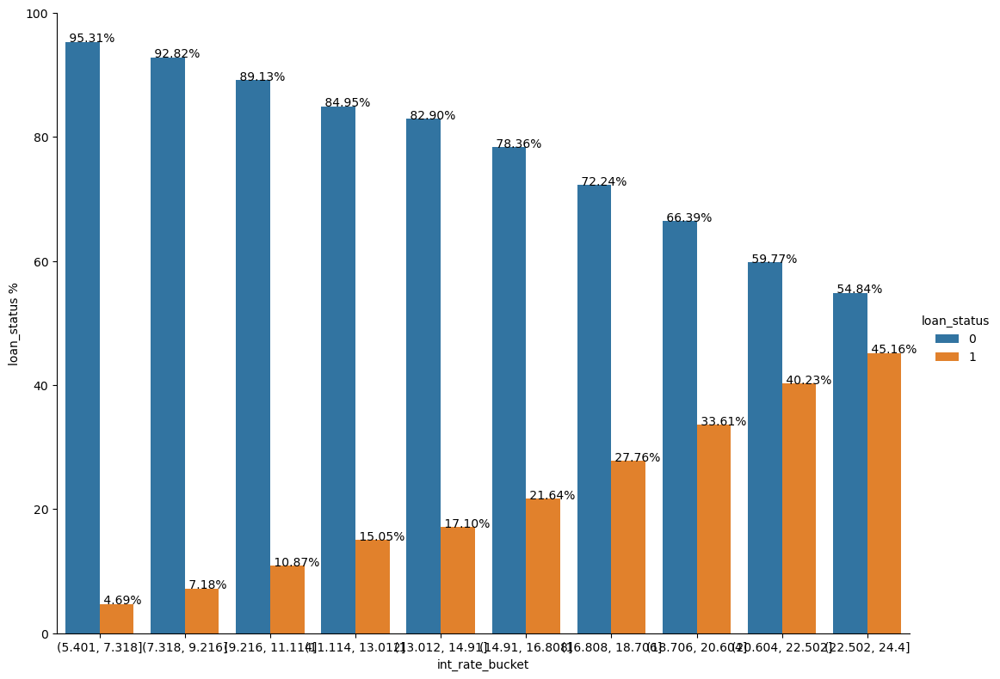

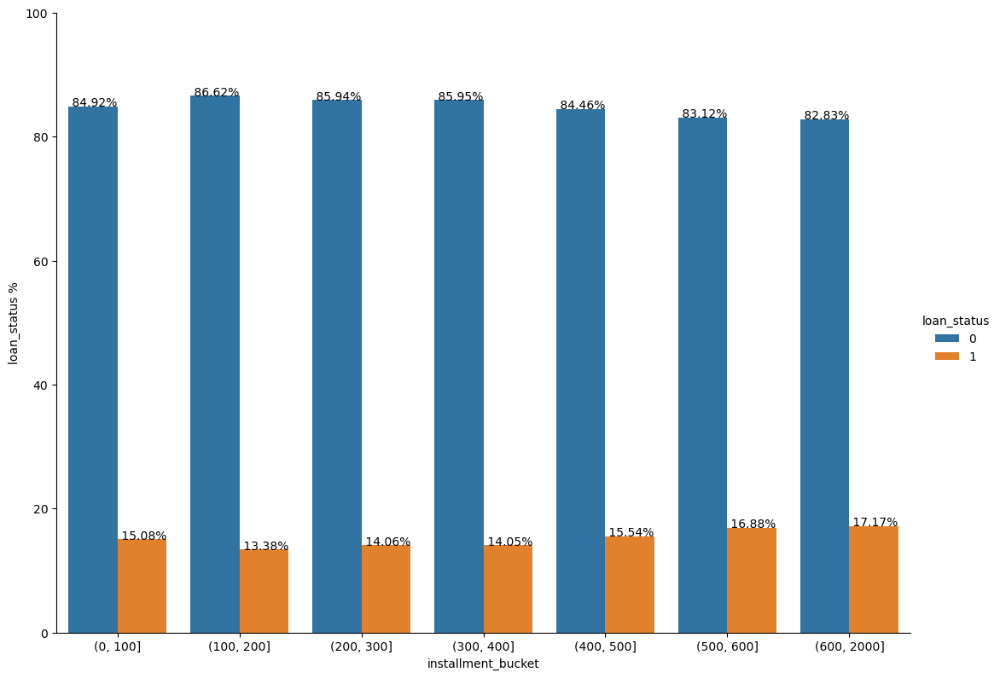

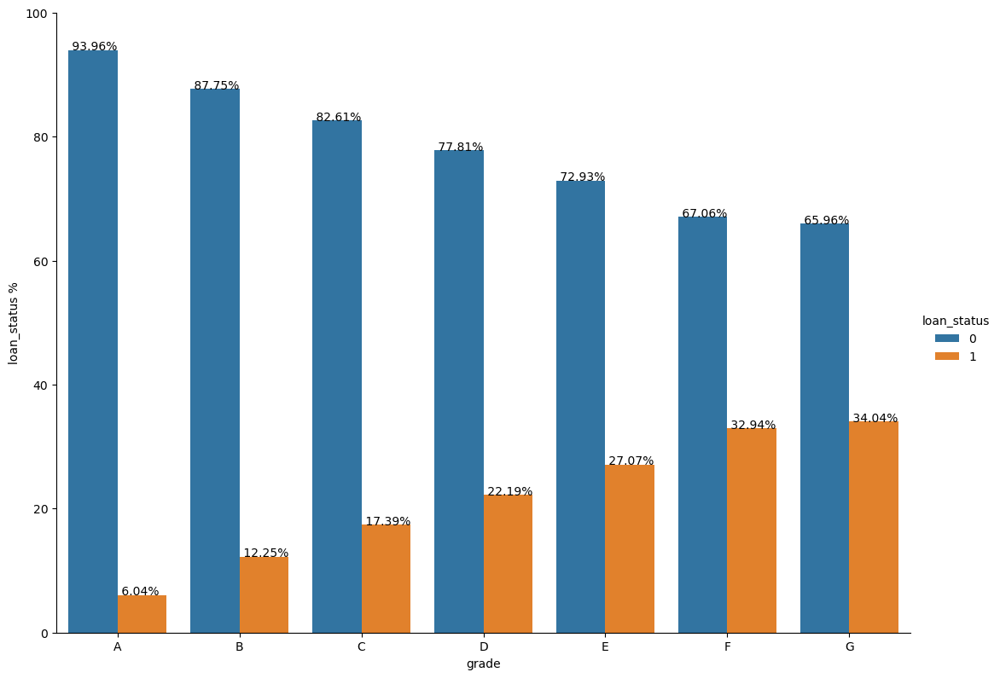

...

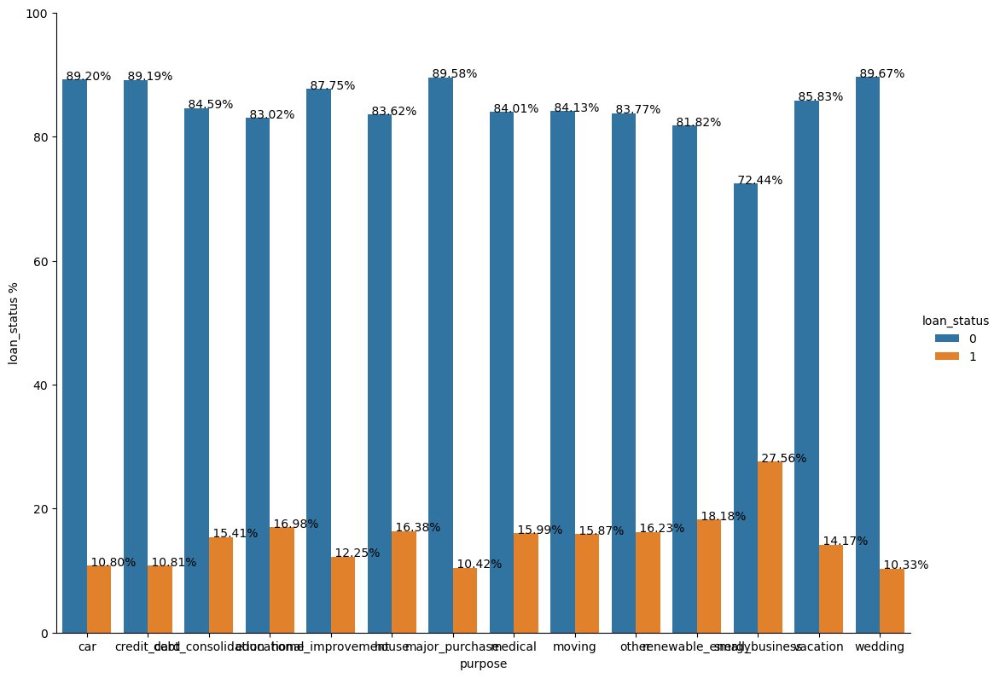

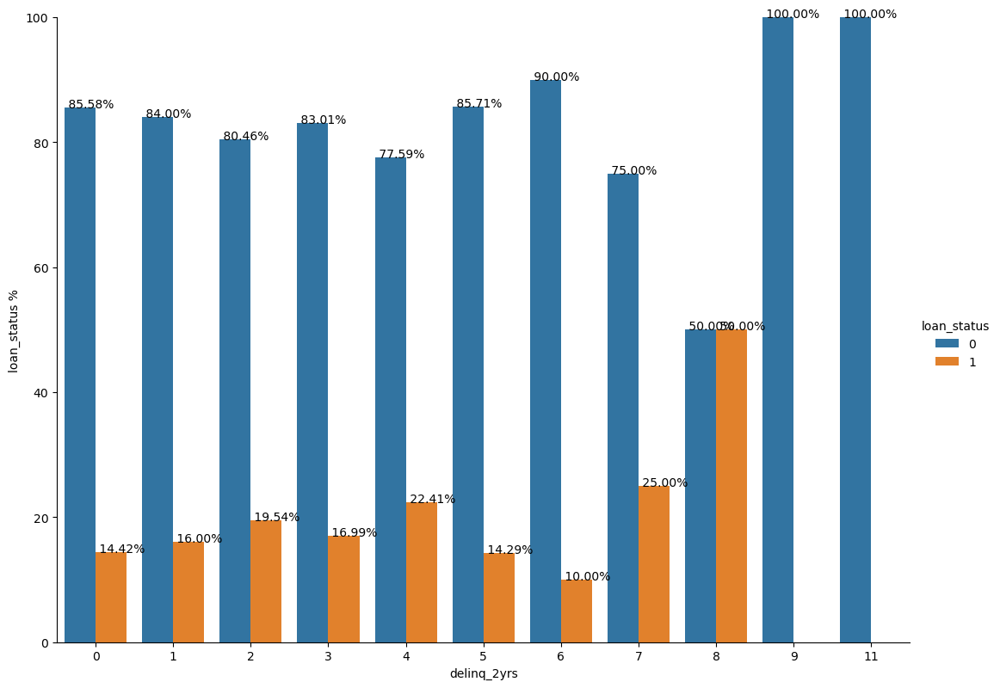

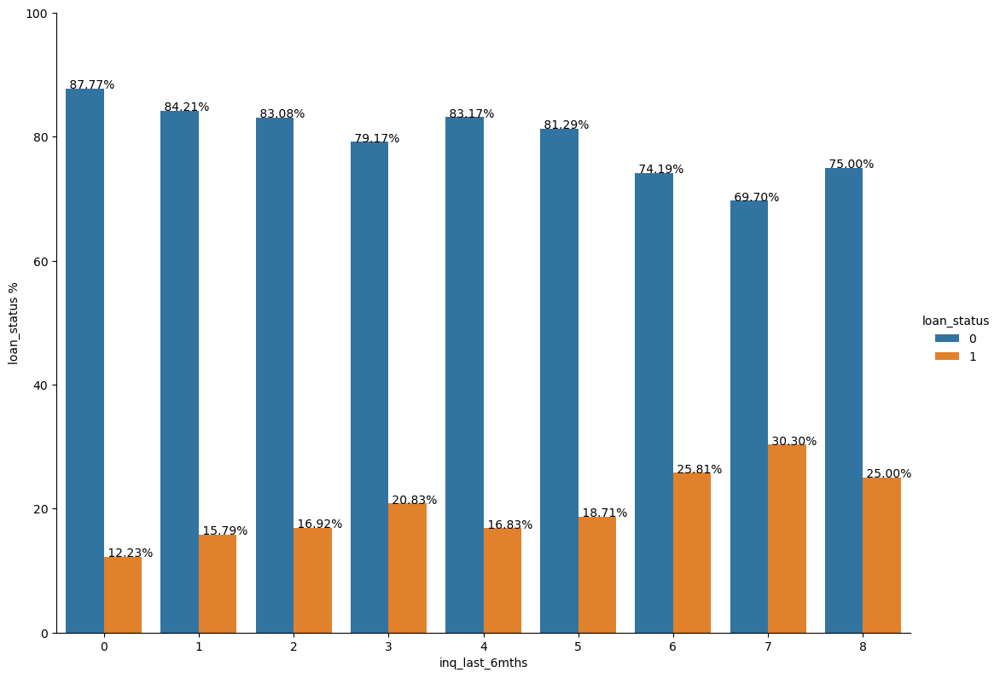

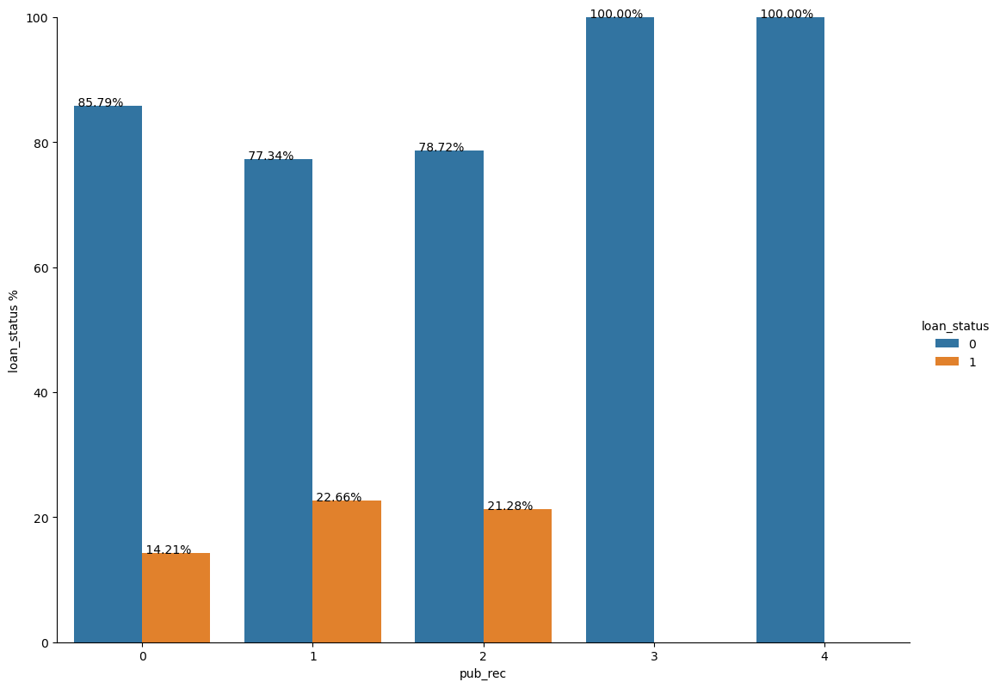

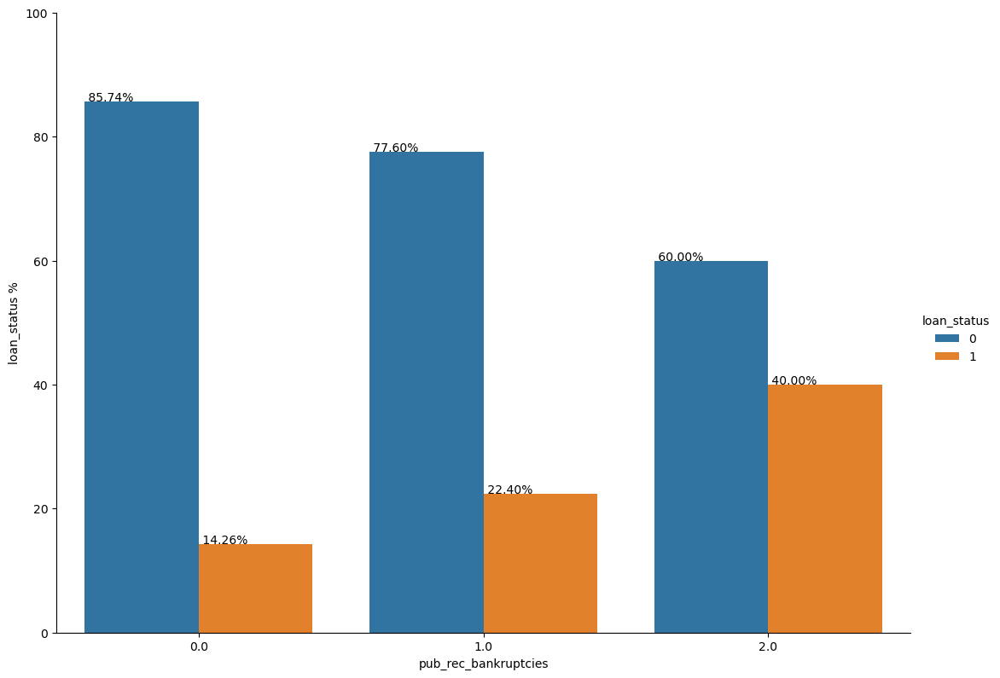

In [14]:
# plot default rate trend against each column
# 28 columns
cols_considered = ['loan_amnt_bucket', 'term', 'int_rate_bucket', 'installment_bucket', 'grade', 'sub_grade', 'emp_length', 
              'home_ownership', 'annual_inc_bucket', 'dti_bucket', 'open_acc_bucket', 'revol_bal_bucket', 
              'revol_util_bucket', 'total_acc_bucket', 'out_prncp_bucket', 'total_pymnt_bucket', 'total_rec_prncp_bucket', 
              'total_rec_int_bucket', 'total_rec_late_fee_bucket', 'recoveries_bucket', 'collection_recovery_fee_bucket', 
              'last_pymnt_amnt_bucket', 'verification_status', 'purpose', 'delinq_2yrs', 'inq_last_6mths', 'pub_rec', 
              'pub_rec_bankruptcies']
# 16 columns
cols_ignored = ['id', 'member_id', 'emp_title', 'url', 'desc', 'title', 'funded_amnt', 'funded_amnt_inv', 'out_prncp_inv', 
                'total_pymnt_inv', 'zip_code', 'addr_state', 'issue_d', 'earliest_cr_line', 'last_pymnt_d', 
                'last_credit_pull_d']

df['loan_amnt_bucket'] = pd.cut(df['loan_amnt'], bins=[0, 2500, 5000, 7500, 10000, 12500, 15000, 17500, 20000, 25000, 50000, 75000, 100000])
df['int_rate_bucket'] = pd.cut(df['int_rate'], 10)
df['installment_bucket'] = pd.cut(df['installment'], bins=[0, 100, 200, 300, 400, 500, 600, 2000])
df['annual_inc_bucket'] = pd.cut(df['annual_inc'], bins=[10000, 20000, 30000, 40000, 50000, 60000, 70000, 80000, 90000, 100000, 115000, 130000, 150000, 200000, 500000])
df['dti_bucket'] = pd.cut(df['dti'], 10)
df['open_acc_bucket'] = pd.cut(df['open_acc'], 10)
df['revol_bal_bucket'] = pd.cut(df['revol_bal'], bins=[0, 3000, 5000, 7500, 10000, 12500, 15000, 17500, 20000, 25000, 50000, 75000, 100000])
df['revol_util_bucket'] = pd.cut(df['revol_util'], 10)
df['total_acc_bucket'] = pd.cut(df['total_acc'], bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
df['out_prncp_bucket'] = pd.cut(df['out_prncp'], 10)
df['total_pymnt_bucket'] = pd.cut(df['total_pymnt'], 10)
df['total_rec_prncp_bucket'] = pd.cut(df['total_rec_prncp'], 10)
df['total_rec_int_bucket'] = pd.cut(df['total_rec_int'], 10)
df['total_rec_late_fee_bucket'] = pd.cut(df['total_rec_late_fee'], bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100, 110, 120, 130, 140, 150, 160, 170, 180, 190, 200])
df['recoveries_bucket'] = pd.cut(df['recoveries'], 10)
df['collection_recovery_fee_bucket'] = pd.cut(df['collection_recovery_fee'], 10)
df['last_pymnt_amnt_bucket'] = pd.cut(df['last_pymnt_amnt'], bins=[0, 100, 250, 400, 600, 800, 1000, 2000, 3000, 4000, 5000, 10000, 20000, 30000, 40000, 50000, 100000])

for col in cols_considered:
    plot_relation_to_loan_status_in_percent(col, df)